In [1]:
import pickle
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import copy
import matplotlib.animation as animation
import pandas as pd
import time
import itertools

In [2]:
sigma=1

In [3]:
def calculate_network_performance(G):
    # sd = dict(nx.shortest_path_length(G))

    if(len(G)==0):
        return 0
    
    gc_size = [len(c) for c in sorted(nx.connected_components(G), key=len, reverse=True)][0]
    return gc_size


def plot_functionality_ratio(failure_performance):
    plt.figure(figsize=(10, 5))
    steps = list(range(1, len(failure_performance) + 1))
    plt.plot(steps, failure_performance, marker='o', linestyle='-', color='blue')
    plt.title('Network Functionality Ratio During Failure')
    plt.xlabel('Step (Order of Node Failure)')
    plt.ylabel('Network Functionality Ratio')
    plt.grid(True)
    plt.show()

# FAILURE PROCESS

## Load Comms physics graphs

In [4]:
# Load the networks from the gpickle file
with open("all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)

In [5]:
G=networks["Warsaw"]

# Degree Failure

In [8]:
def simulate_failure_degree(G, sigma):
    H = copy.deepcopy(G)
    
    # Calculate the number of nodes to remove based on sigma percentage
    num_nodes_to_remove = int(sigma * len(G.nodes))
    seq_removed_degree=[]
    failure_performance = []
    initial_performance = calculate_network_performance(G)
    print("Initial perfr is : ", initial_performance)
    nodes_sorted_by_degree = sorted(G.nodes, key=lambda n: G.degree[n], reverse=True)[:num_nodes_to_remove]
    failure_performance.append(1)
    print(f'Functionality after removing node 0: {1}')
    i = 1
    for node in nodes_sorted_by_degree:
        # Remove the node and its edges
        if node in H.nodes:
            H.remove_node(node)
            seq_removed_degree.append(node)
        
        # Calculate the current performance and functionality ratio
        current_performance = calculate_network_performance(H)
        functionality_ratio = current_performance / initial_performance
        failure_performance.append(functionality_ratio)
        # visualize_graph_with_geo_coords(H)
        print(f'Functionality after removing node {i}: {functionality_ratio}')
        i += 1
    
    return failure_performance, seq_removed_degree



# Betweeness Failure

In [9]:
def simulate_failure_betweenness(G, sigma):
    H = copy.deepcopy(G)
    
    num_nodes_to_remove = int(sigma * len(G.nodes))
    failure_performance = []
    seq_removed_betweenness = []
    initial_performance = calculate_network_performance(G)
    
    betweenness_centrality = nx.betweenness_centrality(G)
    nodes_sorted_by_betweenness = sorted(G.nodes, key=lambda n: betweenness_centrality[n], reverse=True)[:num_nodes_to_remove]
    
    failure_performance.append(1)
    i = 1
    for node in nodes_sorted_by_betweenness:
        if node in H.nodes:
            H.remove_node(node)
            seq_removed_betweenness.append(node)
        
        current_performance = calculate_network_performance(H)
        functionality_ratio = current_performance / initial_performance
        failure_performance.append(functionality_ratio)
        # print(f'Functionality after removing node {i}: {functionality_ratio}')
        i += 1
    
    return failure_performance, seq_removed_betweenness


# Greedy Failure

In [10]:
def simulate_failure_greedy(G, sigma):
    H = copy.deepcopy(G)
    
    # Calculate the number of nodes to remove based on sigma percentage
    num_nodes_to_remove = int(sigma * len(G.nodes))
    
    failure_performance = []
    seq_removed_greedy = []
    initial_performance = calculate_network_performance(G)
    print("Initial performance is: ", initial_performance)
    
    remaining_nodes = set(H.nodes)
    
    failure_performance.append(1)
    i = 1
    while len(remaining_nodes) > len(G.nodes) - num_nodes_to_remove:
        print("Number of remaining nodes are", len(remaining_nodes))
        worst_performance = float('inf')
        worst_node = None

        # Test failure for each remaining node
        for node in remaining_nodes:
            test_graph = copy.deepcopy(H)
            if node in test_graph:
                test_graph.remove_node(node)

            # Calculate performance if this node were removed
            test_performance = calculate_network_performance(test_graph)
            if test_performance <= worst_performance:
                worst_performance = test_performance
                worst_node = node
        
        # Remove the worst node from H for real
        if worst_node is not None:
            H.remove_node(worst_node)
            seq_removed_greedy.append(worst_node)
            functionality_ratio = worst_performance / initial_performance
            failure_performance.append(functionality_ratio)
            print(f'Functionality after removing node {i}: {functionality_ratio}')
            remaining_nodes.remove(worst_node)
            i += 1
    
    return failure_performance, seq_removed_greedy



# Random Failure

In [11]:
def simulate_failure_random(G, sigma):
    H = copy.deepcopy(G)
    
    num_nodes_to_remove = int(sigma * len(G.nodes))
    failure_performance = []
    seq_removed_random = []
    initial_performance = calculate_network_performance(G)
    
    nodes_randomly_selected = np.random.choice(G.nodes, num_nodes_to_remove, replace=False)
    
    failure_performance.append(1)
    i = 1
    for node in nodes_randomly_selected:
        if node in H.nodes:
            H.remove_node(node)
            seq_removed_random.append(node)
        
        current_performance = calculate_network_performance(H)
        functionality_ratio = current_performance / initial_performance
        failure_performance.append(functionality_ratio)
        print(f'Functionality after removing node {i}: {functionality_ratio}')
        i += 1
    
    return failure_performance, seq_removed_random



# Eigen Vector

In [12]:
def simulate_failure_eigen(G, sigma):
    H = copy.deepcopy(G)
    
    num_nodes_to_remove = int(sigma * len(G.nodes))
    failure_performance = []
    initial_performance = calculate_network_performance(G)
    seq_removed_eigen=[]

    try:
        eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=5000, tol=1e-06)
    except nx.PowerIterationFailedConvergence:
        print("Eigenvector centrality failed to converge, trying with a random start vector.")
        nstart = {n: 1 for n in G.nodes()}  # Start with equal centrality assumption
        eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=500, tol=1e-06, nstart=nstart)
    
    nodes_sorted_by_eigenvector = sorted(G.nodes, key=lambda n: eigenvector_centrality[n], reverse=True)[:num_nodes_to_remove]
    
    failure_performance.append(1)
    i = 1
    for node in nodes_sorted_by_eigenvector:
        if node in H.nodes:
            H.remove_node(node)
            seq_removed_eigen.append(node)
        current_performance = calculate_network_performance(H)
        functionality_ratio = current_performance / initial_performance
        failure_performance.append(functionality_ratio)
        print(f'Functionality after removing node {i}: {functionality_ratio}')
        i += 1
    
    return failure_performance, seq_removed_eigen


# Closeness Failure

In [13]:
def simulate_failure_closeness(G, sigma):
    H = copy.deepcopy(G)
    
    num_nodes_to_remove = int(sigma * len(G.nodes))
    failure_performance = []
    initial_performance = calculate_network_performance(G)
    seq_removed_closeness=[]
    closeness_centrality = nx.closeness_centrality(G)
    nodes_sorted_by_closeness = sorted(G.nodes, key=lambda n: closeness_centrality[n], reverse=True)[:num_nodes_to_remove]
    
    failure_performance.append(1)
    i = 1
    for node in nodes_sorted_by_closeness:
        if node in H.nodes:
            H.remove_node(node)
            seq_removed_closeness.append(node)
        
        current_performance = calculate_network_performance(H)
        functionality_ratio = current_performance / initial_performance
        failure_performance.append(functionality_ratio)
        print(f'Functionality after removing node {i}: {functionality_ratio}')
        i += 1
    
    return failure_performance, seq_removed_closeness


## DomiRank Failure

In [14]:
import copy
import numpy as np
import networkx as nx
import time

def domirank(G, sigma=-1, dt=0.1, epsilon=1e-5, maxIter=1000, checkStep=10):
    if isinstance(G, nx.Graph):  # Check if it is a NetworkX graph
        G = nx.to_scipy_sparse_array(G)  # Convert to scipy sparse array if it is a graph
    else:
        G = G.copy()
    if sigma == -1:
        sigma = optimal_sigma(G, dt=dt, epsilon=epsilon, maxIter=maxIter, checkStep=checkStep)
    pGAdj = sigma * G.astype(np.float32)
    Psi = np.zeros(pGAdj.shape[0]).astype(np.float32)
    maxVals = np.zeros(int(maxIter / checkStep)).astype(np.float32)
    dt = np.float32(dt)
    j = 0
    boundary = epsilon * pGAdj.shape[0] * dt
    for i in range(maxIter):
        tempVal = ((pGAdj @ (1 - Psi)) - Psi) * dt
        Psi += tempVal.real
        if i % checkStep == 0:
            if np.abs(tempVal).sum() < boundary:
                break
            maxVals[j] = tempVal.max()
            if i == 0:
                initialChange = maxVals[j]
            if j > 0:
                if maxVals[j] > maxVals[j - 1] and maxVals[j - 1] > maxVals[j - 2]:
                    return False, Psi
            j += 1

    return True, Psi

def find_eigenvalue(G, minVal=0, maxVal=1, maxDepth=1000, dt=0.1, epsilon=1e-5, maxIter=1000, checkStep=100):
    x = (minVal + maxVal) / G.sum(axis=-1).max()
    minValStored = 0
    for i in range(maxDepth):
        if maxVal - minVal < epsilon:
            break
        if domirank(G, x, dt, epsilon, maxIter, checkStep)[0]:
            minVal = x
            x = (minVal + maxVal) / 2
            minValStored = minVal
        else:
            maxVal = (x + maxVal) / 2
            x = (minVal + maxVal) / 2
        if minVal == 0:
            print(f'Current Interval : [-inf, -{1 / maxVal}]')
        else:
            print(f'Current Interval : [-{1 / minVal}, -{1 / maxVal}]')
    finalVal = (maxVal + minVal) / 2
    return -1 / finalVal

def process_iteration(q, i, sigma, spArray, maxIter, checkStep, dt, epsilon, sampling):
    tf, domiDist = domirank(spArray, sigma, dt=dt, epsilon=epsilon, maxIter=maxIter, checkStep=checkStep)
    domiAttack = generate_attack(domiDist)
    ourTempAttack, __ = network_attack_sampled(spArray, domiAttack, sampling=sampling)
    finalErrors = ourTempAttack.sum()
    q.put(finalErrors)

def optimal_sigma(spArray, endVal=0, startval=0.000001, iterationNo=100, dt=0.1, epsilon=1e-5, maxIter=100, checkStep=10, maxDepth=100, sampling=0):
    if endVal == 0:
        endVal = find_eigenvalue(spArray, maxDepth=maxDepth, dt=dt, epsilon=epsilon, maxIter=maxIter, checkStep=checkStep)
    import multiprocessing as mp
    endval = -0.9999 / endVal
    tempRange = np.arange(startval, endval + (endval - startval) / iterationNo, (endval - startval) / iterationNo)
    processes = []
    q = mp.Queue()
    for i, sigma in enumerate(tempRange):
        p = mp.Process(target=process_iteration, args=(q, i, sigma, spArray, maxIter, checkStep, dt, epsilon, sampling))
        p.start()
        processes.append(p)

    results = []
    for p in processes:
        p.join()
        result = q.get()
        results.append(result)
    finalErrors = np.array(results)
    minEig = np.where(finalErrors == finalErrors.min())[0][-1]
    minEig = tempRange[minEig]
    return minEig, finalErrors
optimal_sigma_value = 0.26

def simulate_failure_domirank(G, sigma, alpha=0.85, beta=0.1, theta=1.0):
    H = copy.deepcopy(G)
    
    num_nodes_to_remove = int(sigma * len(G.nodes))
    failure_performance = []
    seq_removed_domirank=[]
    initial_performance = calculate_network_performance(G)
    # print("Initial performance is: ", initial_performance)

    converged, domirank_centrality = domirank(nx.to_scipy_sparse_array(G), sigma=optimal_sigma_value)
    if not converged:
        print("Warning: DomiRank calculation did not converge. Results may be inaccurate.")

    # Mapping nodes to their DomiRank centrality values
    domirank_dict = {node: domirank_centrality[i] for i, node in enumerate(G.nodes)}

    nodes_sorted_by_domirank = sorted(G.nodes, key=lambda n: domirank_dict[n], reverse=True)[:num_nodes_to_remove]
    
    failure_performance.append(1)
    i = 1
    for node in nodes_sorted_by_domirank:
        if node in H.nodes:
            H.remove_node(node)
            seq_removed_domirank.append(node)
        current_performance = calculate_network_performance(H)
        functionality_ratio = current_performance / initial_performance
        failure_performance.append(functionality_ratio)
        # print(f'Functionality after removing node {i}: {functionality_ratio}')
        i += 1
    
    return failure_performance, seq_removed_domirank




In [15]:
# def domirank(G, sigma=-1, dt=0.1, epsilon=1e-5, maxIter=1000, checkStep=10):
#     if isinstance(G, nx.Graph):  # Check if it is a NetworkX graph
#         G = nx.to_scipy_sparse_array(G)  # Convert to scipy sparse array if it is a graph
#     else:
#         G = G.copy()
#     if sigma == -1:
#         sigma = optimal_sigma(G, dt=dt, epsilon=epsilon, maxIter=maxIter, checkStep=checkStep)
#     pGAdj = sigma * G.astype(np.float32)
#     Psi = np.zeros(pGAdj.shape[0]).astype(np.float32)
#     maxVals = np.zeros(int(maxIter / checkStep)).astype(np.float32)
#     dt = np.float32(dt)
#     j = 0
#     boundary = epsilon * pGAdj.shape[0] * dt
#     for i in range(maxIter):
#         tempVal = ((pGAdj @ (1 - Psi)) - Psi) * dt
#         Psi += tempVal.real
#         if i % checkStep == 0:
#             change = np.abs(tempVal).sum()
#             if change < boundary:
#                 break
#             maxVals[j] = tempVal.max()
#             if i == 0:
#                 initialChange = maxVals[j]
#             if j > 1 and maxVals[j] > maxVals[j - 1] and maxVals[j - 1] > maxVals[j - 2]:
#                 return False, Psi
#             j += 1

#     return True, Psi

# def calculate_domirank(G, alpha=0.85, beta=0.1, theta=1.0):
#     A = nx.to_numpy_array(G)
#     N = A.shape[0]
#     Gamma = np.zeros(N)
#     for _ in range(1000):  # max_iter=1000
#         Gamma_new = Gamma + beta * (alpha * A.dot(theta - Gamma) - Gamma)
#         if np.linalg.norm(Gamma_new - Gamma, ord=1) < 1e-6:  # tol=1e-6
#             break
#         Gamma = Gamma_new
#     return dict(zip(G.nodes(), Gamma))


# def simulate_failure_dynamic_domirank(G, sigma, alpha=0.85, beta=0.1, theta=1.0):
#     H = copy.deepcopy(G)
    
#     num_nodes_to_remove = int(sigma * len(G.nodes))
#     failure_performance = []
#     initial_performance = calculate_network_performance(G)
#     print("Initial performance is: ", initial_performance)
#     seq_removed_dynamic_domirank = []
#     remaining_nodes = set(H.nodes)
    
#     failure_performance.append(1)
#     i = 1
#     while len(remaining_nodes) > len(G.nodes) - num_nodes_to_remove:
#         print("Number of remaining nodes are", len(remaining_nodes))
        
#         # Recalculate DomiRank centrality for the remaining nodes
#         domirank_centrality = calculate_domirank(H, alpha, beta, theta)
#         nodes_sorted_by_domirank = sorted(remaining_nodes, key=lambda n: domirank_centrality.get(n, -np.inf), reverse=True)
        
#         worst_node = nodes_sorted_by_domirank[0]

#         # Remove the worst node from H
#         if worst_node is not None:
#             H.remove_node(worst_node)
#             seq_removed_dynamic_domirank.append(worst_node)
#             functionality_ratio = calculate_network_performance(H) / initial_performance
#             failure_performance.append(functionality_ratio)
#             print(f'Functionality after removing node {i}: {functionality_ratio}')
#             remaining_nodes.remove(worst_node)
#             i += 1
    
#     return failure_performance, seq_removed_dynamic_domirank



# start_time = time.time()
# failure_performance_dynamic_domirank, seq_removed_dynamic_domirank = simulate_failure_dynamic_domirank(agg_G, sigma)
# end_time = time.time()
# time_taken_dynamic_domirank = end_time - start_time

# plot_functionality_ratio(failure_performance_dynamic_domirank)

# print(f'Time taken for Dynamic DomiRank-based failure: {time_taken_dynamic_domirank} seconds')
# plot_area_failure(failure_performance_dynamic_domirank, "Dynamic Domi Rank")


In [16]:
# def simulate_failure_dynamic_degree(G, sigma):
#     H = copy.deepcopy(G)
    
#     num_nodes_to_remove = int(sigma * len(G.nodes))
#     failure_performance = []
#     seq_removed_dynamic_degree = []
#     initial_performance = calculate_network_performance(G)
#     print("Initial performance is: ", initial_performance)
    
#     remaining_nodes = set(H.nodes)
    
#     failure_performance.append(1)
#     i = 1
#     while len(remaining_nodes) > len(G.nodes) - num_nodes_to_remove:
#         print("Number of remaining nodes are", len(remaining_nodes))
        
#         # Recalculate degree centrality for the remaining nodes
#         degree_centrality = H.degree
#         nodes_sorted_by_degree = sorted(remaining_nodes, key=lambda n: degree_centrality[n], reverse=True)
        
#         worst_node = nodes_sorted_by_degree[0]

#         # Remove the worst node from H
#         if worst_node is not None:
#             H.remove_node(worst_node)
#             seq_removed_dynamic_degree.append(worst_node)
#             functionality_ratio = calculate_network_performance(H) / initial_performance
#             failure_performance.append(functionality_ratio)
#             print(f'Functionality after removing node {i}: {functionality_ratio}')
#             remaining_nodes.remove(worst_node)
#             i += 1
    
#     return failure_performance, seq_removed_dynamic_degree


# start_time = time.time()
# failure_performance_dynamic_degree, seq_removed_dynamic_degree = simulate_failure_dynamic_degree(agg_G, sigma)
# end_time = time.time()
# time_taken_dynamic_degree = end_time - start_time

# plot_functionality_ratio(failure_performance_dynamic_degree)

# print(f'Time taken for Dynamic Degree-based failure: {time_taken_dynamic_degree} seconds')


In [17]:
# def simulate_failure_dynamic_betweenness(G, sigma):
#     H = copy.deepcopy(G)
    
#     num_nodes_to_remove = int(sigma * len(G.nodes))
#     failure_performance = []
#     initial_performance = calculate_network_performance(G)
#     print("Initial performance is: ", initial_performance)
#     seq_removed_dynamic_betweenness=[]
#     remaining_nodes = set(H.nodes)
    
#     failure_performance.append(1)
#     i = 1
#     while len(remaining_nodes) > len(G.nodes) - num_nodes_to_remove:
#         print("Number of remaining nodes are", len(remaining_nodes))
        
#         # Recalculate betweenness centrality for the remaining nodes
#         betweenness_centrality = nx.betweenness_centrality(H)
#         nodes_sorted_by_betweenness = sorted(remaining_nodes, key=lambda n: betweenness_centrality[n], reverse=True)
        
#         worst_node = nodes_sorted_by_betweenness[0]

#         # Remove the worst node from H
#         if worst_node is not None:
#             H.remove_node(worst_node)
#             seq_removed_dynamic_betweenness.append(worst_node)
#             functionality_ratio = calculate_network_performance(H) / initial_performance
#             failure_performance.append(functionality_ratio)
#             print(f'Functionality after removing node {i}: {functionality_ratio}')
#             remaining_nodes.remove(worst_node)
#             i += 1
    
#     return failure_performance, seq_removed_dynamic_betweenness


# start_time = time.time()
# failure_performance_dynamic_betweenness, seq_removed_dynamic_betweenness = simulate_failure_dynamic_betweenness(agg_G, sigma)
# end_time = time.time()
# time_taken_dynamic_betweenness = end_time - start_time

# plot_functionality_ratio(failure_performance_dynamic_betweenness)

# print(f'Time taken for Dynamic Betweenness-based failure: {time_taken_dynamic_betweenness} seconds')


In [124]:
# def simulate_failure_dynamic_eigen(G, sigma):
#     H = copy.deepcopy(G)
    
#     num_nodes_to_remove = int(sigma * len(G.nodes))
#     failure_performance = []
#     seq_removed_dynamic_eigen = []
#     initial_performance = calculate_network_performance(G)
#     print("Initial performance is: ", initial_performance)
    
#     remaining_nodes = set(H.nodes)
    
#     failure_performance.append(1)
#     i = 1
#     while len(remaining_nodes) > len(G.nodes) - num_nodes_to_remove:
#         print("Number of remaining nodes are", len(remaining_nodes))
        
#         try:
#             eigen_centrality = nx.eigenvector_centrality(H, max_iter=5000, tol=1e-06)
#         except nx.PowerIterationFailedConvergence:
#             print("Eigenvector centrality failed to converge, trying with a random start vector.")
#             nstart = {n: 1 for n in H.nodes()}  # Start with equal centrality assumption
#             eigen_centrality = nx.eigenvector_centrality(H, max_iter=500, tol=1e-06, nstart=nstart)
            
#         nodes_sorted_by_eigen = sorted(remaining_nodes, key=lambda n: eigen_centrality[n], reverse=True)
        
#         worst_node = nodes_sorted_by_eigen[0]

#         # Remove the worst node from H
#         if worst_node is not None:
#             H.remove_node(worst_node)
#             seq_removed_dynamic_eigen.append(worst_node)
#             functionality_ratio = calculate_network_performance(H) / initial_performance
#             failure_performance.append(functionality_ratio)
#             print(f'Functionality after removing node {i}: {functionality_ratio}')
#             remaining_nodes.remove(worst_node)
#             i += 1
    
#     return failure_performance, seq_removed_dynamic_eigen


# start_time = time.time()
# failure_performance_dynamic_eigen, seq_removed_dynamic_eigen = simulate_failure_dynamic_eigen(agg_G, sigma)
# end_time = time.time()
# time_taken_dynamic_eigen = end_time - start_time

# plot_functionality_ratio(failure_performance_dynamic_eigen)


In [126]:
# def simulate_failure_dynamic_closeness(G, sigma):
#     H = copy.deepcopy(G)
    
#     num_nodes_to_remove = int(sigma * len(G.nodes))
#     failure_performance = []
#     seq_removed_closeness = []
#     initial_performance = calculate_network_performance(G)
#     print("Initial performance is: ", initial_performance)
    
#     remaining_nodes = set(H.nodes)
    
#     failure_performance.append(1)
#     i = 1
#     while len(remaining_nodes) > len(G.nodes) - num_nodes_to_remove:
#         print("Number of remaining nodes are", len(remaining_nodes))
        
#         # Recalculate closeness centrality for the remaining nodes
#         closeness_centrality = nx.closeness_centrality(H)
#         nodes_sorted_by_closeness = sorted(remaining_nodes, key=lambda n: closeness_centrality[n], reverse=True)
        
#         worst_node = nodes_sorted_by_closeness[0]

#         # Remove the worst node from H
#         if worst_node is not None:
#             H.remove_node(worst_node)
#             seq_removed_closeness.append(worst_node)
#             functionality_ratio = calculate_network_performance(H) / initial_performance
#             failure_performance.append(functionality_ratio)
#             print(f'Functionality after removing node {i}: {functionality_ratio}')
#             remaining_nodes.remove(worst_node)
#             i += 1
    
#     return failure_performance, seq_removed_closeness


# start_time = time.time()
# failure_performance_dynamic_closeness, seq_removed_dynamic_closeness = simulate_failure_dynamic_closeness(agg_G, sigma)
# end_time = time.time()
# time_taken_dynamic_closeness = end_time - start_time

# plot_functionality_ratio(failure_performance_dynamic_closeness)


In [128]:
## With Ashis's graphs

import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import folium
import networkx as nx
from pyproj import CRS

# Load the node data from CSV
node_data = pd.read_csv(r"Boston_MBTA/Node_CSV.csv", encoding='ISO-8859-1')

# Convert node data to GeoDataFrame using Lat and Lon columns
node_data['geometry'] = node_data.apply(lambda row: Point(row['Lon'], row['Lat']), axis=1)
nodes_gdf = gpd.GeoDataFrame(node_data, geometry='geometry')

# Load the river geometry from the provided shapefile
shapefile_path = r"C:\Users\orije\Urban-Rail-Network-Resilience-Failure-Recovery-\Boston Rivers Harbor North South Shore\HYDRO25K_Boston_Rivers_Harbor_NSShore.shp"

river_gdf = gpd.read_file(shapefile_path)

# Check if the river_gdf has a CRS, and if not, assign one (e.g., EPSG:4326 for WGS84)
if river_gdf.crs is None:
    # Assign a CRS if missing (assuming the correct CRS is EPSG:4326)
    river_gdf = river_gdf.set_crs('EPSG:4326')

# Ensure both GeoDataFrames use the same CRS
nodes_gdf = nodes_gdf.set_crs('EPSG:4326')
river_gdf = river_gdf.to_crs(nodes_gdf.crs)

# Project to a CRS that uses meters for distance calculation
crs_meters = CRS("EPSG:3857")
nodes_gdf_meters = nodes_gdf.to_crs(crs_meters)
river_gdf_meters = river_gdf.to_crs(crs_meters)

# Combine all river geometries into a single object if there are multiple features
river_geometry_meters = river_gdf_meters.unary_union

# Function to calculate the distance from a point to the river in meters
def calculate_distance_meters(point):
    return point.distance(river_geometry_meters)

# Apply the distance calculation to each node in meters
nodes_gdf_meters['distance_to_river_meters'] = nodes_gdf_meters['geometry'].apply(calculate_distance_meters)

# Convert distance from meters to miles (1 meter = 0.000621371 miles)
nodes_gdf['distance_to_river_miles'] = nodes_gdf_meters['distance_to_river_meters'] * 0.000621371

# Sort nodes based on the calculated distance and keep the original indices
nodes_gdf = nodes_gdf.sort_values(by='distance_to_river_miles')
nodes_gdf['rank'] = range(1, len(nodes_gdf) + 1)

# Print the distances of each node from the nearest river point in miles and their sequence
print("Node distances to the nearest river point (in miles):")
for index, row in nodes_gdf.iterrows():
    print(f"{row['Node']}, {row['distance_to_river_miles']:.2f} miles")

# Get the sorted index array
sorted_node_indices = nodes_gdf.index.tolist()
print("\nSorted node indices based on distance to the river:")
print(sorted_node_indices)

# Create a folium map centered around the average location of the nodes
center = [nodes_gdf.geometry.y.mean(), nodes_gdf.geometry.x.mean()]
m = folium.Map(location=center, zoom_start=12)

# Add the river geometry to the map
folium.GeoJson(river_gdf, name="River").add_to(m)

# Add the nodes to the map with their rank, distance, and name
for idx, row in nodes_gdf.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=10,  # Increase the size of the node
        color='red',
        fill=True,
        fill_color='red',
        popup=f'Node: {row.Node}, Rank: {row.rank}, Distance: {row.distance_to_river_miles:.2f} miles',
        tooltip=row.Node
    ).add_to(m)

    # Add the node name and distance as a DivIcon
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        icon=folium.DivIcon(html=f"""
            <div class="custom-div-icon" style="font-family: sans-serif; color: black; font-size: 6pt; font-weight: bold">
                {row.Node} ({row.distance_to_river_miles:.2f} miles)
            </div>""")
    ).add_to(m)

# JavaScript code to adjust text size based on zoom level
js = """
    function resizeText() {
        var zoom = map.getZoom();
        var elements = document.getElementsByClassName('custom-div-icon');
        for (var i = 0; i < elements.length; i++) {
            elements[i].style.fontSize = (zoom * 2) + 'px';
        }
    }
    map.on('zoomend', resizeText);
    resizeText();
"""

# Add JavaScript to the map
m.get_root().html.add_child(folium.Element(f"<script>{js}</script>"))

# Save the map to an HTML file
# map_output_path = 'water_maps_with_networks/Washington_DC_flood_network.html'
# m.save(map_output_path)

# print(f"Map has been saved to {map_output_path}. Open it in a web browser to view.")


C:\Users\orije\AppData\Local\Temp\ipykernel_37124\2726178500.py:37: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  river_geometry_meters = river_gdf_meters.unary_union


Node distances to the nearest river point (in miles):
Science Park, 0.05 miles
Aquarium, 0.07 miles
Revere Beach, 0.10 miles
Wellington, 0.12 miles
Assembly, 0.13 miles
Boston University West, 0.14 miles
Wonderland, 0.15 miles
Boston University Central, 0.16 miles
Boston University East, 0.17 miles
Lechmere, 0.17 miles
South Station, 0.17 miles
North Station, 0.17 miles
Charles/MGH, 0.18 miles
Maverick, 0.19 miles
Saint Paul Street(B), 0.20 miles
Suffolk Downs, 0.20 miles
Blandford Street, 0.21 miles
Kenmore, 0.21 miles
Broadway, 0.25 miles
Riverside, 0.25 miles
Orient Heights, 0.26 miles
Kendall/MIT, 0.27 miles
Pleasant Street, 0.29 miles
Wood Island, 0.31 miles
Savin Hill, 0.32 miles
Beachmont, 0.36 miles
Harvard, 0.37 miles
Babcock Street, 0.40 miles
Hynes Convention Center, 0.42 miles
Malden Center, 0.43 miles
Community College, 0.43 miles
JFK/Umass, 0.44 miles
Waban, 0.45 miles
North Quincy, 0.46 miles
Sullivan Square, 0.46 miles
Copley, 0.46 miles
State, 0.47 miles
Haymarket, 0.4

Initial performance is:  61
Number of remaining nodes are 61
Number of remaining nodes are 61
Functionality after removing node 2: 0.9836065573770492
Number of remaining nodes are 60
Number of remaining nodes are 60
Number of remaining nodes are 60
Functionality after removing node 5: 0.8360655737704918
Number of remaining nodes are 59
Functionality after removing node 6: 0.8032786885245902
Number of remaining nodes are 58
Number of remaining nodes are 58
Functionality after removing node 8: 0.8032786885245902
Number of remaining nodes are 57
Functionality after removing node 9: 0.8032786885245902
Number of remaining nodes are 56
Functionality after removing node 10: 0.7868852459016393
Number of remaining nodes are 55
Number of remaining nodes are 55
Number of remaining nodes are 55
Functionality after removing node 13: 0.6557377049180327
Number of remaining nodes are 54
Number of remaining nodes are 54
Number of remaining nodes are 54
Number of remaining nodes are 54
Functionality aft

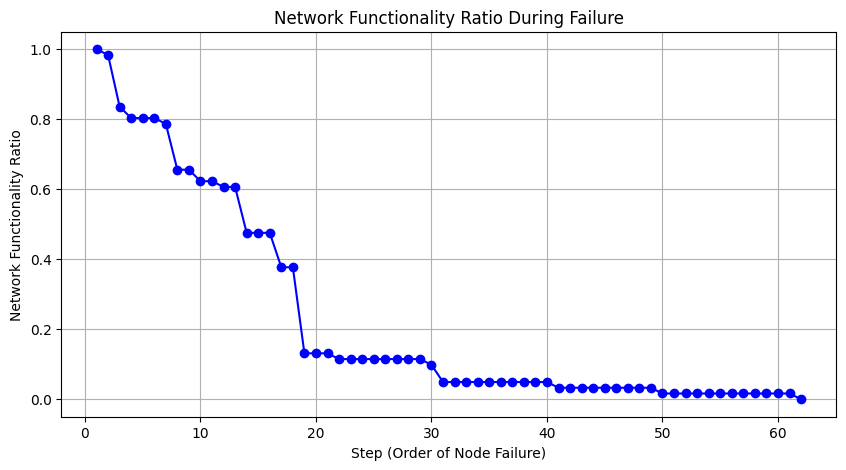

Nodes removed in order: [4, 7, 17, 15, 16, 60, 27, 13, 58, 23, 57, 11, 49, 8, 54, 33, 56, 35, 52, 5, 18, 42, 38, 46, 30, 51, 9, 39, 3, 0, 19, 59, 44, 26, 6, 50, 34, 48, 2, 21, 22, 41, 43, 14, 31, 36, 25, 1, 29, 10, 24, 53, 40, 37, 32, 12, 55, 28, 45, 47, 20]


In [129]:
def simulate_failure_flood(G, sigma):
    H = copy.deepcopy(G)
    
    num_nodes_to_remove = int(sigma * len(G.nodes))
    failure_performance = []
    seq_removed_flood = []
    initial_performance = calculate_network_performance(G)
    print("Initial performance is: ", initial_performance)
    
    remaining_nodes = set(H.nodes)
    
    failure_performance.append(1)
    i = 0
    
    # Loop until all nodes are removed
    while len(remaining_nodes) > 0 and i < len(sorted_node_indices):
        print("Number of remaining nodes are", len(remaining_nodes))
        
        # Select nodes based on their proximity to the river (in the sorted order)
        node_to_remove = sorted_node_indices[i]
        
        # If the node is still in the graph, remove it
        if node_to_remove in remaining_nodes:
            H.remove_node(node_to_remove)
            seq_removed_flood.append(node_to_remove)
            functionality_ratio = calculate_network_performance(H) / initial_performance
            failure_performance.append(functionality_ratio)
            print(f'Functionality after removing node {i+1}: {functionality_ratio}')
            remaining_nodes.remove(node_to_remove)  # Remove node from remaining nodes
        i += 1  # Increment index regardless of whether the node was removed
    
    # If any nodes are still left unremoved, continue removing them
    if len(remaining_nodes) > 0:
        for node in list(remaining_nodes):
            H.remove_node(node)
            seq_removed_flood.append(node)
            functionality_ratio = calculate_network_performance(H) / initial_performance
            failure_performance.append(functionality_ratio)
            print(f'Functionality after removing remaining node {node}: {functionality_ratio}')
            remaining_nodes.remove(node)  # Remove the node
    
    return failure_performance, seq_removed_flood


# Example usage
sigma = 1

failure_performance_flood, seq_removed_flood = simulate_failure_flood(agg_G, sigma)

# Plot the functionality ratio after each node removal
plot_functionality_ratio(failure_performance_flood)

# Print the sequence of nodes removed
print(f'Nodes removed in order: {seq_removed_flood}')


In [131]:
#Visualtion of the network

In [132]:
import pickle

# Path to your pickle file
pickle_path = "C:/Users/orije/recoverability/spaces/L/L-Berlin.pkl"

# Load the content from the pickle file
with open(pickle_path, 'rb') as file:
    data = pickle.load(file)

import folium

# Calculate the average latitude and longitude to center the map
average_lat = sum(node_data['lat'] for _, node_data in data.nodes(data=True)) / data.number_of_nodes()
average_lon = sum(node_data['lon'] for _, node_data in data.nodes(data=True)) / data.number_of_nodes()

# Create a map centered at the average location
m = folium.Map(location=[average_lat, average_lon], zoom_start=14)

# Add a marker for each node, including more attributes in the popup
for node, attr in data.nodes(data=True):
    # Format additional node attributes for the popup
    additional_info = f"Name: {attr.get('name', 'Unnamed')}<br>"
    additional_info += f"Lat: {attr['lat']}<br>Lon: {attr['lon']}<br>"
    if 'original_ids' in attr:
        additional_info += f"Original IDs: {attr['original_ids']}<br>"
    
    folium.Marker(
        [attr['lat'], attr['lon']],
        popup=folium.Popup(additional_info, max_width=200)  # Using folium.Popup to accommodate potentially long text
    ).add_to(m)

# Draw lines for edges (optional, as before)
for edge in data.edges():
    source_node, target_node = edge
    if source_node in data.nodes() and target_node in data.nodes():
        latlon_source = [data.nodes[source_node]['lat'], data.nodes[source_node]['lon']]
        latlon_target = [data.nodes[target_node]['lat'], data.nodes[target_node]['lon']]
        
        folium.PolyLine(locations=[latlon_source, latlon_target], color="blue", weight=2.5, opacity=1).add_to(m)

# Display the map
m


In [134]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, LineString
import folium
import networkx as nx
from pyproj import CRS

# Extract node features into a DataFrame
node_data = []
for node, data in G.nodes(data=True):
    node_data.append({'lat': data['lat'], 'lon': data['lon'], 'name': data['name'], 'original_ids': data['original_ids']})

node_data = pd.DataFrame(node_data)

# Convert node data to GeoDataFrame using Lat and Lon columns
node_data['geometry'] = node_data.apply(lambda row: Point(row['lon'], row['lat']), axis=1)
nodes_gdf = gpd.GeoDataFrame(node_data, geometry='geometry')

# Load the river geometry from the provided shapefile
shapefile_path = "Berlin/e013n52e.shp"
river_gdf = gpd.read_file(shapefile_path)

# Ensure the river GeoDataFrame has a CRS set
if river_gdf.crs is None:
    river_gdf = river_gdf.set_crs('EPSG:4326')  # You can adjust the EPSG code if necessary

# Ensure both GeoDataFrames use the same CRS
nodes_gdf = nodes_gdf.set_crs('EPSG:4326')
river_gdf = river_gdf.to_crs(nodes_gdf.crs)

# Project to a CRS that uses meters for distance calculation
crs_meters = CRS("EPSG:3857")
nodes_gdf_meters = nodes_gdf.to_crs(crs_meters)
river_gdf_meters = river_gdf.to_crs(crs_meters)

# Try to combine all river geometries into a single object if there are multiple features
try:
    river_geometry_meters = river_gdf_meters.unary_union
except Exception as e:
    print(f"Error encountered during unary_union: {e}")
    print("Attempting to clean and simplify geometries...")

    # Clean the geometries by applying a small buffer
    river_gdf_meters['geometry'] = river_gdf_meters['geometry'].buffer(0)

    # Simplify the geometries to reduce complexity
    river_gdf_meters['geometry'] = river_gdf_meters['geometry'].simplify(tolerance=0.01, preserve_topology=True)

    # Try the unary_union operation again
    try:
        river_geometry_meters = river_gdf_meters.unary_union
    except Exception as e:
        print(f"Failed to combine geometries after cleaning and simplifying: {e}")
        raise  # Re-raise the exception to stop execution if it still fails

# Function to calculate the distance from a point to the river in meters
def calculate_distance_meters(point):
    return point.distance(river_geometry_meters)

# Apply the distance calculation to each node in meters
nodes_gdf_meters['distance_to_river_meters'] = nodes_gdf_meters['geometry'].apply(calculate_distance_meters)

# Convert distance from meters to miles (1 meter = 0.000621371 miles)
nodes_gdf['distance_to_river_miles'] = nodes_gdf_meters['distance_to_river_meters'] * 0.000621371

# Sort nodes based on the calculated distance and keep the original indices
nodes_gdf = nodes_gdf.sort_values(by='distance_to_river_miles')
nodes_gdf['rank'] = range(1, len(nodes_gdf) + 1)

# Print the distances of each node from the nearest river point in miles and their sequence
print("Node distances to the nearest river point (in miles):")
for index, row in nodes_gdf.iterrows():
    print(f"{row['name']}, {row['distance_to_river_miles']:.2f} miles")

# Get the sorted index array
sorted_node_indices = nodes_gdf.index.tolist()
print("\nSorted node indices based on distance to the river:")
print(sorted_node_indices)

# Create a folium map centered around the average location of the nodes
center = [nodes_gdf.geometry.y.mean(), nodes_gdf.geometry.x.mean()]
m = folium.Map(location=center, zoom_start=12)

# Add the river geometry to the map
folium.GeoJson(river_gdf, name="River").add_to(m)

# Add the nodes to the map with their rank, distance, and name
for idx, row in nodes_gdf.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=7,  # Increase the size of the node
        color='red',
        fill=True,
        fill_color='red',
        popup=f'Node: {row["name"]}, Rank: {row["rank"]}, Distance: {row["distance_to_river_miles"]:.2f} miles',
        tooltip=row['name']
    ).add_to(m)

    # Add the node name and distance as a DivIcon
    folium.Marker(
        location=[row.geometry.y, row.geometry.x],
        icon=folium.DivIcon(html=f"""
            <div class="custom-div-icon" style="font-family: sans-serif; color: black; font-size: 6pt; font-weight: bold">
                {row["name"]} ({row["distance_to_river_miles"]:.2f} miles)
            </div>""")
    ).add_to(m)

# Add the edges to the map
for u, v, data in G.edges(data=True):
    source_node = nodes_gdf.loc[nodes_gdf['name'] == G.nodes[u]['name']]
    target_node = nodes_gdf.loc[nodes_gdf['name'] == G.nodes[v]['name']]

    folium.PolyLine(
        locations=[(source_node.geometry.y.values[0], source_node.geometry.x.values[0]),
                   (target_node.geometry.y.values[0], target_node.geometry.x.values[0])],
        color='blue',
        weight=2,
        opacity=0.6
    ).add_to(m)

# JavaScript code to adjust text size based on zoom level
js = """
    function resizeText() {
        var zoom = map.getZoom();
        var elements = document.getElementsByClassName('custom-div-icon');
        for (var i = 0; i < elements.length; i++) {
            elements[i].style.fontSize = (zoom * 2) + 'px';
        }
    }
    map.on('zoomend', resizeText);
    resizeText();
"""

# Add JavaScript to the map
m.get_root().html.add_child(folium.Element(f"<script>{js}</script>"))

# Save the map to an HTML file
# map_output_path = 'water_maps_with_networks/Berlin_flood_network.html'
m.save(map_output_path)

print(f"Map has been saved to {map_output_path}. Open it in a web browser to view.")


C:\Users\orije\AppData\Local\Temp\ipykernel_37124\606646678.py:38: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  river_geometry_meters = river_gdf_meters.unary_union


Node distances to the nearest river point (in miles):
Los Dominicos, 8848.88 miles
Hernando de Magallanes, 8849.38 miles
Manquehue, 8850.03 miles
Escuela Militar, 8850.97 miles
Alcántara, 8851.35 miles
El Golf, 8851.71 miles
Vespucio Norte, 8851.76 miles
Tobalaba (L1-L4), 8852.06 miles
Cristóbal Colón, 8852.10 miles
Príncipe de Gales, 8852.11 miles
Francisco Bilbao, 8852.15 miles
Zapadores, 8852.22 miles
Fernando Castillo Velasco, 8852.23 miles
Simón Bolivar, 8852.48 miles
Dorsal, 8852.60 miles
Los Leones, 8852.64 miles
Los Libertadores, 8852.88 miles
Plaza Egaña (L4-L3), 8852.88 miles
Cardenal Caro, 8853.10 miles
Pedro de Valdivia, 8853.11 miles
Einstein, 8853.18 miles
Villa Frei, 8853.43 miles
Manuel Montt, 8853.51 miles
Vivaceta, 8853.56 miles
Los Orientales, 8853.60 miles
Ines de Suárez, 8853.63 miles
Cementerios, 8853.72 miles
Conchalí, 8853.88 miles
Plaza Chacabuco, 8854.04 miles
Grecia, 8854.11 miles
Salvador, 8854.14 miles
Chile-España, 8854.20 miles
Cerro Blanco, 8854.31 miles

NameError: name 'map_output_path' is not defined

In [ ]:
# import numpy as np

# import numpy as np

# def plot_area_failure(failure_performance, type):
#     # Scale the ratios between 0 and 1
#     max_ratio = max(failure_performance)
#     scaled_ratios = [ratio / max_ratio for ratio in failure_performance]

#     steps = list(range(1, len(scaled_ratios) + 1))
    
#     # Calculate the area using the trapezoidal rule
#     area = np.trapz(scaled_ratios, steps)
    
#     # Normalize the area between 0 and 1
#     normalized_area = 1- (area / len(scaled_ratios))
    
#     print(f'Normalized area under the {type} Failure curve: {normalized_area:.3f}')  # Print with two decimal places
    
# # Usage example:
# # failure_performance = ... (however you obtain this list)
# plot_area_failure(failure_performance_degree, "Degree")
# plot_area_failure(failure_performance_betweenness, "Betweenness")
# plot_area_failure(failure_performance_greedy, "Greedy")
# plot_area_failure(failure_performance_random, "Random")
# plot_area_failure(failure_performance_eigen, "Eigen")
# plot_area_failure(failure_performance_closeness, "Closeness")
# # plot_area_failure(failure_performance_domirank, "Domi Rank")
# # plot_area_failure(failure_performance_dynamic_domirank, "Dynamic Domi Rank")
# plot_area_failure(failure_performance_dynamic_degree, "Dynamic Degree")
# plot_area_failure(failure_performance_dynamic_betweenness, "Dynamic Betweeness")
# plot_area_failure(failure_performance_dynamic_eigen, "Dynamic Eigen")
# plot_area_failure(failure_performance_dynamic_closeness, "Dynamic Closeness Rank")


# print("-------------------------------------")

# print("Time taken in Degree Failure", time_taken_degree)
# print("Time taken in Betweenness Failure", time_taken_betweenness)
# print("Time taken in Greedy Failure", time_taken_greedy)
# print("Time taken in Random Failure", time_taken_random)
# print("Time taken in Eigen Failure", time_taken_eigen)
# print("Time taken in Closeness Failure", time_taken_closeness)
# print("Time taken in Domirank Failure", time_taken_domirank)
# print("Time taken in Dynamic Domirank Failure", time_taken_dynamic_domirank)
# print("Time taken in Dynamic Degree Failure", time_taken_dynamic_degree)
# print("Time taken in Dynamic Betweenness Failure", time_taken_dynamic_betweenness)
# print("Time taken in Dynamic Eigen Failure", time_taken_dynamic_eigen)
# print("Time taken in Dynamic Closeness Failure", time_taken_dynamic_closeness)

In [ ]:
# print("Sequence of Nodes removed from the network")
# print("Degree: ", seq_removed_degree)
# print("Betweenness: ", seq_removed_betweenness)
# print("Greedy: ", seq_removed_greedy)
# print("Random: ", seq_removed_random)
# print("Eigenvector: ", seq_removed_eigen)
# print("Closeness: ", seq_removed_closeness)
# print("DomiRank: ", seq_removed_domirank)
# print("Dynamic DomiRank: ", seq_removed_dynamic_domirank)
# print("Dynamic Degree: ", seq_removed_dynamic_degree)
# print("Dynamic Betweenness: ", seq_removed_dynamic_betweenness)
# print("Dynamic Eigen: ", seq_removed_dynamic_eigen)
# print("Dynamic Closeness: ", seq_removed_dynamic_closeness)

In [ ]:
# import matplotlib.pyplot as plt


# Plot the performance ratios
# plt.figure(figsize=(10, 6))
# plt.plot(failure_performance_greedy, label='Greedy Failure', marker='o')
# plt.plot(failure_performance_betweenness, label='Betweenness Failure', marker='o')
# plt.plot(failure_performance_eigen, label='Eigen Failure', marker='o')
# plt.plot(failure_performance_random, label='Random Failure', marker='o')
# plt.plot(failure_performance_degree, label='Degree Failure', marker='o')
# plt.plot(failure_performance_closeness, label='Closeness Failure', marker='o')
# plt.plot(failure_performance_domirank, label='Domirank Failure', marker='o')
# plt.plot(failure_performance_dynamic_domirank, label='Dynamic Domirank Failure', marker='o')
# plt.plot(failure_performance_dynamic_eigen, label='Dynamic Eigen Failure', marker='o')
# plt.plot(failure_performance_dynamic_degree, label='Dynamic Degree Failure', marker='o')
# plt.plot(failure_performance_dynamic_closeness, label='Dynamic Closeness Failure', marker='o')
# plt.plot(failure_performance_dynamic_betweenness, label='Dynamic Betweenness Failure', marker='o')

# Set labels and title
# plt.xlabel('Step (Order of Node Failure)')
# plt.ylabel('Network Functionality Ratio')
# plt.title('Performance of Different Failure Methods')
# plt.legend()

# # Show plot
# plt.grid(True)
# plt.show()


In [ ]:
def simulate_random_failure_multiple_runs(G, sigma, iterations=100):
    all_auc = []
    all_performance = []  # Store performance data for each iteration
    
    for i in range(iterations):
        print(f"Running iteration {i + 1} for random failure")
        H = copy.deepcopy(G)
        nodes_to_remove = np.random.choice(H.nodes, int(sigma * len(G.nodes)), replace=False)
        failure_performance = [1]  # Initial performance is 100%
        initial_performance = calculate_network_performance(G)
        
        for node in nodes_to_remove:
            H.remove_node(node)
            functionality_ratio = calculate_network_performance(H) / initial_performance
            failure_performance.append(functionality_ratio)
        
        auc = plot_area_failure(failure_performance, 'Random')
        all_auc.append(auc)
        all_performance.append(failure_performance)

    # Return the mean AUC over all iterations and the mean performance across all iterations
    mean_auc = np.mean(all_auc)
    mean_performance = np.mean(all_performance, axis=0)  # Average performance across all iterations
    return mean_auc, mean_performance


In [ ]:
import numpy as np
import pandas as pd
import networkx as nx
from scipy.stats import kendalltau
from networkx.algorithms import clustering, average_shortest_path_length
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, LineString
import folium
import networkx as nx
from pyproj import CRS

# Function to extract network attributes from agg_G
def extract_network_attributes(G):
    num_nodes = G.number_of_nodes()
    avg_degree = np.mean([d for n, d in G.degree()])
    avg_spl = average_shortest_path_length(G) if nx.is_connected(G) else float('inf')
    density = nx.density(G)
    diameter = nx.diameter(G) if nx.is_connected(G) else float('inf')
    modularity_index = nx.algorithms.community.modularity(G, nx.algorithms.community.label_propagation_communities(G))
    clustering_coeff = nx.average_clustering(G)

    # Calculate the number of loops (cycles of length > 2)
    num_loops = sum(1 for cycle in nx.cycle_basis(G))
    
    # Calculate the normalized number of loops (loops per node)
    normalized_number_loops = num_loops / num_nodes if num_nodes > 0 else 0

    return {
        "Nodes": num_nodes,
        "Avg_Degree": avg_degree,
        "Avg_SPL": avg_spl,
        "Density": density,
        "Diameter": diameter,
        "Modularity_Index": modularity_index,
        "Clustering_Coefficient": clustering_coeff,
        "Number_of_Loops": num_loops,
        "Normalized_Number_of_Loops": normalized_number_loops
    }

# Function to plot and calculate AUC
def plot_area_failure(failure_performance, method):
    max_ratio = max(failure_performance)
    scaled_ratios = [ratio / max_ratio for ratio in failure_performance]
    steps = list(range(1, len(scaled_ratios) + 1))
    area = np.trapz(scaled_ratios, steps)
    normalized_area = (area / len(scaled_ratios))
    return normalized_area


# Function to run simulation for each city and calculate AUC for all failures
def run_simulation(city_name, shapefile_path, G):
    print(f"Running simulation for {city_name}...")

    # Extract network attributes for the graph
    network_attributes = extract_network_attributes(G)

    # Extract node features into a DataFrame
    node_data = []
    for node, data in G.nodes(data=True):
        node_data.append({'lat': data['lat'], 'lon': data['lon'], 'name': data['name'], 'original_ids': data['original_ids']})

    node_data = pd.DataFrame(node_data)

    # Convert node data to GeoDataFrame using Lat and Lon columns
    node_data['geometry'] = node_data.apply(lambda row: Point(row['lon'], row['lat']), axis=1)
    nodes_gdf = gpd.GeoDataFrame(node_data, geometry='geometry')

    # Load the river geometry from the provided shapefile
    river_gdf = gpd.read_file(shapefile_path)

    # Ensure the river GeoDataFrame has a CRS set
    if river_gdf.crs is None:
        river_gdf = river_gdf.set_crs('EPSG:4326')  # You can adjust the EPSG code if necessary

    # Ensure both GeoDataFrames use the same CRS
    nodes_gdf = nodes_gdf.set_crs('EPSG:4326')
    river_gdf = river_gdf.to_crs(nodes_gdf.crs)

    # Project to a CRS that uses meters for distance calculation
    crs_meters = CRS("EPSG:3857")
    nodes_gdf_meters = nodes_gdf.to_crs(crs_meters)
    river_gdf_meters = river_gdf.to_crs(crs_meters)

    # Combine all river geometries into a single object
    try:
        river_geometry_meters = river_gdf_meters.unary_union
    except Exception as e:
        print(f"Error encountered during unary_union: {e}")
        print("Attempting to clean and simplify geometries...")
        river_gdf_meters['geometry'] = river_gdf_meters['geometry'].buffer(0)
        river_gdf_meters['geometry'] = river_gdf_meters['geometry'].simplify(tolerance=0.01, preserve_topology=True)
        river_geometry_meters = river_gdf_meters.unary_union

    # Calculate distance of each node from the river in meters
    def calculate_distance_meters(point):
        return point.distance(river_geometry_meters)

    nodes_gdf_meters['distance_to_river_meters'] = nodes_gdf_meters['geometry'].apply(calculate_distance_meters)
    nodes_gdf['distance_to_river_miles'] = nodes_gdf_meters['distance_to_river_meters'] * 0.000621371
    nodes_gdf = nodes_gdf.sort_values(by='distance_to_river_miles')
    nodes_gdf['rank'] = range(1, len(nodes_gdf) + 1)

    # Display distances
    print(f"Node distances to the nearest river in {city_name}:")
    for index, row in nodes_gdf.iterrows():
        print(f"{row['name']}, {row['distance_to_river_miles']:.2f} miles")

    sorted_node_indices = nodes_gdf.index.tolist()

    def simulate_failure_flood(G, sigma):
        H = copy.deepcopy(G)
        
        num_nodes_to_remove = int(sigma * len(G.nodes))
        failure_performance = []
        seq_removed_flood = []
        initial_performance = calculate_network_performance(G)
        print("Initial performance is: ", initial_performance)
        
        remaining_nodes = set(H.nodes)
        
        failure_performance.append(1)
        i = 0
        while len(remaining_nodes) > len(G.nodes) - num_nodes_to_remove and i < len(sorted_node_indices):
            print("Number of remaining nodes are", len(remaining_nodes))
            # Select nodes based on their proximity to the Charles River
            node_to_remove = sorted_node_indices[i]
            # Remove the node from H
            if node_to_remove in H.nodes:
                H.remove_node(node_to_remove)
                seq_removed_flood.append(node_to_remove)
                functionality_ratio = calculate_network_performance(H) / initial_performance
                failure_performance.append(functionality_ratio)
                print(f'Functionality after removing node {i+1}: {functionality_ratio}')
                remaining_nodes.remove(node_to_remove)
                i += 1
            else:
                i += 1
        
        return failure_performance, seq_removed_flood
    

    # Failure methods and area calculation
    failure_methods = [
        ("Random", simulate_random_failure_multiple_runs),
        ("Closeness", simulate_failure_closeness),
        ("Betweenness", simulate_failure_betweenness),
        ("Eigen", simulate_failure_eigen),
        ("Degree", simulate_failure_degree),
        ("Flood", simulate_failure_flood),
        ("Domirank", simulate_failure_domirank)
    ]
    
    failure_auc = {}
    performance_data = {}
    for method_name, failure_func in failure_methods:
        print(f"Running {method_name} failure simulation for {city_name}...")
        if method_name == "Random":
            auc, mean_performance = failure_func(G, 1, iterations=10)  # 10 iterations for random failure
            failure_auc[method_name] = auc
            performance_data[method_name] = mean_performance
        else:
            failure_performance, _ = failure_func(G, 1)  # Simulate failure
            failure_auc[method_name] = plot_area_failure(failure_performance, method_name)
            performance_data[method_name] = failure_performance

    return {**network_attributes, 'Failure_AUC': failure_auc}

# Main loop to iterate through cities and run simulations
city_shapefiles = {
    "Budapest": "Budapest/e019n47e/e019n47e.shp",
    "Cairo": "Cairo/Merged_Cairo.shp",
    "Copenhagen": "Copenhagen/e012n55e.shp",
    "Montreal": "Montreal/w074n45n.shp",
    "SanFrancisco": "San Francisco/san_francisco_shapefile_2.shp",
    "Vienna": "Vienna/vienna_shapefile.shp",
    "Philadelphia": "Philadelphia/w076n39n.shp",
    "Kobe": "Kobe/e135n34e.shp",
    "Naples": "Naples/e014n40e.shp",
    "Marseille": "Marseille/e005n43e.shp",
    "Toulouse": "Toulouse/e001n43e.shp",
    "Lyon": "Lyon/e004n45e.shp",
    "Amsterdam": "Amsterdam/e004n52e.shp",
    "Bilbao": "Bilbao/merged_bilbao.shp",
    "Lisbon": "Lisbon/w010n38e.shp",
    "Dubai": "Dubai/dubai_merged.shp",
    "Vancouver": "Vancouver/vancouver_merged.shp",
    "Rotterdam": "Rotterdam/rotterdam_merged.shp",
    "Rome": "Rome/e012n41e.shp",
    "Toronto": "Toronto/w080n43n.shp",
    "BuenosAires": "BuenosAires/w059s35s.shp",
    "Valencia": "Valencia/w001n39e.shp",
    "Stockholm": "Stockholm/stockholm_merged.shp",
    "Oslo": "Oslo/e010n59e.shp",
    "Warsaw": "Warsaw/warsaw_shapefile.shp"
}

results = {}

for city, shapefile in city_shapefiles.items():
    # Load the graph from the pickle file
    with open(rf"C:\Users\orije\recoverability\spaces\L\L-{city}.pkl", 'rb') as file:
        bos_G = pickle.load(file)
    
    # Manually create an undirected graph
    agg_G = nx.Graph()
    agg_G.add_nodes_from(bos_G.nodes(data=True))
    for u, v in bos_G.edges():
        if not agg_G.has_edge(u, v):
            agg_G.add_edge(u, v)
    
    # Run simulation and gather results
    city_result  = run_simulation(city, shapefile, agg_G)
    results[city]=city_result

# # Convert results to DataFrames for further analysis
# network_attr_df = pd.DataFrame([res[1] for res in results], index=[res[0] for res in results])
# auc_df = pd.DataFrame([res[2] for res in results], index=[res[0] for res in results])

# # Calculate Kendall Tau correlation between network attributes and AUC of failures
# tau_correlation_df = pd.DataFrame(columns=auc_df.columns, index=network_attr_df.columns)

# for failure_type in auc_df.columns:
#     for attr in network_attr_df.columns:
#         tau, _ = kendalltau(network_attr_df[attr], auc_df[failure_type])
#         tau_correlation_df.loc[attr, failure_type] = tau

# # Print Kendall Tau Correlation Table
# print("\nKendall Tau Correlation Table:")
# print(tau_correlation_df)


# import matplotlib.pyplot as plt
# colors = ['crimson', 'teal', 'green', 'indigo', 'dodgerblue', 'fuchsia']
# Q = 2  # Assuming Q is your linewidth
# marker_style = ['s', '*', 'o', 'p', 'D', 'x', '|']

# # Print the area values for each city
# for city, network_attributes, aucs, performance_data in results:
#     print(f"\nNormalized area values for {city}:")
#     for method, area in aucs.items():
#         print(f"Normalized area under the {method} Failure curve for {city}: {area:.2f}")
        
#     # Generate the plots for each city
#     plt.figure(figsize=(10, 6))
    
#     # Plot performance for each failure method
#     if 'Betweenness' in performance_data:
#         plt.plot(performance_data['Betweenness'], label='Betweenness Failure', color=colors[0], linestyle='--', 
#                  marker=marker_style[0], markevery=15, markerfacecolor='none', markersize=8, linewidth=Q)
#     if 'Closeness' in performance_data:
#         plt.plot(performance_data['Closeness'], label='Closeness Failure', color=colors[1], linestyle='--', 
#                  marker=marker_style[1], markevery=15, markerfacecolor='none', markersize=8, linewidth=Q)
#     if 'Degree' in performance_data:
#         plt.plot(performance_data['Degree'], label='Degree Failure', color=colors[2], linestyle='--', 
#                  marker=marker_style[2], markevery=15, markerfacecolor='none', markersize=8, linewidth=Q)
#     if 'Eigen' in performance_data:
#         plt.plot(performance_data['Eigen'], label='Eigen Failure', color=colors[3], linestyle='--', 
#                  marker=marker_style[3], markevery=15, markerfacecolor='none', markersize=8, linewidth=Q)
#     if 'Random' in performance_data:
#         plt.plot(performance_data['Random'], label='Random Failure', color=colors[4], linestyle='--', 
#                  marker=marker_style[4], markevery=15, markerfacecolor='none', markersize=8, linewidth=Q)
#     if 'Domirank' in performance_data:
#         plt.plot(performance_data['Domirank'], label='Domirank Failure', color=colors[-1], linestyle='--', 
#                  marker=marker_style[6], markevery=15, markerfacecolor='none', markersize=8, linewidth=Q)
#     if 'Flood' in performance_data:
#         plt.plot(performance_data['Flood'], label='Flood Failure', color=colors[5], linestyle='--', 
#                  marker=marker_style[5], markevery=15, markerfacecolor='none', markersize=8, linewidth=Q)

#     # Set labels and title
#     plt.xlabel('Step (Order of Node Failure)')
#     plt.ylabel('Network Functionality Ratio')
#     plt.title(f'Performance of Different Failure Methods for {city}')
#     plt.legend()

#     # Show the plot with grid
#     plt.grid(True)
#     # plt.savefig(f'failure_graphs/{city}.png', bbox_inches='tight')
#     plt.show()


In [ ]:
df1=pd.read_csv(r"Washington_DC\Edge_CSV.csv")
df2=pd.read_csv(r"Boston_MBTA\Edge_CSV.csv")
df3=pd.read_csv(r"Chicago_L\Edge_CSV.csv")
df4=pd.read_csv(r"Delhi_Metro\Edge_CSV.csv")
df5=pd.read_csv(r"Tokyo_Metro\Edge_CSV.csv")
df6=pd.read_csv(r"Paris_Metro\Edge_CSV.csv")
df7=pd.read_csv(r"Shanghai_Metro\Edge_CSV.csv")
df8=pd.read_csv(r"London_Metro\Edges_all.csv",encoding='latin-1')
df9=pd.read_csv(r"New_York_MTA\Edge_CSV.csv",encoding='latin-1')

edge_list_W = list(zip(df1['Source'], df1['Target']))
edge_list_B = list(zip(df2['Source'], df2['Target']))
edge_list_C = list(zip(df3['Source'], df3['Target']))
edge_list_D = list(zip(df4['Source'], df4['Target']))
edge_list_T = list(zip(df5['Source'], df5['Target']))
edge_list_P = list(zip(df6['Source'], df6['Target']))
edge_list_S = list(zip(df7['Source'], df7['Target']))
edge_list_L = list(zip(df8['Source'], df8['Target']))
edge_list_N = list(zip(df9['Source'], df9['Target']))

G_W = nx.Graph()
G_W.add_edges_from(edge_list_W)

G_B = nx.Graph()
G_B.add_edges_from(edge_list_B)

G_C = nx.Graph()
G_C.add_edges_from(edge_list_C)

G_D = nx.Graph()
G_D.add_edges_from(edge_list_D)

G_T = nx.Graph()
G_T.add_edges_from(edge_list_T)

G_P = nx.Graph()
G_P.add_edges_from(edge_list_P)

G_S = nx.Graph()
G_S.add_edges_from(edge_list_S)

G_L = nx.Graph()
G_L.add_edges_from(edge_list_L)

G_N = nx.Graph()
G_N.add_edges_from(edge_list_N)



In [ ]:
# Calculate the number of loops (cycles of length > 2)
num_loops = sum(1 for cycle in nx.cycle_basis(G_C))
print(num_loops)
# # Calculate the normalized number of loops (loops per node)
normalized_number_loops = num_loops / (G_C.number_of_nodes())
print(normalized_number_loops)


In [ ]:

manual_networks = {
    "Athens": {
        "Nodes": 61,  # Replace with the correct value if known
        "Avg_Degree": 2.0327868852459017,  # Replace with the correct value if known
        "Avg_SPL": 10.917486338797815,  # Replace with the correct value if known
        "Density": 0.033879781420765025,  # Replace with the correct value if known
        "Diameter": 32.00,  # Replace with the correct value if known
        "Modularity_Index": 0.5191207075962538,  # Replace with the correct value if known
        "Clustering_Coefficient": 0.0,  # Replace with the correct value if known
        "Number_of_Loops": 2,
        "Normalized_Number_of_Loops": 0.03278688524590164,
        "Failure_AUC": {
            "Domirank": 0.11,
            "Betweenness": 0.12,
            "Degree": 0.20,
            "Closeness": 0.18,
            "Eigen": 0.19,
            "Random": 0.19,
            "Flood": 0.40
        }
    },
    "Washington DC": {
        "Nodes": 91,
        "Avg_Degree": 2.04,
        "Avg_SPL": 11.51,
        "Density": 0.0227,
        "Diameter": 28.00,
        "Modularity_Index": 0.76,
        "Clustering_Coefficient": 0.0,
        "Number_of_Loops": 3,
        "Normalized_Number_of_Loops": 0.033,
        "Failure_AUC": {
            "Domirank": 0.09,
            "Betweenness": 0.10,
            "Degree": 0.10,
            "Closeness": 0.14,
            "Eigen": 0.14,
            "Random": 0.19,
            "Flood": 0.22
        }
    },
    "Boston": {
        "Nodes": 114,
        "Avg_Degree": 2.02,
        "Avg_SPL": 13.95,
        "Density": 0.0179,
        "Diameter": 34.0,
        "Modularity_Index": 0.81,
        "Clustering_Coefficient": 0.0058,
        "Number_of_Loops": 2,
        "Normalized_Number_of_Loops": 0.0175,
        "Failure_AUC": {
            "Domirank": 0.07,
            "Betweenness": 0.09,
            "Degree": 0.13,
            "Closeness": 0.12,
            "Eigen": 0.22,
            "Random": 0.15,
            "Flood": 0.20
        }
    },
    "Chicago": {
        "Nodes": 143,
        "Avg_Degree": 2.08,
        "Avg_SPL": 15.99,
        "Density": 0.0147,
        "Diameter": 43.00,
        "Modularity_Index": 0.82,
        "Clustering_Coefficient": 0.0212,
        "Number_of_Loops": 7,
        "Normalized_Number_of_Loops": 0.049,
        "Failure_AUC": {
            "Domirank": 0.06,
            "Betweenness": 0.08,
            "Degree": 0.10,
            "Closeness": 0.18,
            "Eigen": 0.21,
            "Random": 0.14,
            "Flood": 0.11
        }
    },
    "Delhi": {
        "Nodes": 205,
        "Avg_Degree": 2.11,
        "Avg_SPL": 17.08,
        "Density": 0.0103,
        "Diameter": 54.00,
        "Modularity_Index": 0.82,
        "Clustering_Coefficient": 0.0,
        "Number_of_Loops": 12,
        "Normalized_Number_of_Loops": 0.0585,
        "Failure_AUC": {
            "Domirank": 0.07,
            "Betweenness": 0.11,
            "Degree": 0.10,
            "Closeness": 0.24,
            "Eigen": 0.29,
            "Random": 0.16,
            "Flood": 0.17
        }
    },
    "Tokyo": {
        "Nodes": 223,
        "Avg_Degree": 2.40,
        "Avg_SPL": 10.64,
        "Density": 0.0108,
        "Diameter": 32.00,
        "Modularity_Index": 0.77,
        "Clustering_Coefficient": 0.0233,
        "Number_of_Loops": 46,
        "Normalized_Number_of_Loops": 0.2063,
        "Failure_AUC": {
            "Domirank": 0.09,
            "Betweenness": 0.12,
            "Degree": 0.11,
            "Closeness": 0.21,
            "Eigen": 0.22,
            "Random": 0.25,
            "Flood": 0.22
        }
    },
    "Paris": {
        "Nodes": 302,
        "Avg_Degree": 2.37,
        "Avg_SPL": 11.98,
        "Density": 0.0079,
        "Diameter": 34.00,
        "Modularity_Index": 0.80,
        "Clustering_Coefficient": 0.0157,
        "Number_of_Loops": 57,
        "Normalized_Number_of_Loops": 0.1887,
        "Failure_AUC": {
            "Domirank": 0.07,
            "Betweenness": 0.09,
            "Degree": 0.08,
            "Closeness": 0.23,
            "Eigen": 0.23,
            "Random": 0.22,
            "Flood": 0.21
        }
    },
    "Shanghai": {
        "Nodes": 345,
        "Avg_Degree": 2.30,
        "Avg_SPL": 16.00,
        "Density": 0.0067,
        "Diameter": 45.00,
        "Modularity_Index": 0.83,
        "Clustering_Coefficient": 0.0086,
        "Number_of_Loops": 53,
        "Normalized_Number_of_Loops": 0.1536,
        "Failure_AUC": {
            "Domirank": 0.08,
            "Betweenness": 0.10,
            "Degree": 0.08,
            "Closeness": 0.18,
            "Eigen": 0.20,
            "Random": 0.18,
            "Flood": 0.20
        }
    },
    "London": {
        "Nodes": 369,
        "Avg_Degree": 2.33,
        "Avg_SPL": 13.73,
        "Density": 0.0063,
        "Diameter": 39.00,
        "Modularity_Index": 0.83,
        "Clustering_Coefficient": 0.0294,
        "Number_of_Loops": 62,
        "Normalized_Number_of_Loops": 0.168,
        "Failure_AUC": {
            "Domirank": 0.06,
            "Betweenness": 0.09,
            "Degree": 0.09,
            "Closeness": 0.23,
            "Eigen": 0.26,
            "Random": 0.20,
            "Flood": 0.20
        }
    },
    "New York": {
        "Nodes": 463,
        "Avg_Degree": 2.20,
        "Avg_SPL": 19.69,
        "Density": 0.0048,
        "Diameter": 57.00,
        "Modularity_Index": 0.88,
        "Clustering_Coefficient": 0.0279,
        "Number_of_Loops": 48,
        "Normalized_Number_of_Loops": 0.1037,
        "Failure_AUC": {
            "Domirank": 0.05,
            "Betweenness": 0.08,
            "Degree": 0.06,
            "Closeness": 0.16,
            "Eigen": 0.18,
            "Random": 0.15,
            "Flood": 0.16
        }
    }
}

# Add the manually created networks to the results
results.update(manual_networks)

# Save the results in pickle file
with open('failure_results.pkl', 'wb') as f:
    pickle.dump(results, f)

# Load to verify the structure
with open('failure_results.pkl', 'rb') as f:
    loaded_results = pickle.load(f)

# Print to verify
# print(loaded_results)

In [ ]:
len(results)

In [ ]:
import pickle
with open('failure_results.pkl', 'rb') as f:
    results = pickle.load(f)

In [ ]:
results

In [ ]:
type(results)

In [ ]:
import pickle
import pandas as pd

# Load the existing failure_results.pkl file
with open('failure_results.pkl', 'rb') as f:
    results = pickle.load(f)

# Extract attributes into a DataFrame
network_data = []
for city, attributes in results.items():
    network_data.append({
        "Name": city,
        "Nodes": attributes["Nodes"],
        "Number_of_Loops": attributes.get("Number_of_Loops", 0),
        "Normalized_Number_of_Loops": attributes.get("Normalized_Number_of_Loops", 0),
        "Domirank_AUC": attributes["Failure_AUC"].get("Domirank", None)
    })

network_df = pd.DataFrame(network_data)

# Display sorted by Number_of_Loops
sorted_by_loops = network_df.sort_values(by="Number_of_Loops", ascending=False)
print("Sorted by Number of Loops:")
print(sorted_by_loops[["Name", "Number_of_Loops", "Normalized_Number_of_Loops", "Domirank_AUC"]])

# Display sorted by Normalized_Number_of_Loops
sorted_by_normalized_loops = network_df.sort_values(by="Normalized_Number_of_Loops", ascending=False)
print("\nSorted by Normalized Number of Loops:")
print(sorted_by_normalized_loops[["Name", "Nodes", "Normalized_Number_of_Loops", "Domirank_AUC"]])


In [ ]:
import pickle
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the existing Failure_results.pkl file
with open('failure_results.pkl', 'rb') as f:
    results = pickle.load(f)

# Extract attributes into a DataFrame
network_data = []
for city, attributes in results.items():
    network_data.append({
        "Name": city,
        "Nodes": attributes["Nodes"],
        "Number_of_Loops": attributes.get("Number_of_Loops", 0),
        "Normalized_Number_of_Loops": attributes.get("Normalized_Number_of_Loops", 0),
        "Domirank_AUC": attributes["Failure_AUC"].get("Domirank", None)
    })

network_df = pd.DataFrame(network_data)

# Sort by Domirank_AUC in ascending order to determine the rank for failure resilience
network_df = network_df.sort_values(by="Domirank_AUC", ascending=True).reset_index(drop=True)

# Add rank to the network names along with the size based on Domirank_AUC
network_df['Ranked_Name'] = network_df.apply(lambda x: f"{x.name + 1}. {x['Name']} (Size: {x['Nodes']})", axis=1)

# Sort by Normalized_Number_of_Loops for the heatmap
sorted_df = network_df.sort_values(by="Normalized_Number_of_Loops", ascending=False)
sorted_df.set_index("Ranked_Name", inplace=True)  # Set ranked names as index

# Create a new DataFrame for heatmaps with columns for both Normalized_Number_of_Loops and Domirank_AUC
heatmap_df = sorted_df[['Normalized_Number_of_Loops', 'Domirank_AUC']]

# Plot the dual heatmap
plt.figure(figsize=(12, 10))

# Heatmap for Normalized_Number_of_Loops
plt.subplot(1, 2, 1)
sns.heatmap(
    heatmap_df[['Normalized_Number_of_Loops']], 
    annot=True, 
    cmap="RdYlGn", 
    cbar=True, 
    linewidths=0.5,
    vmin=heatmap_df['Normalized_Number_of_Loops'].min(), 
    vmax=heatmap_df['Normalized_Number_of_Loops'].max()
)
plt.title("Normalized Number of Loops")
plt.xlabel("Normalized Loops")
plt.ylabel("Networks (Ranked by Domirank AUC and Size)")

# Heatmap for Domirank_AUC
plt.subplot(1, 2, 2)
sns.heatmap(
    heatmap_df[['Domirank_AUC']], 
    annot=True, 
    cmap="RdYlGn_r",  # Use reverse color scheme to show high values as red and low values as green
    cbar=True, 
    linewidths=0.5,
    vmin=heatmap_df['Domirank_AUC'].min(), 
    vmax=heatmap_df['Domirank_AUC'].max()
)
plt.title("Failure AUC")
plt.xlabel("Domirank AUC")

plt.tight_layout()
plt.show()


In [ ]:
import pickle
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Load the results from the pickle file
with open('failure_results.pkl', 'rb') as f:
    results = pickle.load(f)

# Extract network attributes and failure AUC scores from results
network_attr_df = pd.DataFrame({city: res for city, res in results.items()}).T  # Extract all attributes
auc_df = pd.DataFrame({city: res['Failure_AUC'] for city, res in results.items()}).T  # Extract Failure AUC

# Reorder columns as per the required sequence: Random, Flood, Closeness, Eigen, Degree, Betweenness, Domirank
required_order = ['Flood', 'Random','Eigen', 'Closeness', 'Degree', 'Betweenness', 'Domirank']
auc_df = auc_df[required_order]


# Sort the networks based on the number of nodes (ascending order)
sorted_networks = network_attr_df.sort_values(by="Nodes").index
auc_df_sorted = auc_df.loc[sorted_networks]

# Generate the heatmap for failure scores across urban rail networks in ascending network size order
plt.figure(figsize=(10, 14))
sns.heatmap(auc_df_sorted, annot=True, cmap='RdYlGn', cbar=True, fmt=".2f")
plt.title("Failure Scores for Urban Rail Networks Across Different Methods (Sorted by Network Size)")
plt.ylabel("Urban Rail Networks")
plt.xlabel("Failure Methods")
plt.tight_layout()

# Save and show the heatmap
# plt.savefig("failure_heatmap_sorted.png")
plt.show()


In [ ]:
# Define regions for networks
regions = {
    "North America": ["New York", "Toronto", "Boston", "Philadelphia", "Montreal"],
    "Europe": ["London", "Paris", "Rome", "Madrid", "Berlin", "Amsterdam", "Vienna", "Budapest", "Lisbon", "Stockholm", "Warsaw", "Oslo"],
    "Others": ["Tokyo", "Shanghai", "Delhi", "Cairo", "Dubai", "Buenos Aires", "Kobe"]
}

# Function to filter and create heatmap for a region
def create_region_heatmap(region_name, region_networks):
    # Filter networks for the region
    region_aucs = auc_df.loc[auc_df.index.intersection(region_networks)]
    region_attrs = network_attr_df.loc[region_aucs.index]
    
    # Sort by number of nodes
    sorted_region_networks = region_attrs.sort_values(by="Nodes").index
    region_aucs_sorted = region_aucs.loc[sorted_region_networks]
    
    # Generate heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(region_aucs_sorted, annot=True, cmap='RdYlGn', cbar=True, fmt=".2f")
    plt.title(f"Failure Scores for Urban Rail Networks in {region_name} (Sorted by Network Size)")
    plt.ylabel("Urban Rail Networks")
    plt.xlabel("Failure Methods")
    plt.tight_layout()
    
    # Save and show the heatmap
    # plt.savefig(f"{region_name.lower().replace(' ', '_')}_failure_heatmap.png")
    plt.show()

# Generate heatmaps for each region
for region, networks in regions.items():
    create_region_heatmap(region, networks)


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.linear_model import LinearRegression
import pickle
import pandas as pd

# Load the results from the pickle file
with open('failure_results.pkl', 'rb') as f:
    results = pickle.load(f)

# Extract network attributes and failure AUC scores from results
network_attr_df = pd.DataFrame({city: res for city, res in results.items()}).T  # Extract network attributes
auc_df = pd.DataFrame({city: res['Failure_AUC'] for city, res in results.items()}).T  # Extract Failure AUC

# Prepare data for graphing
topological_metrics = ['Avg_Degree', 'Avg_SPL', 'Density', 'Diameter', 'Modularity_Index', 'Clustering_Coefficient', 'Nodes', 'Normalized_Number_of_Loops']
failure_methods = ['Random', 'Betweenness', 'Eigen', 'Degree', 'Flood', 'Domirank']

# Function to create scatter plot with linear fit
def plot_with_trendline(x, y, label, color, ax):
    sns.scatterplot(x=x, y=y, ax=ax, label=label, color=color)
    # Fit a linear regression line
    model = LinearRegression()
    x_array = np.array(x).reshape(-1, 1)
    model.fit(x_array, y)
    trendline = model.predict(x_array)
    ax.plot(x, trendline, color=color)
    return model.score(x_array, y)  # Return R^2 value

# Determine the number of subplots needed
n_metrics = len(topological_metrics)  # Number of metrics
n_cols = 2
n_rows = (n_metrics + n_cols - 1) // n_cols  # Ceiling division to get enough rows

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5))
axes = axes.flatten()

colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown']

# Collect R^2 values
r2_results = {}

for i, metric in enumerate(topological_metrics):
    ax = axes[i]
    r2_results[metric] = {}
    
    for j, method in enumerate(failure_methods):
        x = network_attr_df[metric]  # Topological metric
        y = auc_df[method]  # Failure method performance (AUC)
        r2 = plot_with_trendline(x, y, method, colors[j], ax)  # Plot data and trendline
        r2_results[metric][method] = r2
        
        # Display R^2 value in plot
        ax.text(0.05, 0.95 - j * 0.05, f'{method} R² = {r2:.2f}', transform=ax.transAxes, color=colors[j], fontsize=9)

    ax.set_title(f'Failure Score vs. {metric}')
    ax.set_xlabel(metric)
    ax.set_ylabel('Failure Score (AUC)')
    ax.legend(loc='lower right', fontsize=8)

# Remove any unused subplots
if len(axes) > n_metrics:
    for idx in range(n_metrics, len(axes)):
        fig.delaxes(axes[idx])

plt.tight_layout()
plt.savefig("fit_lines_failure.png", bbox_inches='tight')
plt.show()

# Print the R^2 values
print("R^2 Values for Each Metric and Method:")
for metric, method_r2 in r2_results.items():
    print(f"\nMetric: {metric}")
    for method, r2 in method_r2.items():
        print(f"  {method}: R² = {r2:.2f}")


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import pickle

# Load the results data from the pickle file
with open('failure_results.pkl', 'rb') as file:
    results = pickle.load(file)

# Extract the AUC data (failure scores) from the results
auc_data = pd.DataFrame({city: res['Failure_AUC'] for city, res in results.items()}).T

# Reorder the columns to match the required sequence: 
# 'Flood', 'Random', 'Eigen', 'Closeness', 'Degree', 'Betweenness', 'Domirank'
reordered_auc_data = auc_data[['Flood', 'Random', 'Eigen', 'Closeness', 'Degree', 'Betweenness', 'Domirank']]

# Create a box plot for failure scores across different failure methods
plt.figure(figsize=(10, 6))
sns.boxplot(data=reordered_auc_data, orient='h', palette='Set2')

# Set correct order of labels from top to bottom
plt.gca().set_yticklabels(['Flooding', 'Random', 'Eigenvector', 'Closeness', 'Degree', 'Betweenness', 'Domirank'])

# Add plot title and labels
plt.title('Failure Scores Distribution Across Different Methods')
plt.xlabel('Failure Score')
plt.ylabel('Failure Method')

# Show the plot
plt.tight_layout()
plt.savefig("failure_boxplot.png")
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import os
from PIL import Image

# Path to the directory where the plots are stored
directory = "failure_graphs"

# Get a list of all the image file names in the directory
image_files = [f for f in os.listdir(directory) if f.endswith('.png')]

# Sort the image files to ensure they are displayed in order (optional)
image_files.sort()

# Number of images (assuming 26)
num_images = len(image_files)

# Define the grid size, e.g., 6 rows and 5 columns for 26 images
n_rows = 6
n_cols = 5

# Create a figure to hold the subplots (increase figsize for larger plots)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 36))  # Larger figsize for bigger plots

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each image file and add it to the corresponding subplot
for i, image_file in enumerate(image_files[:n_rows * n_cols]):  # Ensure not to exceed number of subplots
    # Load the image
    img_path = os.path.join(directory, image_file)
    img = Image.open(img_path)
    
    # Extract the network name (without file extension) to use as the title
    network_name = os.path.splitext(image_file)[0]
    
    # Display the image in the corresponding subplot
    axes[i].imshow(img)
    axes[i].axis('off')  # Turn off the axis for cleaner display
    axes[i].set_title(f"{network_name}", fontsize=16)  # Use the network name as the title

# Remove any unused subplots (if there are less than n_rows * n_cols images)
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout for better spacing and reduced padding
plt.tight_layout(pad=1.0)  # Reduce padding between plots by lowering the 'pad' value

# Save the figure as a PNG file
output_path = "combined_failure_plots.png"
plt.savefig(output_path, bbox_inches='tight')  # Save the figure

# Show the plot
plt.show()


In [ ]:
!pip install seaborn

In [ ]:
import pickle
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import kendalltau, spearmanr, pearsonr

# Load failure and recovery results
with open('failure_results.pkl', 'rb') as f:
    failure_results = pickle.load(f)
with open('recovery_results.pkl', 'rb') as f:
    recovery_results = pickle.load(f)

# Prepare DataFrames for network attributes and AUC scores
network_data = {}
for city, data in failure_results.items():
    # Collect all network attributes
    network_data[city] = {**data, **data['Failure_AUC']}
    del network_data[city]['Failure_AUC']  # Remove nested AUC dict

# Integrate recovery AUCs into the same dictionary
for city, data in recovery_results.items():
    if city in network_data:
        # Integrate Recovery AUC
        for key, value in data['Recovery_AUC'].items():
            network_data[city][f'Recovery_{key}'] = value
    else:
        print(f"{city} not found in failure data, skipping recovery data integration.")

# Convert to DataFrame
network_df = pd.DataFrame.from_dict(network_data, orient='index')



# Filter networks with Nodes between 75 and 125
# network_df = network_df[(network_df['Nodes'] >= 75) & (network_df['Nodes'] <= 102)]


print("Number of cities are ", len(network_df))

# Separate network attributes and AUCs
attributes = network_df[['Nodes', 'Avg_Degree', 'Avg_SPL', 'Density', 'Diameter', 
                         'Modularity_Index', 'Clustering_Coefficient', 
                         'Number_of_Loops', 'Normalized_Number_of_Loops']]
# failure_auc = network_df[['Random','Flood', 'Closeness','Eigen', 'Degree','Betweenness', 'Domirank']]
# recovery_auc = network_df[['Recovery_Random', 'Recovery_Closeness','Recovery_Eigen', 'Recovery_Degree','Recovery_Betweenness', 'Recovery_Domirank']]

failure_auc = network_df[['Random','Eigen', 'Degree','Betweenness', 'Domirank']]
recovery_auc = network_df[['Recovery_Random','Recovery_Eigen','Recovery_Degree','Recovery_Betweenness', 'Recovery_Domirank']]

# Calculate Kendall Tau, Spearman, and Pearson correlation matrices
def calculate_correlations(df1, df2, method):
    corr_matrix = pd.DataFrame(index=df1.columns, columns=df2.columns)
    for attr in df1.columns:
        for auc in df2.columns:
            if method == 'kendall':
                corr_matrix.loc[attr, auc] = kendalltau(df1[attr], df2[auc])[0]
            elif method == 'spearman':
                corr_matrix.loc[attr, auc] = spearmanr(df1[attr], df2[auc])[0]
            elif method == 'pearson':
                corr_matrix.loc[attr, auc] = pearsonr(df1[attr], df2[auc])[0]
    return corr_matrix.astype(float)

# Compute correlations for each method
kendall_corr = calculate_correlations(attributes, pd.concat([failure_auc, recovery_auc], axis=1), method='kendall')
spearman_corr = calculate_correlations(attributes, pd.concat([failure_auc, recovery_auc], axis=1), method='spearman')
pearson_corr = calculate_correlations(attributes, pd.concat([failure_auc, recovery_auc], axis=1), method='pearson')

# Visualization function for correlation heatmaps
def plot_correlation_heatmap(corr_matrix, title):
    plt.figure(figsize=(12, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='RdYlGn', center=0, fmt=".2f", linewidths=0.5, cbar=True)
    plt.title(title)
    plt.xlabel('AUC Methods (Failure | Recovery)')
    plt.ylabel('Network Attributes')
    plt.tight_layout()
    plt.show()

# Plot the heatmaps for each correlation method
plot_correlation_heatmap(kendall_corr, 'Kendall Tau Correlation between Network Attributes and AUC Scores')
plot_correlation_heatmap(spearman_corr, 'Spearman Correlation between Network Attributes and AUC Scores')
plot_correlation_heatmap(pearson_corr, 'Pearson Correlation between Network Attributes and AUC Scores')


In [ ]:
# Reload necessary libraries after execution state reset
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Load failure and recovery results
with open('failure_results.pkl', 'rb') as f:
    failure_results = pickle.load(f)
with open('recovery_results.pkl', 'rb') as f:
    recovery_results = pickle.load(f)


# Prepare DataFrames for network attributes and AUC scores
network_data = {}
for city, data in failure_results.items():
    # Collect all network attributes
    network_data[city] = {**data, **data['Failure_AUC']}
    del network_data[city]['Failure_AUC']  # Remove nested AUC dict

# Integrate recovery AUCs into the same dictionary
for city, data in recovery_results.items():
    if city in network_data:
        # Integrate Recovery AUC
        for key, value in data['Recovery_AUC'].items():
            network_data[city][f'Recovery_{key}'] = value

# Convert to DataFrame
network_df = pd.DataFrame.from_dict(network_data, orient='index')


# Separate network attributes and AUCs
attributes = network_df[['Nodes', 'Avg_Degree', 'Avg_SPL', 'Density', 'Diameter', 
                         'Modularity_Index', 'Clustering_Coefficient', 
                         'Number_of_Loops', 'Normalized_Number_of_Loops']]

failure_auc = network_df[['Domirank']]
recovery_auc = network_df[['Recovery_Domirank']]



# Dictionary to store feature importances for failure AUC
failure_feature_importance = {}

# Fit a linear model for each failure AUC method and extract coefficients
for auc_method in failure_auc.columns:
    model = LinearRegression()
    model.fit(attributes.values, failure_auc[auc_method].values)  # Ensure proper array shape
    
    # Get absolute coefficients as feature importance
    importance = np.abs(model.coef_)
    failure_feature_importance[auc_method] = dict(zip(attributes.columns, importance))

# Convert to DataFrame
failure_importance_df = pd.DataFrame(failure_feature_importance)

# Calculate the overall importance by summing across all AUC methods
failure_importance_df['Total_Importance'] = failure_importance_df.sum(axis=1)

# Sort attributes in descending order of total importance for failure AUC
sorted_failure_importance = failure_importance_df['Total_Importance'].sort_values(ascending=False)

# Dictionary to store feature importances for recovery AUC
recovery_feature_importance = {}

# Fit a linear model for each recovery AUC method and extract coefficients
for auc_method in recovery_auc.columns:
    model = LinearRegression()
    model.fit(attributes.values, recovery_auc[auc_method].values)  # Ensure proper array shape
    
    # Get absolute coefficients as feature importance
    importance = np.abs(model.coef_)
    recovery_feature_importance[auc_method] = dict(zip(attributes.columns, importance))

# Convert to DataFrame
recovery_importance_df = pd.DataFrame(recovery_feature_importance)

# Calculate the overall importance by summing across all AUC methods
recovery_importance_df['Total_Importance'] = recovery_importance_df.sum(axis=1)

# Sort attributes in descending order of total importance for recovery AUC
sorted_recovery_importance = recovery_importance_df['Total_Importance'].sort_values(ascending=False)

print(sorted_failure_importance)
print("-----")
print(sorted_recovery_importance)



In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Function to calculate correlations and visualize PCA with fixed axis limits and a consistent plot
def analyze_correlations_with_fixed_axes_and_consistent_plot(
        network_df, attribute, range_min, range_max, title_suffix, fixed_limits, initial_reduced_data, initial_network_names
    ):
    # Filter networks for the current iteration
    filtered_df = network_df[(network_df[attribute] >= range_min) & (network_df[attribute] <= range_max)]
    num_networks = len(filtered_df)
    network_names = filtered_df.index.tolist()  # Get the names of the networks

    # Extract attributes
    attributes = filtered_df[['Avg_Degree', 'Avg_SPL', 'Density', 
                              'Modularity_Index', 'Clustering_Coefficient', 
                               'Normalized_Number_of_Loops']]
    auc_scores = pd.concat([
        filtered_df[['Random', 'Eigen', 'Degree', 'Betweenness', 'Domirank']],
        filtered_df[['Recovery_Random', 'Recovery_Eigen', 'Recovery_Degree', 'Recovery_Betweenness', 'Recovery_Domirank']]
    ], axis=1)

    # Compute Kendall Tau correlations
    kendall_corr = calculate_correlations(attributes, auc_scores, method='kendall')

    # Create a figure with subplots for PCA and heatmap
    fig, axes = plt.subplots(1, 2, figsize=(18, 8), gridspec_kw={'width_ratios': [1, 2]})

    # PCA scatter plot with consistent layout
    # axes[0].scatter(initial_reduced_data[:, 0], initial_reduced_data[:, 1], s=100, alpha=0.2, label="Excluded Networks")
    included_indices = [initial_network_names.index(name) for name in network_names]
    axes[0].scatter(initial_reduced_data[included_indices, 0], initial_reduced_data[included_indices, 1], s=100, color="blue", label="Included Networks")

    # Annotate included networks
    for i in included_indices:
        axes[0].text(initial_reduced_data[i, 0], initial_reduced_data[i, 1], initial_network_names[i], fontsize=8)

    # Apply fixed axis limits
    axes[0].set_xlim(fixed_limits['x'])
    axes[0].set_ylim(fixed_limits['y'])
    axes[0].set_title(f'2D Representation of Networks ({title_suffix})')
    axes[0].set_xlabel('PCA Component 1')
    axes[0].set_ylabel('PCA Component 2')
    axes[0].legend()
    axes[0].grid()

    # Plot heatmap
    sns.heatmap(kendall_corr, annot=True, cmap='RdYlGn', center=0, fmt=".2f", cbar=True, ax=axes[1])
    axes[1].set_title(f'Kendall Tau Correlation ({title_suffix})')
    axes[1].set_xlabel('AUC Methods')
    axes[1].set_ylabel('Attributes')

    plt.tight_layout()
    plt.show()

    return kendall_corr, num_networks, network_names

# Initial PCA setup for consistency
def setup_initial_pca(network_df):
    attributes = network_df[['Nodes', 'Avg_Degree', 'Avg_SPL', 'Density', 'Diameter', 
                             'Modularity_Index', 'Clustering_Coefficient', 
                             'Number_of_Loops', 'Normalized_Number_of_Loops']]
    scaler = StandardScaler()
    standardized_attributes = scaler.fit_transform(attributes)

    pca = PCA(n_components=2)
    reduced_data = pca.fit_transform(standardized_attributes)
    network_names = network_df.index.tolist()

    fixed_limits = {
        'x': (reduced_data[:, 0].min() - 1, reduced_data[:, 0].max() + 1),
        'y': (reduced_data[:, 1].min() - 1, reduced_data[:, 1].max() + 1)
    }

    return reduced_data, network_names, fixed_limits

# Set up initial PCA and axis limits
initial_reduced_data, initial_network_names, fixed_limits = setup_initial_pca(network_df)

# # Percentile ranges for narrowing
percentile_ranges = [
    (0, 100),
    (10, 90),
    (20, 80),
    (25, 75),
    (30, 70),
    (40, 60),
    (45, 55)
]



# percentile_ranges = [
#     (0, 25),
#     (25, 75),
#     (75, 100)
# ]


In [ ]:
# Perform analysis for each percentile range
for i, (lower_percentile, upper_percentile) in enumerate(percentile_ranges):
    range_min = np.percentile(network_df['Nodes'], lower_percentile)
    range_max = np.percentile(network_df['Nodes'], upper_percentile)

    print(f"\nIteration {i+1}: Nodes between {range_min:.2f} and {range_max:.2f}")
    kendall_corr, num_networks, network_names = analyze_correlations_with_fixed_axes_and_consistent_plot(
        network_df, 'Nodes', range_min, range_max, f'(Nodes {lower_percentile}-{upper_percentile} Percentile)', 
        fixed_limits, initial_reduced_data, initial_network_names
    )
    print(f"Networks considered ({num_networks}): {', '.join(network_names)}")

In [ ]:
for i, (lower_percentile, upper_percentile) in enumerate(percentile_ranges):
    range_min = np.percentile(network_df['Normalized_Number_of_Loops'], lower_percentile)
    range_max = np.percentile(network_df['Normalized_Number_of_Loops'], upper_percentile)

    print(f"\nIteration {i+1}: Normalized Number of Loops between {range_min:.4f} and {range_max:.4f}")
    kendall_corr, num_networks, network_names = analyze_correlations_with_fixed_axes_and_consistent_plot(
        network_df, 'Normalized_Number_of_Loops', range_min, range_max, 
        f'(Normalized Loops {lower_percentile}-{upper_percentile} Percentile)', 
        fixed_limits, initial_reduced_data, initial_network_names
    )
    print(f"Networks considered ({num_networks}): {', '.join(network_names)}")


In [ ]:
for i, (lower_percentile, upper_percentile) in enumerate(percentile_ranges):
    range_min = np.percentile(network_df['Avg_SPL'], lower_percentile)
    range_max = np.percentile(network_df['Avg_SPL'], upper_percentile)

    print(f"\nIteration {i+1}: Avg_SPL between {range_min:.2f} and {range_max:.2f}")
    kendall_corr, num_networks, network_names = analyze_correlations_with_fixed_axes_and_consistent_plot(
        network_df, 'Avg_SPL', range_min, range_max, f'(Avg_SPL {lower_percentile}-{upper_percentile} Percentile)', 
        fixed_limits, initial_reduced_data, initial_network_names
    )
    print(f"Networks considered ({num_networks}): {', '.join(network_names)}")


In [ ]:
for i, (lower_percentile, upper_percentile) in enumerate(percentile_ranges):
    range_min = np.percentile(network_df['Density'], lower_percentile)
    range_max = np.percentile(network_df['Density'], upper_percentile)

    print(f"\nIteration {i+1}: Density between {range_min:.4f} and {range_max:.4f}")
    kendall_corr, num_networks, network_names = analyze_correlations_with_fixed_axes_and_consistent_plot(
        network_df, 'Density', range_min, range_max, f'(Density {lower_percentile}-{upper_percentile} Percentile)', 
        fixed_limits, initial_reduced_data, initial_network_names
    )
    print(f"Networks considered ({num_networks}): {', '.join(network_names)}")


In [ ]:
for i, (lower_percentile, upper_percentile) in enumerate(percentile_ranges):
    range_min = np.percentile(network_df['Diameter'], lower_percentile)
    range_max = np.percentile(network_df['Diameter'], upper_percentile)

    print(f"\nIteration {i+1}: Diameter between {range_min:.2f} and {range_max:.2f}")
    kendall_corr, num_networks, network_names = analyze_correlations_with_fixed_axes_and_consistent_plot(
        network_df, 'Diameter', range_min, range_max, f'(Diameter {lower_percentile}-{upper_percentile} Percentile)', 
        fixed_limits, initial_reduced_data, initial_network_names
    )
    print(f"Networks considered ({num_networks}): {', '.join(network_names)}")


In [ ]:
for i, (lower_percentile, upper_percentile) in enumerate(percentile_ranges):
    range_min = np.percentile(network_df['Modularity_Index'], lower_percentile)
    range_max = np.percentile(network_df['Modularity_Index'], upper_percentile)

    print(f"\nIteration {i+1}: Modularity_Index between {range_min:.4f} and {range_max:.4f}")
    kendall_corr, num_networks, network_names = analyze_correlations_with_fixed_axes_and_consistent_plot(
        network_df, 'Modularity_Index', range_min, range_max, 
        f'(Modularity_Index {lower_percentile}-{upper_percentile} Percentile)', 
        fixed_limits, initial_reduced_data, initial_network_names
    )
    print(f"Networks considered ({num_networks}): {', '.join(network_names)}")


In [ ]:
for i, (lower_percentile, upper_percentile) in enumerate(percentile_ranges):
    range_min = np.percentile(network_df['Clustering_Coefficient'], lower_percentile)
    range_max = np.percentile(network_df['Clustering_Coefficient'], upper_percentile)

    print(f"\nIteration {i+1}: Clustering_Coefficient between {range_min:.4f} and {range_max:.4f}")
    kendall_corr, num_networks, network_names = analyze_correlations_with_fixed_axes_and_consistent_plot(
        network_df, 'Clustering_Coefficient', range_min, range_max, 
        f'(Clustering_Coefficient {lower_percentile}-{upper_percentile} Percentile)', 
        fixed_limits, initial_reduced_data, initial_network_names
    )
    print(f"Networks considered ({num_networks}): {', '.join(network_names)}")


## World Map

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import geodatasets

# Define network locations (updated with all 35 networks)
network_locations = {
    "Athens": (37.9838, 23.7275),
    "Budapest": (47.4979, 19.0402),
    "Cairo": (30.0444, 31.2357),
    "Montreal": (45.5017, -73.5673),
    "New York": (40.7128, -74.0060),
    "Boston": (42.3601, -71.0589),
    "Delhi": (28.6139, 77.2090),
    "Tokyo": (35.6895, 139.6917),
    "Paris": (48.8566, 2.3522),
    "Shanghai": (31.2304, 121.4737),
    "London": (51.5074, -0.1278),
    "Toronto": (43.651070, -79.347015),
    "Rome": (41.9028, 12.4964),
    "Lisbon": (38.7223, -9.1393),
    "Amsterdam": (52.3676, 4.9041),
    "BuenosAires": (-34.6037, -58.3816),
    "Naples": (40.8518, 14.2681),
    "Dubai": (25.276987, 55.296249),
    "Vienna": (48.2082, 16.3738),
    "SanFrancisco": (37.7749, -122.4194),
    "Stockholm": (59.3293, 18.0686),
    "Vancouver": (49.2827, -123.1207),
    "Rotterdam": (51.9225, 4.4792),
    "Marseille": (43.2965, 5.3698),
    "Toulouse": (43.6047, 1.4442),
    "Oslo": (59.9139, 10.7522),
    "Warsaw": (52.2297, 21.0122),
    "Kobe": (34.6901, 135.1955),
    "Philadelphia": (39.9526, -75.1652),
    "Bilbao": (43.2630, -2.9350),
    "Lyon": (45.7640, 4.8357),
    "Valencia": (39.4699, -0.3763),
    "Shanghai": (31.2304, 121.4737),
    "Washington DC": (38.9072, -77.0369),
    "Chicago": (41.8781, -87.6298),
}

# Manually assign continents
continent_mapping = {
    "Athens": "Europe",
    "Budapest": "Europe",
    "Cairo": "Africa",
    "Montreal": "North America",
    "New York": "North America",
    "Boston": "North America",
    "Delhi": "Asia",
    "Tokyo": "Asia",
    "Paris": "Europe",
    "Shanghai": "Asia",
    "London": "Europe",
    "Toronto": "North America",
    "Rome": "Europe",
    "Lisbon": "Europe",
    "Amsterdam": "Europe",
    "BuenosAires": "South America",
    "Naples": "Europe",
    "Dubai": "Asia",
    "Vienna": "Europe",
    "SanFrancisco": "North America",
    "Stockholm": "Europe",
    "Vancouver": "North America",
    "Rotterdam": "Europe",
    "Marseille": "Europe",
    "Toulouse": "Europe",
    "Oslo": "Europe",
    "Warsaw": "Europe",
    "Kobe": "Asia",
    "Philadelphia": "North America",
    "Bilbao": "Europe",
    "Lyon": "Europe",
    "Valencia": "Europe",
    "Washington DC": "North America",
    "Chicago": "North America"
}


# Convert to DataFrame
locations_df = pd.DataFrame(network_locations.items(), columns=["City", "Coordinates"])
locations_df["Latitude"] = locations_df["Coordinates"].apply(lambda x: x[0])
locations_df["Longitude"] = locations_df["Coordinates"].apply(lambda x: x[1])
locations_df["Continent"] = locations_df["City"].map(continent_mapping)

# Convert to GeoDataFrame
gdf = gpd.GeoDataFrame(
    locations_df, 
    geometry=gpd.points_from_xy(locations_df.Longitude, locations_df.Latitude)
)

# Load world map
world = gpd.read_file(geodatasets.get_path("naturalearth.land"))

# Plot the map
fig, ax = plt.subplots(figsize=(15, 10))
world.plot(ax=ax, color='white', edgecolor='black')
gdf.plot(ax=ax, color='red', markersize=17)

# Annotate city names
# for idx, row in gdf.iterrows():
#     plt.annotate(row['City'], (row['Longitude'], row['Latitude']), fontsize=8, ha='right')

# plt.title('World Map Showing Network Locations', fontsize=16)
# plt.xlabel('Longitude')
# plt.ylabel('Latitude')
plt.tight_layout()
# Save as high-quality PNG
plt.savefig('network_locations.svg', format='svg', dpi=600)
plt.show()
# Count networks per continent
continent_counts = locations_df["Continent"].value_counts()
print("\n📌 **Number of Networks per Continent:**")
print(continent_counts)


In [ ]:
import pickle
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import product

# Load the failure and recovery results from pickle files
with open('failure_results.pkl', 'rb') as f:
    failure_results = pickle.load(f)

with open('recovery_results.pkl', 'rb') as f:
    recovery_results = pickle.load(f)

# Select 5 networks (you can modify this selection as needed)
# selected_networks = ['Athens', 'Budapest', 'Cairo', 'Montreal', 'New York','Boston']
selected_networks = list(failure_results.keys())

# Define failure and recovery strategies
failure_strategies = ['Domirank', 'Random', 'Flood', 'Betweenness', 'Eigen', 'Degree','Closeness']
recovery_strategies = ['Domirank', 'Betweenness', 'Degree', 'Closeness', 'Eigen','Random']

# Function to calculate resilience score
def calculate_resilience_score(failure_score, recovery_score):
    return (failure_score + recovery_score)

# Create a dictionary to store the resilience score tables for each network
resilience_scores = {}

# Iterate over the selected networks
for network in selected_networks:
    if network in failure_results and network in recovery_results:
        # Extract failure AUCs and recovery AUCs for the network
        failure_auc = failure_results[network]['Failure_AUC']
        recovery_auc = recovery_results[network]['Recovery_AUC']

        # Prepare a DataFrame to store resilience scores for all combinations
        resilience_table = pd.DataFrame(index=failure_strategies, columns=recovery_strategies)

        # Iterate over all combinations of failure and recovery strategies
        for fail_strategy, recov_strategy in product(failure_strategies, recovery_strategies):
            fail_score = failure_auc.get(fail_strategy, None)
            recov_score = recovery_auc.get(recov_strategy, None)
            
            if fail_score is not None and recov_score is not None:
                # Calculate resilience score
                resilience_score = calculate_resilience_score(fail_score, recov_score)
                resilience_table.loc[fail_strategy, recov_strategy] = resilience_score

        # Store the table for this network
        resilience_scores[network] = resilience_table.astype(float)

        # Plot the color-coded heatmap for this network's resilience score
        plt.figure(figsize=(10, 6))
        sns.heatmap(resilience_scores[network], annot=True, cmap='RdYlGn', cbar=True, vmin=0.5, vmax=1.1, linewidths=0.5)
        plt.title(f"Resilience Score Heatmap for {network}")
        plt.ylabel("Failure Strategies")
        plt.xlabel("Recovery Strategies")
        plt.tight_layout()
        
        # Save each network's heatmap as a PNG file
        # plt.savefig(f"{network}_resilience_heatmap.png", bbox_inches='tight')
        plt.show()


In [ ]:
# Load the graph from the pickle file
with open(rf"C:\Users\orije\recoverability\spaces\L\L-Athens.pkl", 'rb') as file:
    bos_G = pickle.load(file)
import networkx as nx



# Manually create an undirected graph
agg_G = nx.Graph()
agg_G.add_nodes_from(bos_G.nodes(data=True))
# Add edges to the undirected graph
for u, v in bos_G.edges():
    if not agg_G.has_edge(u, v) and not agg_G.has_edge(v, u):
        agg_G.add_edge(u, v)

In [ ]:
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

# Load the results from the pickle file
with open('failure_results.pkl', 'rb') as f:
    results = pickle.load(f)

# Define the list of strategies
strategies = ["Domirank", "Betweenness", "Degree", "Closeness", "Eigen", "Random", "Flood"]

# Prepare attributes and AUCs
network_attributes = []
failure_aucs = []
city_names = []

for city, data in results.items():
    attributes = {
        "Nodes": data["Nodes"],
        # "Avg_Degree": data["Avg_Degree"],
        # "Avg_SPL": data["Avg_SPL"],
        "Density": data["Density"],
        # "Diameter": data["Diameter"],
        "Modularity_Index": data["Modularity_Index"],
        # "Clustering_Coefficient": data["Clustering_Coefficient"],
        # "Normalized_Number_of_Loops": data["Normalized_Number_of_Loops"]
    }
    network_attributes.append(attributes)
    failure_aucs.append(data["Failure_AUC"])
    city_names.append(city)

# Convert to DataFrames
attr_df = pd.DataFrame(network_attributes)
auc_df = pd.DataFrame(failure_aucs)
scaler = MinMaxScaler()
X = pd.DataFrame(scaler.fit_transform(attr_df), columns=attr_df.columns)

# Loop over each strategy
for strategy in strategies:
    if strategy not in auc_df.columns:
        print(f"⚠️ Skipping '{strategy}' — not found in AUC data.")
        continue

    y = auc_df[strategy]

    # Train model
    model = LinearRegression()
    model.fit(X, y)
    y_pred = model.predict(X)
    rmse = np.sqrt(mean_squared_error(y, y_pred))

    # Generate equation
    equation = f"{strategy} AUC = {model.intercept_:.4f} + "
    for i, col in enumerate(X.columns):
        equation += f"({model.coef_[i]:.4f} * {col}) + "
    equation = equation.rstrip(" + ")

    # Output
    print(f"\n🧠 Strategy: {strategy}")
    print(f"📉 RMSE: {rmse:.4f}")
    print(f"🧾 Linear Equation: {equation}")

    # Plot
    plt.figure(figsize=(6, 4))
    plt.scatter(y, y_pred, color="blue", alpha=0.6, label="Predicted vs Actual")
    plt.plot([min(y), max(y)], [min(y), max(y)], color="red", linestyle="--", label="Perfect Fit")
    plt.xlabel(f"Actual Failure AUC ({strategy})")
    plt.ylabel(f"Predicted AUC ({strategy})")
    plt.title(f"Linear Fit for Failure AUC - {strategy}")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Detailed city results
    # print(f"\n📊 Actual vs Predicted AUC for {strategy}:")
    # for city, actual, pred in zip(city_names, y, y_pred):
    #     print(f"{city}: Actual = {actual:.4f}, Predicted = {pred:.4f}")


In [ ]:
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Load data from recovery_results.pkl
with open('recovery_results.pkl', 'rb') as f:
    recovery_results = pickle.load(f)

# Prepare DataFrame for network attributes
network_data = []
for city, attributes in recovery_results.items():
    network_data.append({
        "Name": city,
        "Nodes": attributes["Nodes"],
        "Avg_Degree": attributes.get("Avg_Degree", 0),
        "Avg_SPL": attributes.get("Avg_SPL", 0),
        "Density": attributes.get("Density", 0),
        "Diameter": attributes.get("Diameter", 0),
        "Modularity_Index": attributes.get("Modularity_Index", 0),
        "Clustering_Coefficient": attributes.get("Clustering_Coefficient", 0),
        "Number_of_Loops": attributes.get("Number_of_Loops", 0),
        "Normalized_Number_of_Loops": attributes.get("Normalized_Number_of_Loops", 0)
    })

# Create DataFrame
network_df = pd.DataFrame(network_data)

# Separate attributes and scale them
attributes = network_df.drop(columns=["Name"])
scaler = StandardScaler()
scaled_attributes = scaler.fit_transform(attributes)

# Perform PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_attributes)
network_df['PC1'] = pca_result[:, 0]
network_df['PC2'] = pca_result[:, 1]

# Visualize the PCA with clusters
plt.figure(figsize=(12, 8))

# Apply KMeans clustering to identify groups
kmeans = KMeans(n_clusters=2, random_state=42)
network_df['Cluster'] = kmeans.fit_predict(pca_result)

# Scatter plot with color coding by clusters
sns.scatterplot(x="PC1", y="PC2", hue="Cluster", data=network_df, palette="viridis", s=100)

# Add text labels for network names
for i, row in network_df.iterrows():
    plt.text(row['PC1'] + 0.1, row['PC2'], f"{row['Name']} ({row['Nodes']})", fontsize=9)

plt.title("PCA of Network Attributes with Clustering")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Cluster")
plt.grid()
plt.show()

# Print attribute loadings for PC1 and PC2
loadings = pd.DataFrame(pca.components_.T, columns=['PC1', 'PC2'], index=attributes.columns)
print("\nPCA Loadings (Contribution of each attribute to PC1 and PC2):")
print(loadings)

# Identify highest loading attributes for PC1 and PC2
high_loadings_pc1 = loadings['PC1'].abs().sort_values(ascending=False).head(3)
high_loadings_pc2 = loadings['PC2'].abs().sort_values(ascending=False).head(3)

print("\nAttributes with highest loadings on PC1:")
print(high_loadings_pc1)

print("\nAttributes with highest loadings on PC2:")
print(high_loadings_pc2)


In [ ]:
%pip install xgboost lightgbm

In [ ]:
import pickle
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load the existing Failure_results.pkl and Recovery_results.pkl files
with open('failure_results.pkl', 'rb') as f:
    failure_results = pickle.load(f)
with open('recovery_results.pkl', 'rb') as f:
    recovery_results = pickle.load(f)

# Prepare the data
data = []
for city in failure_results.keys():
    if city in recovery_results:
        attributes = failure_results[city]
        # Extract network attributes, excluding 'Number_of_Loops'
        feature_data = {
            "Nodes": attributes["Nodes"],
            "Avg_Degree": attributes["Avg_Degree"],
            "Avg_SPL": attributes["Avg_SPL"],
            "Density": attributes["Density"],
            "Diameter": attributes["Diameter"],
            "Modularity_Index": attributes["Modularity_Index"],
            "Clustering_Coefficient": attributes["Clustering_Coefficient"],
            "Normalized_Number_of_Loops": attributes.get("Normalized_Number_of_Loops", 0),
            "Failure_AUC": attributes["Failure_AUC"].get("Domirank"),  # Change as needed for different AUC methods
            "Recovery_AUC": recovery_results[city]["Recovery_AUC"].get("Domirank")  # Change as needed for different AUC methods
        }
        data.append(feature_data)

# Convert data to a DataFrame
df = pd.DataFrame(data)

# Separate features and targets for both models
features = df.drop(columns=["Failure_AUC", "Recovery_AUC"])
failure_target = df["Failure_AUC"]
recovery_target = df["Recovery_AUC"]

# Split the data into training and testing sets
X_train_fail, X_test_fail, y_train_fail, y_test_fail = train_test_split(features, failure_target, test_size=0.3, random_state=42)
X_train_rec, X_test_rec, y_train_rec, y_test_rec = train_test_split(features, recovery_target, test_size=0.3, random_state=42)

# Train and evaluate the Failure AUC model
failure_model = LinearRegression()
failure_model.fit(X_train_fail, y_train_fail)
y_pred_fail = failure_model.predict(X_test_fail)

# Metrics for Failure AUC model
mse_fail = mean_squared_error(y_test_fail, y_pred_fail)
r2_fail = r2_score(y_test_fail, y_pred_fail)
print("Failure AUC Model:")
print(f"Mean Squared Error: {mse_fail:.4f}")
print(f"R-squared: {r2_fail:.4f}\n")

# Train and evaluate the Recovery AUC model
recovery_model = LinearRegression()
recovery_model.fit(X_train_rec, y_train_rec)
y_pred_rec = recovery_model.predict(X_test_rec)

# Metrics for Recovery AUC model
mse_rec = mean_squared_error(y_test_rec, y_pred_rec)
r2_rec = r2_score(y_test_rec, y_pred_rec)
print("Recovery AUC Model:")
print(f"Mean Squared Error: {mse_rec:.4f}")
print(f"R-squared: {r2_rec:.4f}")

# Visualization for Failure AUC model
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.scatterplot(x=y_test_fail, y=y_pred_fail)
plt.plot([y_test_fail.min(), y_test_fail.max()], [y_test_fail.min(), y_test_fail.max()], 'r--')
plt.xlabel("Actual Failure AUC")
plt.ylabel("Predicted Failure AUC")
plt.title("Actual vs. Predicted Failure AUC")

# Visualization for Recovery AUC model
plt.subplot(1, 2, 2)
sns.scatterplot(x=y_test_rec, y=y_pred_rec)
plt.plot([y_test_rec.min(), y_test_rec.max()], [y_test_rec.min(), y_test_rec.max()], 'r--')
plt.xlabel("Actual Recovery AUC")
plt.ylabel("Predicted Recovery AUC")
plt.title("Actual vs. Predicted Recovery AUC")

plt.tight_layout()
plt.show()


In [ ]:
import networkx as nx
import numpy as np

# Assume G is your network
# G = nx.erdos_renyi_graph(50, 0.1)  # Example graph (replace with your actual graph)
# Load the graph from the pickle file
with open(rf"C:\Users\orije\recoverability\spaces\L\L-prague.pkl", 'rb') as file:
    bos_G = pickle.load(file)
import networkx as nx



# Manually create an undirected graph
agg_G = nx.Graph()
agg_G.add_nodes_from(bos_G.nodes(data=True))
# Add edges to the undirected graph
for u, v in bos_G.edges():
    if not agg_G.has_edge(u, v) and not agg_G.has_edge(v, u):
        agg_G.add_edge(u, v)

G=agg_G
# G=G_W

def extract_attributes(G):
    attributes = {}
    attributes['Nodes'] = G.number_of_nodes()
    attributes['Avg_Degree'] = np.mean([d for _, d in G.degree()])
    attributes['Avg_SPL'] = nx.average_shortest_path_length(G) if nx.is_connected(G) else np.nan
    attributes['Density'] = nx.density(G)
    attributes['Diameter'] = nx.diameter(G) if nx.is_connected(G) else np.nan
    attributes['Modularity_Index'] = None  # Requires community detection (use networkx or external library)
    attributes['Clustering_Coefficient'] = nx.average_clustering(G)
    attributes['Number_of_Loops'] = sum(1 for _ in nx.selfloop_edges(G))
    attributes['Normalized_Number_of_Loops'] = attributes['Number_of_Loops'] / attributes['Nodes']
    return attributes

# Extract attributes for G
G_attributes = extract_attributes(G)
print("Attributes for Network G:", G_attributes)


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np

# Assuming network_df contains features and AUC scores
features = network_df[['Nodes', 'Avg_Degree', 'Avg_SPL', 'Density', 'Diameter', 
                       'Modularity_Index', 'Clustering_Coefficient', 
                       'Number_of_Loops', 'Normalized_Number_of_Loops']]
target_auc = network_df[['Domirank','Betweenness','Degree']]

# Standardize features
scaler = StandardScaler()
features_standardized = scaler.fit_transform(features)

# Reduce dimensionality using PCA
pca = PCA(n_components=2)  # Adjust components based on variance explained
reduced_features = pca.fit_transform(features_standardized)

# Split data into training and testing
X_train, X_test, y_train, y_test = train_test_split(reduced_features, target_auc, test_size=0.2, random_state=42)

# Train a regression model (Random Forest in this case)
model = RandomForestRegressor(random_state=42)
model.fit(X_train, y_train)

# Evaluate the model
y_pred = model.predict(X_test)
print("Mean Squared Error:", mean_squared_error(y_test, y_pred))



# Convert G_attributes to a NumPy array
G_features = np.array([
    G_attributes['Nodes'],
    G_attributes['Avg_Degree'],
    G_attributes['Avg_SPL'],
    G_attributes['Density'],
    G_attributes['Diameter'],
    G_attributes['Modularity_Index'] if G_attributes['Modularity_Index'] is not None else 0,
    G_attributes['Clustering_Coefficient'],
    G_attributes['Number_of_Loops'],
    G_attributes['Normalized_Number_of_Loops']
]).reshape(1, -1)  # Reshape for compatibility

# Standardize the features using the scaler from training
G_features_standardized = scaler.transform(G_features)

# Transform to reduced-dimensional space using PCA
G_reduced = pca.transform(G_features_standardized)

# Predict AUC for the network G
G_predicted_auc = model.predict(G_reduced)
print("Predicted AUC for Network G:", G_predicted_auc)


In [ ]:
!pip install imageio

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import os
import imageio.v2 as imageio

# Create a directory to save frames
output_folder = "serdp_visuals"
frames_folder = os.path.join(output_folder, "failure_frames_performance")
os.makedirs(frames_folder, exist_ok=True)

# Assuming you have performance data for different failure methods
performance_data = {
    "Betweenness": failure_performance_betweenness,
    "Closeness": failure_performance_closeness,
    "Degree": failure_performance_degree,
    "Eigenvector": failure_performance_eigen,
    "Flood": failure_performance_flood,
    "Domirank": failure_performance_domirank  # Add Domirank
}

# Parameters for plotting
colors = ['crimson', 'teal', 'green', 'indigo', 'dodgerblue', 'fuchsia']  # Add a color for Domirank
marker_style = ['s', '*', 'o', 'p', 'D', 'x']  # Add a marker style for Domirank
Q = 3  # Increased line width

# Create a figure for animation
fig, ax = plt.subplots(figsize=(12, 8))  # Slightly larger figure
ax.set_xlabel('Step (Order of Node Failure)', fontsize=14, fontweight='bold')
ax.set_ylabel('Network Functionality Ratio', fontsize=14, fontweight='bold')
ax.set_title('Performance of Different Failure Methods', fontsize=16, fontweight='bold')

# Create lines for each failure method
lines = {}
for method, color, marker in zip(performance_data.keys(), colors, marker_style):
    line, = ax.plot([], [], label=f'{method} Failure', color=color, linestyle='--',
                    marker=marker, markevery=15, markerfacecolor='none',
                    markersize=10, linewidth=Q)
    lines[method] = line

# Add legend with larger font size
ax.legend(fontsize=12)

# Set axis limits
ax.set_xlim(0, max(len(data) for data in performance_data.values()))
ax.set_ylim(0, 1.05)

# Animation function
def update(frame):
    for method, data in performance_data.items():
        lines[method].set_data(range(frame + 1), data[:frame + 1])

    plt.savefig(os.path.join(frames_folder, f"frame_{frame:03d}.png"))
    return lines.values()



In [ ]:
# Create animation
num_frames = max(len(data) for data in performance_data.values())
ani = animation.FuncAnimation(fig, update, frames=num_frames, blit=True, repeat=False)

# Save the animation as a GIF
gif_path = os.path.join(output_folder, "failure_performance_comparison.gif")
ani.save(gif_path, writer="pillow", fps=15)  # 2 frames per second

# Optional: Combine all frames into a video (requires ffmpeg or similar tools)
# video_path = os.path.join(output_folder, "performance_comparison.mp4")
# with imageio.get_writer(video_path, mode="I") as writer:
#     for frame_num in range(num_frames):
#         frame_path = os.path.join(frames_folder, f"frame_{frame_num:03d}.png")
#         image = imageio.imread(frame_path)
#         writer.append_data(image)

# Cleanup: Uncomment if you want to remove individual frames
# for frame_num in range(num_frames):
#     os.remove(os.path.join(frames_folder, f"frame_{frame_num:03d}.png"))

print(f"GIF saved at {gif_path}")
# print(f"Video saved at {video_path}")

In [ ]:
import itertools
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.linear_model import LinearRegression
import pickle
import pandas as pd

# Load the results from the pickle file
with open('failure_results.pkl', 'rb') as f:
    results = pickle.load(f)

# Extract network attributes and failure AUC scores from results
network_attr_df = pd.DataFrame({city: res for city, res in results.items()}).T  # Extract network attributes
auc_df = pd.DataFrame({city: res['Failure_AUC'] for city, res in results.items()}).T  # Extract Failure AUC

# Prepare data for graphing
# topological_metrics = ['Avg_Degree', 'Avg_SPL', 'Density', 'Diameter', 'Modularity_Index', 'Clustering_Coefficient', 'Nodes', 'Normalized_Number_of_Loops']
failure_methods = ['Random', 'Betweenness', 'Eigen','Closeness', 'Degree', 'Flood', 'Domirank']
# topological_metrics = ['Avg_Degree', 'Avg_SPL', 'Density', 'Modularity_Index', 'Clustering_Coefficient', 'Normalized_Number_of_Loops']

# Generate all pairwise combinations of topological metrics
metric_combinations = list(itertools.combinations(topological_metrics, 2))

# Function to create scatter plot with regression plane
def plot_combination_with_trendline(x, y, auc, ax, method):
    sns.scatterplot(x=x, y=y, size=auc, ax=ax, hue=auc, palette="coolwarm", legend=False, alpha=0.8)

    # Fit a multiple linear regression model
    model = LinearRegression()
    X_comb = np.column_stack((x, y))
    model.fit(X_comb, auc)
    auc_pred = model.predict(X_comb)

    # Overlay regression line on the scatter plot
    # Create a grid for regression plane
    x_min, x_max = np.min(x), np.max(x)
    y_min, y_max = np.min(y), np.max(y)
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 50), np.linspace(y_min, y_max, 50))
    zz = model.predict(np.column_stack((xx.ravel(), yy.ravel()))).reshape(xx.shape)

    ax.contourf(xx, yy, zz, alpha=0.2, levels=50, cmap="coolwarm")  # Add regression plane
    return model.score(X_comb, auc)  # Return R² value

# Determine the number of subplots needed
n_combinations = len(metric_combinations)  # Number of combinations
n_cols = 3  # Adjust columns to fit layout
n_rows = (n_combinations + n_cols - 1) // n_cols  # Ceiling division to get enough rows

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5))
axes = axes.flatten()

# Collect R^2 values for combinations
r2_comb_results = {}

# Iterate through combinations and plot
for i, (metric_x, metric_y) in enumerate(metric_combinations):
    ax = axes[i]
    r2_comb_results[f"{metric_x} + {metric_y}"] = {}

    for method in failure_methods:
        x = network_attr_df[metric_x]
        y = network_attr_df[metric_y]
        auc = auc_df[method]

        r2 = plot_combination_with_trendline(x, y, auc, ax, method)
        r2_comb_results[f"{metric_x} + {metric_y}"][method] = r2

    ax.set_title(f'Combination: {metric_x} vs {metric_y}')
    ax.set_xlabel(metric_x)
    ax.set_ylabel(metric_y)

# Remove any unused subplots
if len(axes) > n_combinations:
    for idx in range(n_combinations, len(axes)):
        fig.delaxes(axes[idx])

plt.tight_layout()
# plt.savefig("fit_lines_combination_failure.png", bbox_inches='tight')
plt.show()

# Print the R^2 values for combinations
print("R^2 Values for Each Combination and Method:")
for combination, method_r2 in r2_comb_results.items():
    print(f"\nCombination: {combination}")
    for method, r2 in method_r2.items():
        print(f"  {method}: R² = {r2:.2f}")


In [ ]:
import itertools
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.linear_model import LinearRegression
import pickle
import pandas as pd

# Load the results from the pickle file
with open('failure_results.pkl', 'rb') as f:
    results = pickle.load(f)

# Extract network attributes and failure AUC scores from results
network_attr_df = pd.DataFrame({city: res for city, res in results.items()}).T  # Extract network attributes
auc_df = pd.DataFrame({city: res['Failure_AUC'] for city, res in results.items()}).T  # Extract Failure AUC

# Prepare data for graphing
# topological_metrics = ['Avg_Degree', 'Avg_SPL', 'Density', 'Diameter', 'Modularity_Index', 'Clustering_Coefficient', 'Nodes', 'Normalized_Number_of_Loops']
failure_methods = ['Random', 'Betweenness', 'Eigen', 'Closeness', 'Degree', 'Flood', 'Domirank']
topological_metrics = ['Avg_Degree', 'Avg_SPL', 'Density', 'Modularity_Index', 'Clustering_Coefficient', 'Normalized_Number_of_Loops']


# Generate all pairwise combinations of topological metrics
metric_combinations = list(itertools.combinations(topological_metrics, 2))

# Function to create scatter plot with regression plane
def plot_combination_with_trendline(x, y, auc, ax, method, metric_x, metric_y):
    sns.scatterplot(x=x, y=y, size=auc, ax=ax, hue=auc, palette="coolwarm", legend=False, alpha=0.8)

    # Fit a multiple linear regression model
    model = LinearRegression()
    X_comb = np.column_stack((x, y))
    model.fit(X_comb, auc)
    auc_pred = model.predict(X_comb)
    
    # Extract regression coefficients
    coef_x, coef_y = model.coef_
    
    # Determine correlation signs
    corr_x = "Positive" if coef_x > 0 else "Negative"
    corr_y = "Positive" if coef_y > 0 else "Negative"
    
    # Identify dominant attribute
    dominant_metric = metric_x if abs(coef_x) > abs(coef_y) else metric_y
    
    # Compute R² value
    r2 = model.score(X_comb, auc)
    
    # Overlay regression contour
    x_min, x_max = np.min(x), np.max(x)
    y_min, y_max = np.min(y), np.max(y)
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 50), np.linspace(y_min, y_max, 50))
    zz = model.predict(np.column_stack((xx.ravel(), yy.ravel()))).reshape(xx.shape)
    ax.contourf(xx, yy, zz, alpha=0.2, levels=50, cmap="coolwarm")  # Add regression plane
    
    # Display correlation and dominance info
    ax.text(0.05, 0.9, f"R² = {r2:.2f}\n{metric_x}: {corr_x}\n{metric_y}: {corr_y}\nDominant: {dominant_metric}", transform=ax.transAxes, fontsize=9, bbox=dict(facecolor='white', alpha=0.5))
    
    return r2, corr_x, corr_y, dominant_metric

# Determine the number of subplots needed
n_combinations = len(metric_combinations)  # Number of combinations
n_cols = 3  # Adjust columns to fit layout
n_rows = (n_combinations + n_cols - 1) // n_cols  # Ceiling division to get enough rows

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 5))
axes = axes.flatten()

# Collect results
r2_comb_results = {}

# Iterate through combinations and plot
for i, (metric_x, metric_y) in enumerate(metric_combinations):
    ax = axes[i]
    r2_comb_results[f"{metric_x} + {metric_y}"] = {}
    
    for method in failure_methods:
        x = network_attr_df[metric_x]
        y = network_attr_df[metric_y]
        auc = auc_df[method]

        r2, corr_x, corr_y, dominant_metric = plot_combination_with_trendline(x, y, auc, ax, method, metric_x, metric_y)
        r2_comb_results[f"{metric_x} + {metric_y}"][method] = (r2, corr_x, corr_y, dominant_metric)

    ax.set_title(f'Combination: {metric_x} vs {metric_y}')
    ax.set_xlabel(metric_x)
    ax.set_ylabel(metric_y)

# Remove any unused subplots
if len(axes) > n_combinations:
    for idx in range(n_combinations, len(axes)):
        fig.delaxes(axes[idx])

plt.tight_layout()
# plt.savefig("fit_lines_combination_failure.png", bbox_inches='tight')
plt.show()

# Print the results
print("R² Values, Correlation, and Dominance for Each Combination and Method:")
for combination, method_results in r2_comb_results.items():
    print(f"\nCombination: {combination}")
    for method, (r2, corr_x, corr_y, dominant_metric) in method_results.items():
        print(f"  {method}: R² = {r2:.2f}, {combination.split(' + ')[0]}: {corr_x}, {combination.split(' + ')[1]}: {corr_y}, Dominant: {dominant_metric}")


In [ ]:
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the failure results
with open('failure_results.pkl', 'rb') as f:
    results = pickle.load(f)

results=results
# Extract network attributes into a DataFrame
network_attr_df = pd.DataFrame({city: res for city, res in results.items()}).T  

# Drop non-numeric columns
numeric_columns = [col for col in network_attr_df.columns if isinstance(network_attr_df[col].iloc[0], (int, float))]
network_attr_df = network_attr_df[numeric_columns]

# Compute the correlation matrix
correlation_matrix = network_attr_df.corr()

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix of Network Attributes")
plt.show()


In [ ]:
df1=pd.read_csv(r"Washington_DC\Edge_CSV.csv")
df2=pd.read_csv(r"Boston_MBTA\Edge_CSV.csv")
df3=pd.read_csv(r"Chicago_L\Edge_CSV.csv")
df4=pd.read_csv(r"Delhi_Metro\Edge_CSV.csv")
df5=pd.read_csv(r"Tokyo_Metro\Edge_CSV.csv")
df6=pd.read_csv(r"Paris_Metro\Edge_CSV.csv")
df7=pd.read_csv(r"Shanghai_Metro\Edge_CSV.csv")
df8=pd.read_csv(r"London_Metro\Edges_all.csv",encoding='latin-1')
df9=pd.read_csv(r"New_York_MTA\Edge_CSV.csv",encoding='latin-1')

edge_list_W = list(zip(df1['Source'], df1['Target']))
edge_list_B = list(zip(df2['Source'], df2['Target']))
edge_list_C = list(zip(df3['Source'], df3['Target']))
edge_list_D = list(zip(df4['Source'], df4['Target']))
edge_list_T = list(zip(df5['Source'], df5['Target']))
edge_list_P = list(zip(df6['Source'], df6['Target']))
edge_list_S = list(zip(df7['Source'], df7['Target']))
edge_list_L = list(zip(df8['Source'], df8['Target']))
edge_list_N = list(zip(df9['Source'], df9['Target']))

G_W = nx.Graph()
G_W.add_edges_from(edge_list_W)

G_B = nx.Graph()
G_B.add_edges_from(edge_list_B)

G_C = nx.Graph()
G_C.add_edges_from(edge_list_C)

G_D = nx.Graph()
G_D.add_edges_from(edge_list_D)

G_T = nx.Graph()
G_T.add_edges_from(edge_list_T)

G_P = nx.Graph()
G_P.add_edges_from(edge_list_P)

G_S = nx.Graph()
G_S.add_edges_from(edge_list_S)

G_L = nx.Graph()
G_L.add_edges_from(edge_list_L)

G_N = nx.Graph()
G_N.add_edges_from(edge_list_N)

In [ ]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import copy
import pickle
import time

# Load the graph
with open(rf"C:\Users\orije\recoverability\spaces\L\L-Lyon.pkl", 'rb') as file:
    bos_G = pickle.load(file)

# Convert to undirected graph
agg_G = nx.Graph()
agg_G.add_nodes_from(bos_G.nodes(data=True))
for u, v in bos_G.edges():
    agg_G.add_edge(u, v)

agg_G=G_B


# Function to calculate largest connected component (LCC) size
def calculate_network_performance(G):
    if len(G) == 0:
        return 0
    return max(len(c) for c in nx.connected_components(G))


# Function to simulate failures and return node removal sequence
def simulate_failure(G, sigma, strategy):
    H = copy.deepcopy(G)
    num_nodes_to_remove = int(sigma * len(G.nodes))
    failure_performance = []
    node_removal_sequence = []
    initial_performance = calculate_network_performance(G)

    # Select nodes based on strategy
    if strategy == "betweenness":
        centrality = nx.betweenness_centrality(G)
        nodes_sorted = sorted(G.nodes, key=lambda n: centrality[n], reverse=True)
    elif strategy == "degree":
        nodes_sorted = sorted(G.nodes, key=lambda n: G.degree[n], reverse=True)
    elif strategy == "random":
        nodes_sorted = np.random.choice(G.nodes, len(G.nodes), replace=False)
    
    failure_performance.append(1)  # Initial state (100% functionality)
    
    for i in range(num_nodes_to_remove):
        if nodes_sorted[i] in H.nodes:
            H.remove_node(nodes_sorted[i])
            node_removal_sequence.append(nodes_sorted[i])  # Store removed node
        
        current_performance = calculate_network_performance(H)
        functionality_ratio = current_performance / initial_performance
        failure_performance.append(functionality_ratio)
    
    return failure_performance, node_removal_sequence

# Set fraction of nodes to remove
sigma = 0.1  # 10% removal

# Run failure simulations
start_time = time.time()
failure_performance_betweenness, removed_betweenness = simulate_failure(agg_G, sigma, "betweenness")
failure_performance_degree, removed_degree = simulate_failure(agg_G, sigma, "degree")
failure_performance_random, removed_random = simulate_failure(agg_G, sigma, "random")
end_time = time.time()

# Print execution time
print(f"Time taken: {end_time - start_time:.2f} seconds")



# Print node removal sequence
print("\nNode Removal Sequence:")
print(f"Betweenness Attack: {removed_betweenness}")
print(f"Degree Attack: {removed_degree}")
print(f"Random Attack: {removed_random}")

# Function to plot all failure strategies in one graph
def plot_functionality_comparison(betweenness, degree, random):
    plt.figure(figsize=(10, 6))
    steps = list(range(len(betweenness)))

    plt.plot(steps, betweenness, marker='o', linestyle='-', label="Betweenness Attack", color="red")
    plt.plot(steps, degree, marker='s', linestyle='-', label="Degree Attack", color="blue")
    plt.plot(steps, random, marker='d', linestyle='-', label="Random Attack", color="green")

    plt.title('Comparison of Network Functionality Under Different Attacks')
    plt.xlabel('Step (Nodes Removed)')
    plt.ylabel('Functionality Ratio (Largest Component Size)')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot the results
plot_functionality_comparison(failure_performance_betweenness, failure_performance_degree, failure_performance_random)

In [ ]:
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load failure and recovery results
with open('failure_results.pkl', 'rb') as f:
    failure_results = pickle.load(f)

with open('recovery_results.pkl', 'rb') as f:
    recovery_results = pickle.load(f)

# Extract relevant data
data = []
for city, attributes in failure_results.items():
    recovery_auc = recovery_results[city]["Recovery_AUC"]["Domirank"] if city in recovery_results else None  # Get recovery AUC
    
    num_edges = (attributes["Nodes"] * attributes["Avg_Degree"]) / 2  # Calculate edges

    data.append({
        "City": city,
        "N": round(attributes["Nodes"], 2),  # Nodes
        "E": round(num_edges, 2),  # Edges
        "AD": round(attributes["Avg_Degree"], 2),  # Average Degree
        "ASPL": round(attributes["Avg_SPL"], 2),  # Average Shortest Path Length
        "D": round(attributes["Density"], 4),  # Density
        "MI": round(attributes["Modularity_Index"], 2),  # Modularity Index
        "CC": round(attributes["Clustering_Coefficient"], 4),  # Clustering Coefficient
        "NL": round(attributes["Normalized_Number_of_Loops"], 2),  # Normalized Number of Loops
        "FA": round(attributes["Failure_AUC"]["Domirank"], 2),  # Failure AUC (Domirank)
        "RA": round(recovery_auc, 2) if recovery_auc is not None else None  # Recovery AUC (Domirank)
    })

# Convert to DataFrame
df = pd.DataFrame(data)

# Sort by Nodes (network size) in descending order
df_sorted = df.sort_values(by="N", ascending=False).reset_index(drop=True)

# Select 2 networks from the top, middle, and bottom
top_networks = df_sorted.head(4)
middle_networks = df_sorted.iloc[len(df_sorted)//2 - 1 : len(df_sorted)//2 + 1]
bottom_networks = df_sorted.tail(2)

# Concatenate selected networks
df_selected = pd.concat([top_networks, middle_networks, bottom_networks]).reset_index(drop=True)

# Normalize each column separately for color mapping
norm_N = plt.Normalize(df_selected["N"].min(), df_selected["N"].max())
norm_E = plt.Normalize(df_selected["E"].min(), df_selected["E"].max())
norm_AD = plt.Normalize(df_selected["AD"].min(), df_selected["AD"].max())
norm_ASPL = plt.Normalize(df_selected["ASPL"].min(), df_selected["ASPL"].max())
norm_D = plt.Normalize(df_selected["D"].min(), df_selected["D"].max())
norm_MI = plt.Normalize(df_selected["MI"].min(), df_selected["MI"].max())
norm_CC = plt.Normalize(df_selected["CC"].min(), df_selected["CC"].max())
norm_NL = plt.Normalize(df_selected["NL"].min(), df_selected["NL"].max())
norm_FA = plt.Normalize(df_selected["FA"].min(), df_selected["FA"].max())
norm_RA = plt.Normalize(df_selected["RA"].min(), df_selected["RA"].max())

# Generate color maps for each attribute
colors_N = plt.cm.Blues(norm_N(df_selected["N"]))
colors_E = plt.cm.Blues(norm_E(df_selected["E"]))
colors_AD = plt.cm.Oranges(norm_AD(df_selected["AD"]))
colors_ASPL = plt.cm.Purples(norm_ASPL(df_selected["ASPL"]))
colors_D = plt.cm.Reds(norm_D(df_selected["D"]))
colors_MI = plt.cm.Greens(norm_MI(df_selected["MI"]))
colors_CC = plt.cm.RdPu(norm_CC(df_selected["CC"]))
colors_NL = plt.cm.YlGn(norm_NL(df_selected["NL"]))
colors_FA = plt.cm.Reds_r(norm_FA(df_selected["FA"]))
colors_RA = plt.cm.Greens(norm_RA(df_selected["RA"]))

# Plot table
fig, ax = plt.subplots(figsize=(12, len(df_selected) * 0.6))
ax.set_frame_on(False)
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)

# Define colors for the table (color each numerical column separately)
cell_colors = [["white"] * len(df_selected.columns) for _ in range(len(df_selected))]  # Default white
for i in range(len(df_selected)):
    cell_colors[i][1] = colors_N[i]  # Nodes
    cell_colors[i][2] = colors_E[i]  # Edges
    cell_colors[i][3] = colors_AD[i]  # Avg Degree
    cell_colors[i][4] = colors_ASPL[i]  # Avg SPL
    cell_colors[i][5] = colors_D[i]  # Density
    cell_colors[i][6] = colors_MI[i]  # Modularity Index
    cell_colors[i][7] = colors_CC[i]  # Clustering Coefficient
    cell_colors[i][8] = colors_NL[i]  # Normalized Number of Loops
    cell_colors[i][9] = colors_FA[i]  # Failure AUC (Red Inverted)
    cell_colors[i][10] = colors_RA[i]  # Recovery AUC (Green)

# Create the table
table = ax.table(cellText=df_selected.values, 
                 colLabels=df_selected.columns,
                 cellLoc="center", 
                 loc="center",
                 cellColours=cell_colors)  # Apply colors per column

table.auto_set_font_size(False)
table.set_fontsize(10)
table.auto_set_column_width(list(range(len(df_selected.columns))))  # Adjust column width

plt.title("Networks Sorted by Size with Color Coded Attributes", fontsize=12)
plt.show()


In [ ]:
import pickle
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

# Load failure results
failure_pickle_path = "failure_results.pkl"
with open(failure_pickle_path, "rb") as f:
    failure_results = pickle.load(f)

# Extract all networks and compute degree distributions
degree_distributions = {}

for city, attributes in failure_results.items():
    G = nx.Graph()
    G.add_nodes_from(range(attributes["Nodes"]))
    
    # Approximate number of edges based on avg degree
    num_edges = int((attributes["Avg_Degree"] * attributes["Nodes"]) / 2)
    
    # Generate a random graph with similar properties
    G = nx.gnm_random_graph(attributes["Nodes"], num_edges)
    
    # Compute degree distribution
    degrees = [d for n, d in G.degree()]
    degree_distributions[city] = degrees

# Plot degree distributions for all networks
plt.figure(figsize=(12, 6))

for city, degrees in degree_distributions.items():
    degree_counts = np.bincount(degrees)
    plt.plot(range(len(degree_counts)), degree_counts, marker="o", linestyle="--", label=city, alpha=0.7)

plt.xlabel("Node Degree")
plt.ylabel("Number of Nodes")
plt.title("Node Degree Distribution Across Networks")
plt.legend(fontsize="small", loc="upper right", ncol=2)
plt.grid(True)
plt.show()

In [ ]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import auc

# Function to generate synthetic networks with given number of nodes and density
def generate_synthetic_network(num_nodes, density):
    return nx.erdos_renyi_graph(n=num_nodes, p=density)

# Function to simulate betweenness-based failure
def simulate_failure_betweenness(G, sigma):
    H = G.copy()
    num_nodes_to_remove = int(sigma * len(G.nodes))
    failure_performance = []
    initial_performance = max(len(c) for c in nx.connected_components(G))

    betweenness_centrality = nx.betweenness_centrality(G)
    nodes_sorted_by_betweenness = sorted(G.nodes, key=lambda n: betweenness_centrality[n], reverse=True)[:num_nodes_to_remove]

    failure_performance.append(1)  # Initial state (100% functionality)
    
    for node in nodes_sorted_by_betweenness:
        if node in H.nodes:
            H.remove_node(node)
        
        current_performance = max(len(c) for c in nx.connected_components(H)) if len(H) > 0 else 0
        functionality_ratio = current_performance / initial_performance
        failure_performance.append(functionality_ratio)

    # Calculate the area under the curve (AUC)
    steps = list(range(1, len(failure_performance) + 1))
    area = np.trapz(failure_performance, steps)
    normalized_area = area / len(failure_performance)
    
    return normalized_area

# Define parameters
num_nodes = 200
sigma = 1  # Removing 100% nodes
density_values = np.arange(0.01, 0.5, 0.01)  # Densities from 0.01 to 1 in steps of 0.01

auc_values = []
for density in density_values:
    G = generate_synthetic_network(num_nodes, density)
    failure_auc = simulate_failure_betweenness(G, sigma)
    auc_values.append(failure_auc)

# Find the density where AUC stabilizes
stability_threshold = 0.01  # Define a threshold for stabilization
stable_density = None
stable_auc = None

for i in range(5, len(auc_values)):  # Start checking after at least 5 values exist
    last_5_diffs = [abs(auc_values[i] - auc_values[j]) for j in range(i - 5, i)]
    if all(diff < stability_threshold for diff in last_5_diffs):
        stable_density = density_values[i]
        stable_auc = auc_values[i]
        break  # Stop at the first stabilization point

# Plot the failure AUC vs. Density
plt.figure(figsize=(10, 6))
plt.plot(density_values, auc_values, marker='o', linestyle='-', color='b', label='Failure AUC')

if stable_density:
    plt.axvline(x=stable_density, color='r', linestyle='--', label=f'Stabilization at density {stable_density:.2f}')
    plt.scatter([stable_density], [stable_auc], color='red', zorder=3)
    plt.annotate(f"({stable_density:.2f}, {stable_auc:.2f})", 
                 (stable_density, stable_auc), 
                 textcoords="offset points", 
                 xytext=(-30,10), 
                 ha='center', fontsize=10, color='red')

plt.xlabel("Network Density")
plt.ylabel("Failure AUC")
plt.title("Failure AUC vs. Network Density")
plt.legend()
plt.grid(True)
plt.show()

if stable_density:
    print(f"The failure AUC stabilizes approximately after density = {stable_density:.2f} with AUC = {stable_auc:.2f}")
else:
    print("No stabilization detected within the given density range.")


### Box plot of attributes

In [ ]:
import seaborn as sns
# Prepare the data
network_data = []
for city, data in results.items():
    attributes = {
        "City": city,
        "Nodes": data["Nodes"],
        "Avg_Degree": data["Avg_Degree"],
        "Avg_SPL": data["Avg_SPL"],
        "Density": data["Density"],
        "Diameter": data["Diameter"],
        "Modularity_Index": data["Modularity_Index"],
        "Clustering_Coefficient": data["Clustering_Coefficient"],
        "Normalized_Number_of_Loops": data["Normalized_Number_of_Loops"]
    }
    network_data.append(attributes)

# Convert to DataFrame
df = pd.DataFrame(network_data)

# Calculate summary statistics
summary_stats = df.describe().loc[['min', 'max', 'mean']]
print("Summary Statistics for Network Attributes:")
print(summary_stats)

# Create separate box plots for each attribute
num_attributes = len(df.columns) - 1  # Exclude 'City' column
fig, axes = plt.subplots(num_attributes, 1, figsize=(4, num_attributes * 1))

for i, attribute in enumerate(df.columns[1:]):  # Exclude 'City' column
    sns.boxplot(x=df[attribute], ax=axes[i], color="skyblue")
    axes[i].set_title(f"Box Plot of {attribute}")
    axes[i].set_xlabel(attribute)

plt.tight_layout()
plt.show()

### Density with Nodes

In [ ]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import auc

# Function to generate synthetic networks with given number of nodes and density
def generate_synthetic_network(num_nodes, density):
    return nx.erdos_renyi_graph(n=num_nodes, p=density)

# Function to compute network attributes
def compute_network_attributes(G):
    avg_degree = np.mean([d for _, d in G.degree()])
    clustering_coeff = nx.average_clustering(G)

    # Compute modularity using the label propagation method
    communities = list(nx.community.label_propagation_communities(G))
    modularity_index = nx.community.modularity(G, communities) if len(communities) > 1 else 0  # Avoid division errors

    return avg_degree, modularity_index, clustering_coeff

# Function to simulate betweenness-based failure
def simulate_failure_betweenness(G, sigma):
    H = G.copy()
    num_nodes_to_remove = int(sigma * len(G.nodes))
    failure_performance = []
    initial_performance = max(len(c) for c in nx.connected_components(G)) if len(G) > 0 else 0

    if initial_performance == 0:
        return 0  # Avoid division by zero

    betweenness_centrality = nx.betweenness_centrality(G)
    nodes_sorted_by_betweenness = sorted(G.nodes, key=lambda n: betweenness_centrality[n], reverse=True)[:num_nodes_to_remove]

    failure_performance.append(1)  # Initial state (100% functionality)
    
    for node in nodes_sorted_by_betweenness:
        if node in H.nodes:
            H.remove_node(node)
        
        current_performance = max(len(c) for c in nx.connected_components(H)) if len(H) > 0 else 0
        functionality_ratio = current_performance / initial_performance
        failure_performance.append(functionality_ratio)

    # Calculate the area under the curve (AUC)
    steps = list(range(1, len(failure_performance) + 1))
    area = np.trapz(failure_performance, steps)
    normalized_area = area / len(failure_performance)
    
    return normalized_area

# Define node and density values increasing proportionally
node_values = np.arange(100, 300, 10)  # From 30 to 350 in steps of 20
density_values = np.linspace(0.004, 0.01, len(node_values))  # Proportional increase from 0.007 to 0.08
sigma = 1  # Removing 100% of nodes

# Store results
auc_values = []
network_attributes = []

for nodes, density in zip(node_values, density_values):
    G = generate_synthetic_network(nodes, density)
    
    # Compute network attributes
    avg_degree, modularity_index, clustering_coeff = compute_network_attributes(G)
    
    failure_auc = simulate_failure_betweenness(G, sigma)
    auc_values.append(failure_auc)
    network_attributes.append((nodes, density, avg_degree, modularity_index, clustering_coeff))

    print(f"Nodes: {nodes}, Density: {density:.4f}, Avg Degree: {avg_degree:.4f}, "
          f"Modularity Index: {modularity_index:.4f}, Clustering Coefficient: {clustering_coeff:.4f}, Failure AUC: {failure_auc:.4f}")

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(node_values, auc_values, marker='o', linestyle='-', color='b', label='Failure AUC')

plt.xlabel("Number of Nodes")
plt.ylabel("Failure AUC")
plt.title("Failure AUC vs. Increasing Network Size & Density")
plt.legend()
plt.grid(True)
plt.show()


###  Modularity with Density

In [ ]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import auc

# Function to generate a network with fixed density while ensuring average degree in [2, 2.5]
def generate_synthetic_network_fixed_density(num_nodes, density, modularity_index):
    # Compute the exact number of edges required for the given density
    num_edges = int(density * num_nodes * (num_nodes - 1) / 2)

    # Start with an empty graph
    G = nx.Graph()
    G.add_nodes_from(range(num_nodes))
    
    # Ensure avg degree between 2 and 2.5
    min_edges = int((2 * num_nodes) / 2)
    max_edges = int((2.5 * num_nodes) / 2)
    
    if num_edges < min_edges:
        num_edges = min_edges
    elif num_edges > max_edges:
        num_edges = max_edges

    # Randomly add edges while maintaining required density
    possible_edges = list(nx.non_edges(G))
    selected_edges = np.random.choice(len(possible_edges), num_edges, replace=False)
    for idx in selected_edges:
        u, v = possible_edges[idx]
        G.add_edge(u, v)
    
    # Ensure modularity effect by reinforcing intra-community edges
    num_communities = max(2, int(modularity_index * 10))  # Scale modularity
    community_size = max(2, num_nodes // num_communities)

    for i in range(num_communities):
        nodes = list(G.nodes())[i * community_size: (i + 1) * community_size]
        for u in nodes:
            for v in nodes:
                if u != v and np.random.rand() < density:
                    G.add_edge(u, v)

    return G

# Function to simulate failure based on betweenness centrality
def simulate_failure_betweenness(G, sigma):
    H = G.copy()
    num_nodes_to_remove = int(sigma * len(G.nodes))
    failure_performance = []
    initial_performance = max(len(c) for c in nx.connected_components(G))

    betweenness_centrality = nx.betweenness_centrality(G)
    nodes_sorted = sorted(G.nodes, key=lambda n: betweenness_centrality[n], reverse=True)[:num_nodes_to_remove]

    failure_performance.append(1)  # Initial state (100% functionality)
    
    for node in nodes_sorted:
        if node in H.nodes:
            H.remove_node(node)
        
        current_performance = max(len(c) for c in nx.connected_components(H)) if len(H) > 0 else 0
        functionality_ratio = current_performance / initial_performance
        failure_performance.append(functionality_ratio)

    # Calculate area under the curve (AUC)
    steps = list(range(1, len(failure_performance) + 1))
    area = np.trapz(failure_performance, steps)
    normalized_area = area / len(failure_performance)
    
    return normalized_area

# Define increasing values for density and modularity index
steps = 30
density_values = np.linspace(0.01, 0.1, steps)
modularity_values = np.linspace(0.4, 0.8, steps)
num_nodes = 200
sigma = 1  # Removing 100% of nodes

# Store results
auc_values = []
actual_densities = []
avg_degrees = []

for density, modularity in zip(density_values, modularity_values):
    G = generate_synthetic_network_fixed_density(num_nodes, density, modularity)
    failure_auc = simulate_failure_betweenness(G, sigma)
    avg_degree = sum(dict(G.degree()).values()) / len(G.nodes)  # Compute actual avg degree
    
    auc_values.append(failure_auc)
    actual_densities.append(density)  # Already fixed, so no adjustment needed
    avg_degrees.append(avg_degree)

    print(f"Target Density: {density:.2f}, Modularity Index: {modularity:.2f}, Avg Degree: {avg_degree:.2f}, Failure AUC: {failure_auc:.2f}")

# Plot Failure AUC vs Density & Modularity with Avg Degree
plt.figure(figsize=(10, 6))
plt.plot(density_values, auc_values, marker='o', linestyle='-', color='b', label='Failure AUC')

# Annotate the final point where stabilization occurs
stable_density_idx = next((i for i in range(5, len(auc_values)) if all(abs(auc_values[i] - auc_values[i - j]) < 0.01 for j in range(1, 6))), None)
if stable_density_idx:
    stable_density = density_values[stable_density_idx]
    stable_auc = auc_values[stable_density_idx]
    plt.axvline(x=stable_density, color='r', linestyle='--', label=f'Stabilization at {stable_density:.2f}')
    plt.text(stable_density, stable_auc, f'({stable_density:.2f}, {stable_auc:.2f})', fontsize=10, color='red')

plt.xlabel("Density (Increasing)")
plt.ylabel("Failure AUC")
plt.title("Failure AUC vs. Increasing Density & Modularity Index (Avg Degree: 2-2.5)")
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import pickle
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Load failure results
with open('failure_results.pkl', 'rb') as f:
    failure_results = pickle.load(f)

# Extract relevant data
data = []
for city, attributes in failure_results.items():
    data.append({
        "City": city,
        "Nodes": attributes["Nodes"],
        "Avg_Degree": attributes["Avg_Degree"],
        "Avg_SPL": attributes["Avg_SPL"],
        "Diameter": attributes["Diameter"],
        "Density": attributes["Density"],
        "Modularity_Index": attributes["Modularity_Index"],
        "Clustering_Coefficient": attributes["Clustering_Coefficient"],
        "Normalized_Number_of_Loops": attributes["Normalized_Number_of_Loops"],
        "Failure_AUC_Domirank": attributes["Failure_AUC"]["Domirank"]
    })

# Convert to DataFrame
df = pd.DataFrame(data)

# Drop non-numeric columns
df_numeric = df.drop(columns=["City", "Failure_AUC_Domirank"])  # AUC is dependent variable

# Standardize features (optional, helps improve VIF interpretation)
df_numeric = (df_numeric - df_numeric.mean()) / df_numeric.std()

# Compute VIF scores
vif_data = pd.DataFrame()
vif_data["Feature"] = df_numeric.columns
vif_data["VIF"] = [variance_inflation_factor(df_numeric.values, i) for i in range(df_numeric.shape[1])]

# Print results
print("\n📌 Variance Inflation Factor (VIF) Scores:")
print(vif_data.sort_values(by="VIF", ascending=False))


In [ ]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

# Select features and target variable
X = df[["Nodes","Avg_SPL", "Modularity_Index", "Clustering_Coefficient","Normalized_Number_of_Loops","Density","Diameter"]]
# X = df[["Density","Modularity_Index", "Clustering_Coefficient","Normalized_Number_of_Loops"]]
y = df["Failure_AUC_Domirank"]

# Normalize features for better training
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train XGBoost Model
model = xgb.XGBRegressor(objective="reg:squarederror", n_estimators=40, learning_rate=0.1)
model.fit(X_scaled, y)

# Get feature importance
importance = model.feature_importances_

# Normalize feature importance to sum to 1 (for approximation)
coefficients = importance / np.sum(importance)

# Generate equation (approximating bias using mean y)
equation = "Domirank AUC ≈ {:.4f}".format(np.mean(y))  # Using mean as approximation for intercept
for i, coef in enumerate(coefficients):
    equation += " + ({:.4f} * {})".format(coef, X.columns[i])

# Print the fitted equation
print("\n📌 Fitted XGBoost Approximation Equation:")
print(equation)

# Feature importance visualization
plt.figure(figsize=(8,5))
plt.barh(X.columns, importance, color="skyblue")
plt.xlabel("Feature Importance Score")
plt.ylabel("Feature")
plt.title("XGBoost Feature Importance for Failure AUC (Domirank)")
plt.show()

# Predict values
y_pred = model.predict(X_scaled)

# Plot actual vs predicted values
plt.figure(figsize=(7,5))
plt.scatter(y, y_pred, color="blue", alpha=0.6, label="Predicted vs Actual")
plt.plot([min(y), max(y)], [min(y), max(y)], color="red", linestyle="--", label="Perfect Fit")
plt.xlabel("Actual Failure AUC (Domirank)")
plt.ylabel("Predicted Failure AUC (Domirank)")
plt.title("Actual vs Predicted Values (XGBoost Model)")
plt.legend()
plt.grid(True)
plt.show()

# Model evaluation
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)

print("\n📌 Model Performance:")
print(f"Mean Squared Error: {mse:.4f}")
print(f"R² Score: {r2:.4f}")

In [ ]:
import numpy as np
import pandas as pd
import pickle
from sklearn.feature_selection import mutual_info_regression

# Load failure results
with open('failure_results.pkl', 'rb') as f:
    failure_results = pickle.load(f)

# List of failure strategies
methods = ["Domirank", "Betweenness", "Degree", "Closeness", "Eigen", "Random", "Flood"]

# Extract relevant data
data = []
for city, attributes in failure_results.items():
    row = {
        "City": city,
        "Nodes": attributes["Nodes"],
        "Avg_Degree": attributes["Avg_Degree"],
        "Avg_SPL": attributes["Avg_SPL"],
        "Density": attributes["Density"],
        "Modularity_Index": attributes["Modularity_Index"],
        "Clustering_Coefficient": attributes["Clustering_Coefficient"],
        "Normalized_Number_of_Loops": attributes["Normalized_Number_of_Loops"]
    }
    for method in methods:
        row[f"AUC_{method}"] = attributes["Failure_AUC"].get(method, np.nan)
    data.append(row)

# Create DataFrame
df = pd.DataFrame(data)

# Attribute columns
attribute_cols = [
    "Nodes", "Avg_Degree", "Avg_SPL", "Density",
    "Modularity_Index", "Clustering_Coefficient", "Normalized_Number_of_Loops"
]

# Compute and print separate MI tables
for method in methods:
    y = df[f"AUC_{method}"]
    X = df[attribute_cols]

    valid = y.notnull()
    X_valid = X[valid]
    y_valid = y[valid]

    if len(X_valid) < 5:
        print(f"\n⚠️ Skipping {method}: not enough valid data.\n")
        continue

    mi_scores = mutual_info_regression(X_valid, y_valid, random_state=42)
    mi_df = pd.DataFrame({
        "Feature": attribute_cols,
        "Mutual Information": mi_scores
    }).sort_values(by="Mutual Information", ascending=False)

    # Print separate table
    print(f"\n📊 Mutual Information Scores for Failure Strategy: {method}")
    print(mi_df.to_string(index=False))


In [ ]:
!pip install pyinform

In [ ]:
import os
import pickle
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict
import copy

# === Load all networks ===
with open("all_networks.gpickle", "rb") as f:
    all_networks = pickle.load(f)

# === Utility functions ===
def calculate_network_performance(G):
    """Measure functionality as size of largest connected component."""
    if len(G) == 0:
        return 0
    return max(len(c) for c in nx.connected_components(G))

def calculate_transfer_entropy_curve(performance_list):
    """Compute ΔFunctionality between steps."""
    transfer_entropy = []
    for i in range(1, len(performance_list)):
        delta = performance_list[i-1] - performance_list[i]
        transfer_entropy.append(delta)
    return transfer_entropy

def simulate_failure_betweenness(G, sigma=1):
    """Simulate node removal by betweenness centrality."""
    H = copy.deepcopy(G)
    num_nodes_to_remove = int(sigma * len(G.nodes))
    failure_performance = []
    initial_perf = calculate_network_performance(G)

    # Sort nodes by betweenness (descending)
    betweenness = nx.betweenness_centrality(G)
    nodes_sorted = sorted(G.nodes, key=lambda n: betweenness[n], reverse=True)

    failure_performance.append(1.0)  # Initial functionality (100%)
    for i in range(num_nodes_to_remove):
        node = nodes_sorted[i]
        if node in H.nodes:
            H.remove_node(node)
            current_perf = calculate_network_performance(H)
            functionality = current_perf / initial_perf
            failure_performance.append(functionality)

    # Compute transfer entropy
    transfer_entropy = calculate_transfer_entropy_curve(failure_performance)
    return transfer_entropy

# === Create directory for plots ===
plot_dir = "transfer_entropy_plots"
os.makedirs(plot_dir, exist_ok=True)

# === Process all networks ===
for city, G in all_networks.items():
    try:
        print(f"Processing {city}...")
        transfer_entropy = simulate_failure_betweenness(G)
        
        # Plotting
        plt.figure(figsize=(10, 6))
        plt.plot(
            range(1, len(transfer_entropy) + 1), 
            transfer_entropy, 
            marker='o', 
            color='darkred',
            linestyle='-'
        )
        plt.title(f"Transfer Entropy during Betweenness Failure: {city}")
        plt.xlabel("Step (Node Removal)")
        plt.ylabel("Δ Functionality (Transfer Entropy)")
        plt.grid(True)
        
        # Save plot
        plot_path = os.path.join(plot_dir, f"{city}_transfer_entropy.png")
        plt.savefig(plot_path, bbox_inches='tight', dpi=300)
        plt.close()
        print(f"✅ Saved plot for {city}")

    except Exception as e:
        print(f"⚠️ Failed to process {city}: {e}")

print(f"\nAll plots saved to '{plot_dir}'")

In [ ]:
import pickle
import os
import numpy as np
import networkx as nx
import pandas as pd
import time
from statsmodels.tsa.stattools import grangercausalitytests

# === Load all networks ===
with open("all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)

# === Network attribute calculation ===
def calculate_graph_attributes(G):
    num_nodes = G.number_of_nodes()
    if num_nodes == 0:
        return [0] * 5  # [Nodes, Avg_Degree, Avg_SPL, Diameter, Clustering_Coefficient]

    degrees = dict(G.degree())
    avg_degree = sum(degrees.values()) / num_nodes if num_nodes > 0 else 0
    try:
        avg_spl = nx.average_shortest_path_length(G) if nx.is_connected(G) and num_nodes > 1 else 0
    except:
        avg_spl = 0
    try:
        diameter = nx.diameter(G) if nx.is_connected(G) and num_nodes > 1 else 0
    except:
        diameter = 0
    clustering_coeff = nx.average_clustering(G)

    return [
        num_nodes, avg_degree, avg_spl, diameter, clustering_coeff
    ]

# === Safe performance calculation ===
def calculate_network_performance(G):
    if G.number_of_nodes() == 0:
        return 0
    if not nx.is_connected(G):
        return max(len(c) for c in nx.connected_components(G))
    return G.number_of_nodes()

# === DomiRank core ===
def domirank(G, sigma=0.26, dt=0.1, epsilon=1e-5, maxIter=1000, checkStep=10):
    if isinstance(G, nx.Graph):
        G = nx.to_scipy_sparse_array(G)
    else:
        G = G.copy()
    pGAdj = sigma * G.astype(np.float32)
    Psi = np.zeros(pGAdj.shape[0], dtype=np.float32)
    maxVals = np.zeros(int(maxIter / checkStep), dtype=np.float32)
    dt = np.float32(dt)
    j = 0
    boundary = epsilon * pGAdj.shape[0] * dt
    for i in range(maxIter):
        tempVal = ((pGAdj @ (1 - Psi)) - Psi) * dt
        Psi += tempVal.real
        if i % checkStep == 0:
            if np.abs(tempVal).sum() < boundary:
                break
            maxVals[j] = tempVal.max()
            if j > 1 and maxVals[j] > maxVals[j - 1] and maxVals[j - 1] > maxVals[j - 2]:
                return False, Psi
            j += 1
    return True, Psi

# === Simulate failure ===
def simulate_failure_domirank(G, sigma=0.2, optimal_sigma_value=0.26):
    H = G.copy()
    num_nodes_to_remove = int(sigma * len(G.nodes))
    if num_nodes_to_remove == 0:
        raise ValueError("Graph too small to remove any nodes.")

    failure_performance = []
    attributes_over_time = []

    initial_perf = calculate_network_performance(G)
    if initial_perf == 0:
        raise ValueError("Initial performance is zero — likely disconnected or empty graph.")

    converged, domirank_centrality = domirank(G, sigma=optimal_sigma_value)
    if not converged:
        print("⚠️ Warning: DomiRank did not converge.")

    domirank_dict = {node: domirank_centrality[i] for i, node in enumerate(G.nodes)}
    nodes_sorted_by_domirank = sorted(G.nodes, key=lambda n: domirank_dict[n], reverse=True)[:num_nodes_to_remove]

    failure_performance.append(1.0)
    attributes_over_time.append(calculate_graph_attributes(H))

    for node in nodes_sorted_by_domirank:
        if node in H.nodes:
            H.remove_node(node)
        perf = calculate_network_performance(H)
        failure_ratio = perf / initial_perf if initial_perf > 0 else 0
        failure_performance.append(failure_ratio)
        attributes_over_time.append(calculate_graph_attributes(H))

    return failure_performance, attributes_over_time

# === Granger causality test with only dynamic features ===
def perform_granger_analysis(city_name, failure_performance, attributes_over_time, output_dir="results", max_lag=3):
    os.makedirs(output_dir, exist_ok=True)

    df = pd.DataFrame(attributes_over_time, columns=[
        "Nodes", "Avg_Degree", "Avg_SPL", "Diameter", "Clustering_Coefficient"
    ])
    df["Failure_Performance"] = failure_performance

    # Keep only attributes that vary
    changing_cols = [col for col in df.columns[:-1] if df[col].nunique() > 1]
    print(f"ℹ️ {city_name}: Using attributes that vary over time: {changing_cols}")

    result_dict = {}
    for col in changing_cols:
        try:
            test_result = grangercausalitytests(df[[col, "Failure_Performance"]], maxlag=max_lag, verbose=False)
            pvals = [round(test_result[lag][0]['ssr_ftest'][1], 4) for lag in range(1, max_lag+1)]
            result_dict[col] = pvals
        except Exception as e:
            print(f"⚠️ Error testing {col} for {city_name}: {e}")
            result_dict[col] = [np.nan] * max_lag

    result_df = pd.DataFrame(result_dict, index=[f"Lag_{i}" for i in range(1, max_lag+1)])
    result_df.to_csv(os.path.join(output_dir, f"{city_name}_granger_results.csv"))
    print(f"✅ Granger analysis saved for {city_name}")

# === Run simulation and analysis for all networks ===
for city, G in networks.items():
    try:
        print(f"\n🌐 Processing {city} ({G.number_of_nodes()} nodes)")
        if G.number_of_nodes() < 5:
            print(f"⚠️ Skipping {city}: too few nodes for meaningful analysis.")
            continue

        failure_perf, attr_series = simulate_failure_domirank(G)
        perform_granger_analysis(city, failure_perf[1:], attr_series[1:])  # skip initial step

    except Exception as e:
        print(f"❌ Failed to process {city}: {e}")


In [ ]:
import networkx as nx
import pickle
import matplotlib.pyplot as plt
import pandas as pd

# === Load the network (Boston example) ===
with open("all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)

G = networks["Athens"].copy()  # Replace "Boston" with any city

# === DomiRank Calculation (simplified version) ===
def domirank(G, sigma=0.26, dt=0.1, epsilon=1e-5, maxIter=1000, checkStep=10):
    A = nx.to_scipy_sparse_array(G).astype(float)
    pGAdj = sigma * A
    Psi = np.zeros(pGAdj.shape[0])
    boundary = epsilon * pGAdj.shape[0] * dt
    for _ in range(maxIter):
        tempVal = ((pGAdj @ (1 - Psi)) - Psi) * dt
        Psi += tempVal
        if abs(tempVal).sum() < boundary:
            break
    return Psi

# === Track attribute changes ===
def calculate_attributes(G):
    n = G.number_of_nodes()
    if n == 0:
        return [0, 0, 0, 0, 0]
    
    degrees = dict(G.degree())
    avg_degree = sum(degrees.values()) / n if n > 0 else 0

    try:
        avg_spl = nx.average_shortest_path_length(G) if nx.is_connected(G) and n > 1 else 0
    except:
        avg_spl = 0

    density = nx.density(G)

    try:
        modularity_index = nx.algorithms.community.modularity(G, nx.algorithms.community.label_propagation_communities(G))
    except:
        modularity_index = 0

    clustering = nx.average_clustering(G)

    return [avg_degree, avg_spl, density, modularity_index, clustering]

# === Simulate 100% node removal ===
domi_scores = domirank(G)
domi_ranked_nodes = [node for _, node in sorted(zip(domi_scores, G.nodes()), reverse=True)]

attributes_over_time = []
H = G.copy()

for i, node in enumerate(domi_ranked_nodes):
    attr = calculate_attributes(H)
    attributes_over_time.append(attr)
    if H.has_node(node):
        H.remove_node(node)

# === Prepare DataFrame for plotting ===
attr_df = pd.DataFrame(attributes_over_time, columns=[
    "Avg_Degree", "Avg_SPL", "Density", "Modularity_Index", "Clustering_Coefficient"
])
attr_df["Step"] = list(range(len(attr_df)))

# === Plot ===
plt.figure(figsize=(12, 8))
for col in attr_df.columns[:-1]:
    plt.plot(attr_df["Step"], attr_df[col], label=col)

plt.title("Network Attribute Evolution During 100% DomiRank Failure (Boston)")
plt.xlabel("Number of Nodes Removed")
plt.ylabel("Attribute Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


## Visuals for paper results saving

In [18]:
from networkx.algorithms import clustering, average_shortest_path_length
import networkx as nx
import numpy as np

def extract_network_attributes(G):
    num_nodes = G.number_of_nodes()
    avg_degree = np.mean([d for n, d in G.degree()])
    avg_spl = nx.average_shortest_path_length(G) if nx.is_connected(G) else float('inf')
    density = nx.density(G)
    diameter = nx.diameter(G) if nx.is_connected(G) else float('inf')
    modularity_index = nx.algorithms.community.modularity(G, nx.algorithms.community.label_propagation_communities(G))
    clustering_coeff = nx.average_clustering(G)

    # Loops
    num_loops = sum(1 for cycle in nx.cycle_basis(G))
    normalized_number_loops = num_loops / num_nodes if num_nodes > 0 else 0

    # Connectivity
    algebraic_conn = nx.algebraic_connectivity(G) if nx.is_connected(G) else np.nan

    # Structural
    assortativity = nx.degree_assortativity_coefficient(G)
    rich_club_coeff = np.mean(list(nx.rich_club_coefficient(G, normalized=False).values()))
    transitivity = nx.transitivity(G)

    # Efficiency & Path
    global_eff = nx.global_efficiency(G)
    local_eff = nx.local_efficiency(G)
    avg_eccentricity = np.mean(list(nx.eccentricity(G).values())) if nx.is_connected(G) else np.nan

    # Entropy
    degree_sequence = [deg for _, deg in G.degree()]
    prob_degree = np.array([degree_sequence.count(i) / len(degree_sequence) for i in set(degree_sequence)])
    network_entropy = -np.sum(prob_degree * np.log(prob_degree + 1e-12))
    degrees = [d for _, d in G.degree()]

    return {
        "Nodes": num_nodes,
        "Avg_Degree": avg_degree,
        "Avg_SPL": avg_spl,
        "Density": density,
        "Diameter": diameter,
        "Modularity_Index": modularity_index,
        "Clustering_Coefficient": clustering_coeff,
        "Number_of_Loops": num_loops,
        "Normalized_Number_of_Loops": normalized_number_loops,
        "Algebraic_Connectivity": algebraic_conn,
        "Assortativity": assortativity,
        "Rich_Club_Coefficient": rich_club_coeff,
        "Transitivity": transitivity,
        "Global_Efficiency": global_eff,
        "Local_Efficiency": local_eff,
        "Avg_Eccentricity": avg_eccentricity,
        "Network_Entropy": network_entropy,
        "CV": np.std(degrees) / np.mean(degrees)
    }


def plot_area_failure(failure_performance, type):
    
    if not failure_performance or max(failure_performance) == 0:
        return 0.0  # Prevent division by zero or empty list
    # Scale the ratios between 0 and 1
    max_ratio = max(failure_performance)
    scaled_ratios = [ratio / max_ratio for ratio in failure_performance]

    steps = list(range(1, len(scaled_ratios) + 1))
    
    # Calculate the area using the trapezoidal rule
    area = np.trapz(scaled_ratios, steps)
    
    # Normalize the area between 0 and 1
    normalized_area = (area / len(scaled_ratios))
    # print(f'Normalized area under the {type} Failure curve: {normalized_area:.2f}')  # Print with two decimal places
    return normalized_area
    
   

# === Load the networks ===
with open("all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)

# === Failure methods (excluding Flood) ===
failure_methods = [
    ("Random", simulate_failure_random),
    ("Closeness", simulate_failure_closeness),
    ("Betweenness", simulate_failure_betweenness),
    ("Eigen", simulate_failure_eigen),
    ("Degree", simulate_failure_degree),
    ("Domirank", simulate_failure_domirank),
    ("Greedy",simulate_failure_greedy),
]

# === Results dictionary ===
results = {}

# === Simulation loop for each city ===
for city_name, G in networks.items():
    print(f"\n▶ Running simulations for {city_name}")

    # Compute network attributes
    network_attributes = extract_network_attributes(G)

    failure_auc = {}
    performance_series = {}

    for method_name, failure_func in failure_methods:
        print(f"  → {method_name} failure simulation")

        if method_name == "Random":
            all_runs = []
            all_aucs = []
            print(f"    ↳ Running 100 iterations of random failure for {city_name}")
            
            for _ in range(50):
                perf, _ = failure_func(G.copy(), 1)
                auc = plot_area_failure(perf, f"{method_name}")
                all_runs.append(perf)
                all_aucs.append(auc)
            
            # Pad all performance curves to the same length
            max_len = max(len(run) for run in all_runs)
            padded_runs = [run + [run[-1]] * (max_len - len(run)) for run in all_runs]
            perf_array = np.array(padded_runs)
            
            # === Compute mean and 95% confidence bounds
            mean_curve = np.mean(perf_array, axis=0)
            std_curve = np.std(perf_array, axis=0, ddof=1)
            ci_margin = 1.96 * std_curve / np.sqrt(len(all_runs))
            upper_bound = mean_curve + ci_margin
            lower_bound = mean_curve - ci_margin
            assert np.all((mean_curve >= lower_bound) & (mean_curve <= upper_bound)), "Mean curve fell outside CI!"

            
            # Save results
            failure_auc[method_name] = np.trapz(mean_curve, dx=1) / len(mean_curve)
            performance_series[method_name] = mean_curve.tolist()
            performance_series["Random_CI_Upper"] = upper_bound.tolist()
            performance_series["Random_CI_Lower"] = lower_bound.tolist()


        else:
            perf, _ = failure_func(G, 1)
            failure_auc[method_name] = plot_area_failure(perf, method_name)
            performance_series[method_name] = list(perf)

    results[city_name] = {
        "network_attributes": network_attributes,
        "failure_auc": failure_auc,
        "performance_series": performance_series
    }

# === Save the full results to a pickle file ===
# os.makedirs("simulation_results", exist_ok=True)
with open("simulation_results/failure_results.pkl", "wb") as f:
    pickle.dump(results, f)

print("✅ All results saved to visuals_for_paper/failure_results.pkl")




▶ Running simulations for WashingtonDc
  → Random failure simulation
    ↳ Running 100 iterations of random failure for WashingtonDc
Functionality after removing node 1: 0.978021978021978
Functionality after removing node 2: 0.9010989010989011
Functionality after removing node 3: 0.8901098901098901
Functionality after removing node 4: 0.8791208791208791
Functionality after removing node 5: 0.8681318681318682
Functionality after removing node 6: 0.8571428571428571
Functionality after removing node 7: 0.8351648351648352
Functionality after removing node 8: 0.7912087912087912
Functionality after removing node 9: 0.7692307692307693
Functionality after removing node 10: 0.7692307692307693
Functionality after removing node 11: 0.6373626373626373
Functionality after removing node 12: 0.5494505494505495
Functionality after removing node 13: 0.42857142857142855
Functionality after removing node 14: 0.3956043956043956
Functionality after removing node 15: 0.38461538461538464
Functionality after

KeyboardInterrupt: 

In [ ]:
def plot_area_failure(failure_performance, type):
    
    if not failure_performance or max(failure_performance) == 0:
        return 0.0  # Prevent division by zero or empty list
    # Scale the ratios between 0 and 1
    max_ratio = max(failure_performance)
    scaled_ratios = [ratio / max_ratio for ratio in failure_performance]

    steps = list(range(1, len(scaled_ratios) + 1))
    
    # Calculate the area using the trapezoidal rule
    area = np.trapz(scaled_ratios, steps)
    
    # Normalize the area between 0 and 1
    normalized_area = (area / len(scaled_ratios))
    # print(f'Normalized area under the {type} Failure curve: {normalized_area:.2f}')  # Print with two decimal places
    return normalized_area

In [ ]:
import os
import pickle
import networkx as nx
import numpy as np
import random
import matplotlib.pyplot as plt

# Load the networks
with open("all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)

def modify_density_safely(G, target_density, max_attempts=5000):
    """Modify the density of the graph to the target density while ensuring connectivity."""
    G_mod = G.copy()
    target_edges = int(target_density * G.number_of_nodes() * (G.number_of_nodes() - 1) / 2)
    current_edges = G_mod.number_of_edges()

    # Increase density (add edges)
    if current_edges < target_edges:
        attempts = 0
        while G_mod.number_of_edges() < target_edges and attempts < max_attempts:
            u, v = np.random.choice(list(G_mod.nodes()), 2, replace=False)
            if not G_mod.has_edge(u, v):
                G_mod.add_edge(u, v)
            attempts += 1
    
    return G_mod

# --- Plotting all cities in a single plot ---
plt.figure(figsize=(12, 8))
plt.title("AUC vs Density for All Cities (Domirank Failure)", fontsize=16)

for city_name, G in networks.items():
    print(f"Processing {city_name}...")

    original_density = nx.density(G)
    density_steps = [original_density * (1 + 0.05 * i) for i in range(1, 11)]  # Up to 150%

    densities, auc_values = [], []

    for density in density_steps:
        G_increased = modify_density_safely(G, density)
        perf, _ = simulate_failure_domirank(G_increased, 1)
        auc = plot_area_failure(perf, "domirank")
        densities.append(nx.density(G_increased))  # actual resulting density
        auc_values.append(auc)

    plt.plot(densities, auc_values, marker='o', label=city_name)

plt.xlabel("Density")
plt.ylabel("AUC (Domirank)")
plt.grid(True)
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=8, ncol=1)
plt.tight_layout()
plt.show()


In [ ]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from networkx.algorithms.community import modularity, label_propagation_communities

# === Extract network attributes ===
def extract_network_attributes(G):
    num_nodes = G.number_of_nodes()
    mod_index = nx.algorithms.community.modularity(G, nx.algorithms.community.label_propagation_communities(G))
    return {
        "Nodes": num_nodes,
        "Modularity_Index": mod_index,
    }

# === Generate modular graphs ===
def generate_modular_network(n=100, num_blocks=4, p_in=0.2, p_out=0.01, seed=None):
    sizes = [n // num_blocks] * num_blocks
    p = [[p_in if i == j else p_out for j in range(num_blocks)] for i in range(num_blocks)]
    G = nx.stochastic_block_model(sizes, p, seed=seed)
    return nx.convert_node_labels_to_integers(G)

# === Main simulation ===
mod_values = []
auc_values = []

print("\n==== Synthetic Network Simulation with Varying Modularity ====\n")
for i, p_out in enumerate(np.linspace(0.001, 0.02, 30)):
    G = generate_modular_network(p_in=0.2, p_out=p_out, seed=42 + i)
    attrs = extract_network_attributes(G)
    perf, _ = simulate_failure_betweenness(G, 1)
    auc = plot_area_failure(perf, "Domirank")

    mod_values.append(attrs["Modularity_Index"])
    auc_values.append(auc)

    print(f"\n--- Network {i+1} | p_out = {p_out:.4f} ---")
    for k, v in attrs.items():
        print(f"{k:30}: {v:.4f}" if isinstance(v, float) else f"{k:30}: {v}")
    print(f"{'AUC (Domirank)':30}: {auc:.4f}")

# === Plotting with Regression Line ===
plt.figure(figsize=(8, 6))
sns.regplot(x=mod_values, y=auc_values, scatter_kws={"s": 70, "color": "purple"}, line_kws={"color": "black"})
plt.xlabel("Modularity Index")
plt.ylabel("Failure AUC (DomiRank)")
plt.title("Effect of Modularity on Failure AUC (DomiRank) with Regression Line")
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# === Plotting ===
plt.figure(figsize=(8, 6))
plt.scatter(mod_values, auc_values, color="purple", edgecolor="black", s=80)
plt.xlabel("Modularity Index")
plt.ylabel("Failure AUC (DomiRank)")
plt.title("Effect of Modularity on Failure AUC (DomiRank)")
plt.grid(True)
plt.tight_layout()
plt.show()

In [43]:
def plot_area_failure(failure_performance, type):
    
    if not failure_performance or max(failure_performance) == 0:
        return 0.0  # Prevent division by zero or empty list
    # Scale the ratios between 0 and 1
    max_ratio = max(failure_performance)
    scaled_ratios = [ratio / max_ratio for ratio in failure_performance]

    steps = list(range(1, len(scaled_ratios) + 1))
    
    # Calculate the area using the trapezoidal rule
    area = np.trapz(scaled_ratios, steps)
    
    # Normalize the area between 0 and 1
    normalized_area = (area / len(scaled_ratios))
    # print(f'Normalized area under the {type} Failure curve: {normalized_area:.2f}')  # Print with two decimal places
    return normalized_areavv


=== BOSTON ===

Step 1 | Target Density: 0.0187
  Nodes                    : 114
  Edges                    : 120
  Density                  : 0.0186
  Diameter                 : 29
  Modularity               : 0.5560
  Clustering_Coefficient   : 0.0058
  Assortativity            : 0.4118
  Global_Efficiency        : 0.1354
  Avg_SPL                  : 11.0064
AUC value is  0.08024408848207476
Boston AUC increase at each step: []

Step 2 | Target Density: 0.0196
  Nodes                    : 114
  Edges                    : 126
  Density                  : 0.0196
  Diameter                 : 22
  Modularity               : 0.5465
  Clustering_Coefficient   : 0.0053
  Assortativity            : 0.2867
  Global_Efficiency        : 0.1559
  Avg_SPL                  : 8.9977
AUC value is  0.09733028222730741
Boston AUC increase at each step: [0.0224]

Step 3 | Target Density: 0.0205
  Nodes                    : 114
  Edges                    : 132
  Density                  : 0.0205
  Diam

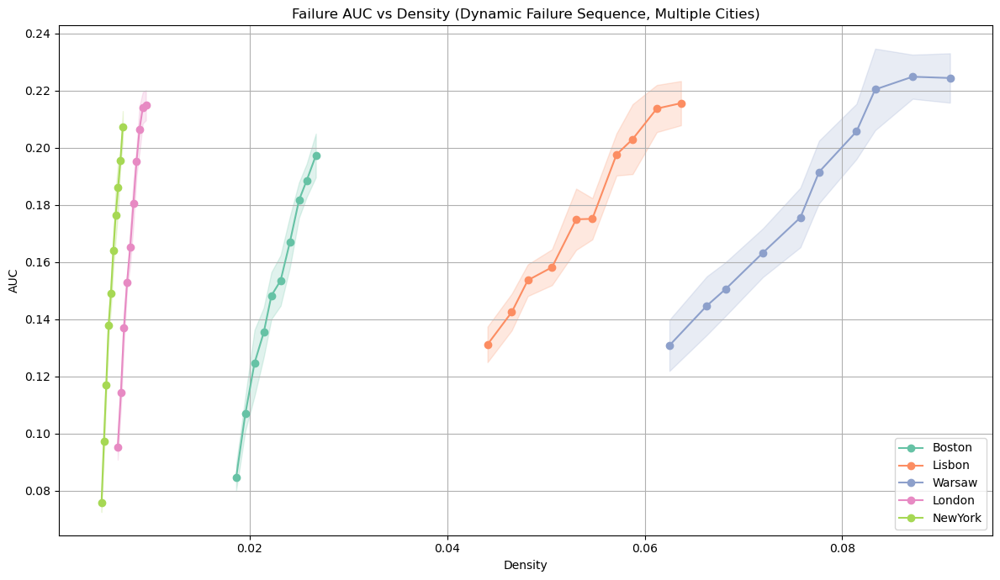

In [23]:
import pickle
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load networks
with open("all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)

# List your target cities (max 5 recommended for clarity)
target_cities = ["Boston", "Lisbon", "Warsaw", "London", "NewYork"]


# target_cities = [
#     "WashingtonDc", "Boston", "Chicago", "Delhi", "Tokyo", "Paris", "Shanghai", "London", "NewYork", "Budapest",
#     "Cairo", "Copenhagen", "Montreal", "SanFrancisco", "Vienna", "Philadelphia", "Kobe", "Naples", "Marseille",
#     "Toulouse", "Lyon", "Amsterdam", "Bilbao", "Lisbon", "Dubai", "Vancouver", "Rotterdam", "Rome", "Toronto",
#     "BuenosAires", "Valencia", "Stockholm", "Oslo", "Athens", "Warsaw", "Atlanta", "Berlin", "Brussels",
#     "Hyderabad", "Lille", "Madrid", "Milan", "Nuremberg", "Prague", "Santiago"
# ]

palette = sns.color_palette("Set2", n_colors=len(target_cities))

def modify_density_safely(G, target_density, max_attempts=5000):
    G_mod = G.copy()
    n = G.number_of_nodes()
    target_edges = int(target_density * n * (n - 1) / 2)
    current_edges = G_mod.number_of_edges()
    attempts = 0
    if current_edges < target_edges:
        while G_mod.number_of_edges() < target_edges and attempts < max_attempts:
            u, v = np.random.choice(list(G_mod.nodes()), 2, replace=False)
            if not G_mod.has_edge(u, v):
                G_mod.add_edge(u, v)
            attempts += 1
    return G_mod

def compute_attributes(G):
    # Get largest connected component subgraph
    largest_cc_nodes = max(nx.connected_components(G), key=len)
    Gcc = G.copy()

    return {
        "Nodes": Gcc.number_of_nodes(),
        "Edges": Gcc.number_of_edges(),
        "Density": nx.density(Gcc),
        "Diameter": nx.diameter(Gcc),
        "Modularity": nx.community.modularity(Gcc, list(nx.community.label_propagation_communities(Gcc))),
        "Clustering_Coefficient": nx.average_clustering(Gcc),
        "Assortativity": nx.degree_assortativity_coefficient(Gcc),
        "Global_Efficiency": nx.global_efficiency(Gcc),
        "Avg_SPL": nx.average_shortest_path_length(Gcc)
    }

plt.figure(figsize=(12, 7))
results = []

for idx, city in enumerate(target_cities):
    G_original = networks[city]
    original_density = nx.density(G_original)
    density_steps = [original_density * (1 + 0.05 * i) for i in range(1, 11)]

    density_list, auc_means, auc_lows, auc_highs = [], [], [], []

    print(f"\n=== {city.upper()} ===")
    for i, target_density in enumerate(density_steps):
        aucs = []
        attr_dicts = []
        G_snapshot = None

        for sim in range(10):
            G_mod = modify_density_safely(G_original, target_density)
            perf, _ = simulate_failure_domirank(G_mod, 1)
            auc = plot_area_failure(perf, "domirank")
            aucs.append(auc)

            if sim == 9:
                attr = compute_attributes(G_mod)
                attr_dicts.append(attr)
                G_snapshot = G_mod  # Save for printing

        mean_auc = np.mean(aucs)
        std_err = np.std(aucs, ddof=1) / np.sqrt(len(aucs))
        ci = 1.96 * std_err
        actual_density = nx.density(G_snapshot)

        density_list.append(actual_density)
        auc_means.append(mean_auc)
        auc_lows.append(mean_auc - ci)
        auc_highs.append(mean_auc + ci)

        print(f"\nStep {i+1} | Target Density: {target_density:.4f}")
        for key, val in attr_dicts[0].items():
            print(f"  {key:25s}: {val:.4f}" if isinstance(val, float) else f"  {key:25s}: {val}")
        print("AUC value is ",auc)

        # === Print per-step delta AUC ===
        auc_deltas = [round(auc_means[i + 1] - auc_means[i], 4) for i in range(len(auc_means) - 1)]
        print(f"{city} AUC increase at each step: {auc_deltas}")

    # Plotting
    color = palette[idx]
    plt.plot(density_list, auc_means, marker='o', color=color, label=city)
    plt.fill_between(density_list, auc_lows, auc_highs, color=color, alpha=0.2)

    # Average gradient
    if len(density_list) >= 2:
        delta_y = auc_means[-1] - auc_means[0]
        delta_x = density_list[-1] - density_list[0]
        avg_gradient = delta_y / delta_x if delta_x != 0 else float('inf')
        results.append((city, avg_gradient))

results_sorted = sorted(results, key=lambda x: x[0])

# Finalize plot
plt.title("Failure AUC vs Density (Dynamic Failure Sequence, Multiple Cities)")
plt.xlabel("Density")
plt.ylabel("AUC")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [71]:
results_sorted = sorted(results, key=lambda x: x[1])
results_sorted

[('Kobe', 2.2306397306397305),
 ('Naples', 2.3237068965517254),
 ('Marseille', 2.947179487179487),
 ('Warsaw', 3.105882352941177),
 ('Amsterdam', 3.4490277777777774),
 ('Toulouse', 3.8619195046439594),
 ('Copenhagen', 3.9187499999999984),
 ('Lyon', 4.000406504065039),
 ('Atlanta', 4.046003016591253),
 ('Bilbao', 4.258914728682171),
 ('Lisbon', 4.49767156862745),
 ('SanFrancisco', 4.818542199488492),
 ('Lille', 4.832483302975105),
 ('Dubai', 4.989351851851849),
 ('Philadelphia', 5.188235294117649),
 ('Vancouver', 5.308490566037738),
 ('Nuremberg', 5.736),
 ('Budapest', 5.909879406307981),
 ('Athens', 6.4856630824372745),
 ('Prague', 6.569491525423729),
 ('Hyderabad', 7.005263157894735),
 ('Cairo', 7.258064516129037),
 ('Rome', 7.354791154791157),
 ('Brussels', 7.414691358024692),
 ('Rotterdam', 7.6006587914584305),
 ('Toronto', 7.765131578947369),
 ('Montreal', 8.350189753320684),
 ('BuenosAires', 8.669553630912732),
 ('WashingtonDc', 10.399844720496896),
 ('Valencia', 10.47817129629629

In [226]:
def simulate_failure_fixed_sequence(G, removal_sequence):
    H = G.copy()
    failure_performance = []

    initial_performance = calculate_network_performance(H)
    failure_performance.append(1.0)

    for node in removal_sequence:
        if node in H:
            H.remove_node(node)
        current_performance = calculate_network_performance(H)
        functionality_ratio = current_performance / initial_performance if initial_performance > 0 else 0
        failure_performance.append(functionality_ratio)

    return failure_performance



Processing Boston...
Boston | Density: 0.0186 | Mean AUC: 0.1108 ± 0.0109
Boston | Density: 0.0196 | Mean AUC: 0.1664 ± 0.0179
Boston | Density: 0.0205 | Mean AUC: 0.1821 ± 0.0098
Boston | Density: 0.0214 | Mean AUC: 0.2159 ± 0.0118
Boston | Density: 0.0222 | Mean AUC: 0.2443 ± 0.0102
Boston | Density: 0.0231 | Mean AUC: 0.2562 ± 0.0110
Boston | Density: 0.0241 | Mean AUC: 0.2612 ± 0.0100
Boston | Density: 0.0250 | Mean AUC: 0.2660 ± 0.0077
Boston | Density: 0.0258 | Mean AUC: 0.2745 ± 0.0070
Boston | Density: 0.0267 | Mean AUC: 0.2773 ± 0.0082

Processing Lisbon...
Lisbon | Density: 0.0441 | Mean AUC: 0.1464 ± 0.0099
Lisbon | Density: 0.0465 | Mean AUC: 0.1738 ± 0.0152
Lisbon | Density: 0.0482 | Mean AUC: 0.1819 ± 0.0106
Lisbon | Density: 0.0506 | Mean AUC: 0.2192 ± 0.0119
Lisbon | Density: 0.0531 | Mean AUC: 0.2332 ± 0.0149
Lisbon | Density: 0.0547 | Mean AUC: 0.2382 ± 0.0109
Lisbon | Density: 0.0571 | Mean AUC: 0.2561 ± 0.0131
Lisbon | Density: 0.0588 | Mean AUC: 0.2542 ± 0.0084
Li

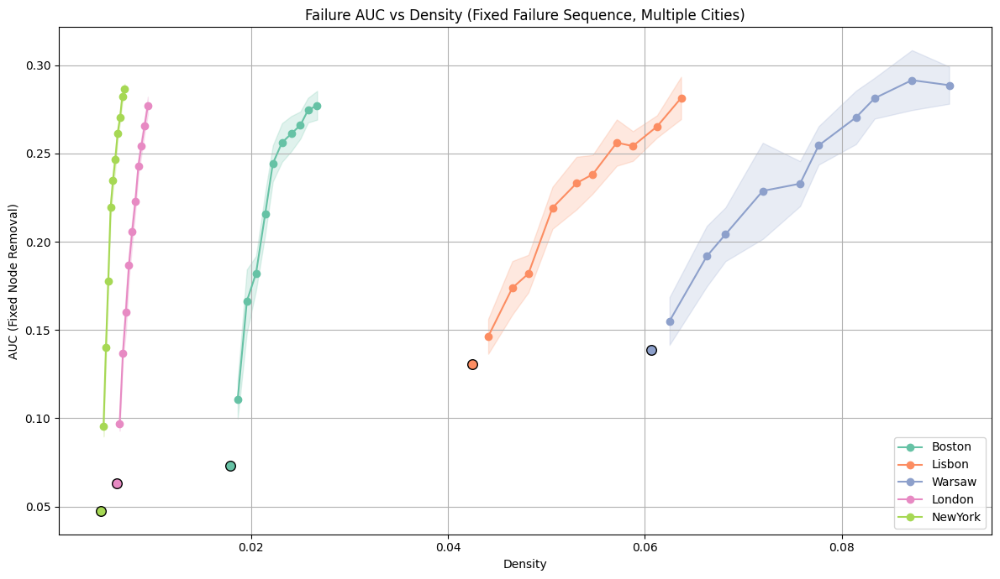

In [230]:
import pickle
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load networks
with open("all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)

# Modify density safely
def modify_density_safely(G, target_density, max_attempts=5000):
    G_mod = G.copy()
    n = G.number_of_nodes()
    target_edges = int(target_density * n * (n - 1) / 2)
    attempts = 0
    while G_mod.number_of_edges() < target_edges and attempts < max_attempts:
        u, v = np.random.choice(list(G_mod.nodes()), 2, replace=False)
        if not G_mod.has_edge(u, v):
            G_mod.add_edge(u, v)
        attempts += 1
    return G_mod



# ======= Choose target cities here =======
target_cities = ["Boston", "Lisbon", "Warsaw", "London", "NewYork"]
palette = sns.color_palette("Set2", n_colors=len(target_cities))

plt.figure(figsize=(12, 7))

for idx, city in enumerate(target_cities):
    print(f"\nProcessing {city}...")

    G_original = networks[city]
    original_density = nx.density(G_original)

    # Get original sequence
    perf_original, removal_sequence = simulate_failure_domirank(G_original, sigma=1.0)
    auc_original = plot_area_failure(perf_original, "domirank")

    # Define retrofitting steps
    density_steps = [original_density * (1 + 0.05 * i) for i in range(1, 11)]
    density_vals, auc_means, auc_lows, auc_highs = [], [], [], []

    for target_density in density_steps:
        aucs = []
        for _ in range(10):
            G_mod = modify_density_safely(G_original, target_density)
            perf = simulate_failure_fixed_sequence(G_mod, removal_sequence)
            auc = plot_area_failure(perf, "domirank")
            aucs.append(auc)

        aucs = np.array(aucs)
        mean_auc = aucs.mean()
        std_err = aucs.std(ddof=1) / np.sqrt(len(aucs))
        ci = 1.96 * std_err

        actual_density = nx.density(G_mod)
        density_vals.append(actual_density)
        auc_means.append(mean_auc)
        auc_lows.append(mean_auc - ci)
        auc_highs.append(mean_auc + ci)

        print(f"{city} | Density: {actual_density:.4f} | Mean AUC: {mean_auc:.4f} ± {ci:.4f}")

    color = palette[idx]

    # Red dot for original point
    plt.scatter([original_density], [auc_original], color=color, edgecolor="black", s=70, zorder=5)

    # Line with CI shaded
    plt.plot(density_vals, auc_means, color=color, marker='o', label=city)
    plt.fill_between(density_vals, auc_lows, auc_highs, color=color, alpha=0.2)

# Plot config
plt.xlabel("Density")
plt.ylabel("AUC (Fixed Node Removal)")
plt.title("Failure AUC vs Density (Fixed Failure Sequence, Multiple Cities)")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
import pickle
import numpy as np

# === Load your results ===
with open("visuals_for_paper/recovery_results.pkl", "rb") as f:
    failure_data = pickle.load(f)

# === Function to compute AUC ===
def compute_auc(series):
    return np.trapz(series, dx=1) / len(series)

# === Iterate through all cities
print(f"{'City':<20} {'Random_AUC':>12} {'Upper_AUC':>12} {'Lower_AUC':>12}")
print("="*60)

for city, data in failure_data.items():
    perf_series = data.get("performance_series", {})

    mean_run = perf_series.get("Random")
    ci_upper = perf_series.get("Random_CI_Upper")
    ci_lower = perf_series.get("Random_CI_Lower")

    if mean_run and ci_upper and ci_lower:
        mean_auc = compute_auc(mean_run)
        upper_auc = compute_auc(ci_upper)
        lower_auc = compute_auc(ci_lower)

        print(f"{city:<20} {mean_auc:12.4f} {upper_auc:12.4f} {lower_auc:12.4f}")
    else:
        print(f"{city:<20} {'Missing data':>36}")


In [ ]:
import os
import pandas as pd
import networkx as nx
import pickle

# Load the networks
with open("all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)

# Create output folder
output_folder = "visuals_for_paper/centrality_scores"
os.makedirs(output_folder, exist_ok=True)

# Select first 10 cities
selected_cities = list(networks.keys())[:10]

# Assume a constant optimal_sigma_value
optimal_sigma_value = 0.5

# Loop through and compute centralities
for city in selected_cities:
    G = networks[city]

    # Compute Domirank
    _, domirank_scores = domirank(nx.to_scipy_sparse_array(G), sigma=optimal_sigma_value)
    domirank_dict = {node: domirank_scores[i] for i, node in enumerate(G.nodes)}
    # Compute other centralities
    centralities = {
        "Domirank": domirank_dict,
        "Degree": nx.degree_centrality(G),
        "Closeness": nx.closeness_centrality(G),
        "Betweenness": nx.betweenness_centrality(G),
        "Eigenvector": nx.eigenvector_centrality(G, max_iter=1000, tol=1e-06)
    }

    df = pd.DataFrame(centralities)
    df.index.name = "Node"

    city_filename = f"{output_folder}/{city}.csv"
    df.to_csv(city_filename)



## Retrofitting using specific nodes

In [46]:
## Visualize only Boston map in this block

import pickle
import networkx as nx
import folium

# === Load the graph dictionary ===
with open("all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)

# Select Boston graph
G_B = networks["Boston"]

# Extract node positions (lat/lon)
pos_dict = {
    node: (data["lat"], data["lon"])
    for node, data in G_B.nodes(data=True)
    if "lat" in data and "lon" in data
}

# Compute map center
latitudes = [lat for lat, lon in pos_dict.values()]
longitudes = [lon for lat, lon in pos_dict.values()]
center_lat = sum(latitudes) / len(latitudes)
center_lon = sum(longitudes) / len(longitudes)

# Initialize Folium map
m = folium.Map(location=[center_lat, center_lon], zoom_start=12, tiles='CartoDB positron')

# Add edges
for u, v in G_B.edges():
    if u in pos_dict and v in pos_dict:
        lat_lon_u = pos_dict[u]
        lat_lon_v = pos_dict[v]
        folium.PolyLine(
            locations=[lat_lon_u, lat_lon_v],
            color='gray',
            weight=2,
            opacity=0.7
        ).add_to(m)

# Add nodes
for node_id, (lat, lon) in pos_dict.items():
    folium.CircleMarker(
        location=[lat, lon],
        radius=5,
        color='black',
        fill=True,
        fill_color='black',
        fill_opacity=0.8,
        tooltip=f'Node {node_id}'
    ).add_to(m)

# Show map
m


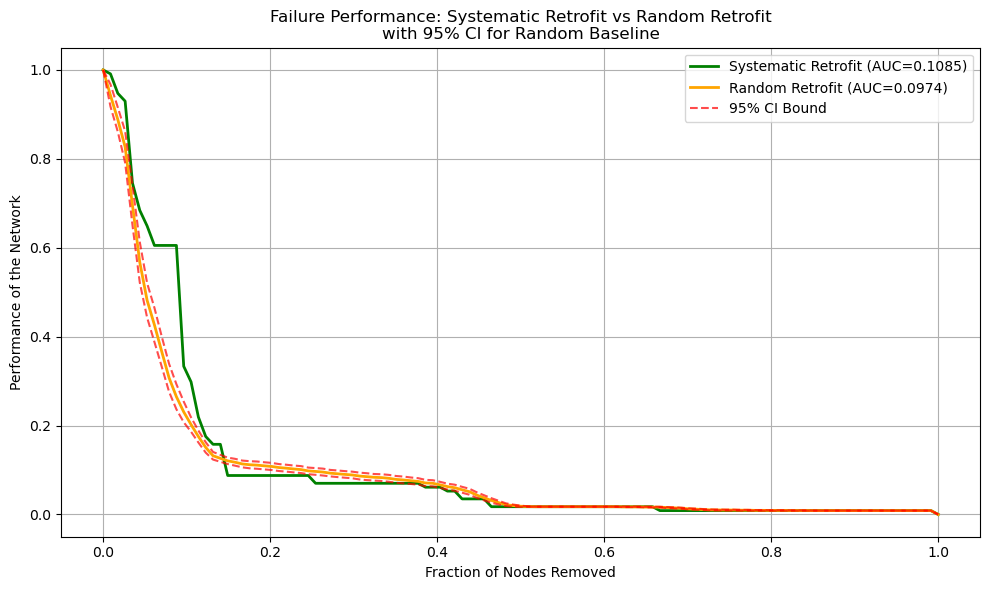

✅ AUC with retrofit edges: 0.1085
🎲 Mean AUC with random edges over 50 trials: 0.0974


In [48]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

# Base graph
G_base = G_B.copy()

# Retrofit edges (fixed)
retrofit_edges = [(27,16), (76,42), (101,25), (26,54), (68,87), (56,45), (7,111), (113,100) , (27,8)]

# Function to compute failure curve and AUC
def compute_failure(G, label):
    perf, _ = simulate_failure_domirank(G, 1)
    auc = plot_area_failure(perf, label)
    return perf, auc

# 1️⃣ Retrofit version
G_retrofit = G_base.copy()
G_retrofit.add_edges_from(retrofit_edges)
perf_retrofit, auc_retrofit = compute_failure(G_retrofit, "Retrofit")

# 2️⃣ Random baseline: average over multiple runs
def add_random_edges(G, num_edges=7, max_attempts=5000):
    G_rand = G.copy()
    attempts = 0
    nodes = list(G.nodes())
    added = 0
    while added < num_edges and attempts < max_attempts:
        u, v = np.random.choice(nodes, 2, replace=False)
        if not G_rand.has_edge(u, v):
            G_rand.add_edge(u, v)
            added += 1
        attempts += 1
    return G_rand

random_trials = 50
perf_random_all = []
auc_random_all = []

for _ in range(random_trials):
    G_rand = add_random_edges(G_base, num_edges=len(retrofit_edges))
    perf, auc = compute_failure(G_rand, label=None)
    perf_random_all.append(perf)
    auc_random_all.append(auc)

perf_random_all = np.array(perf_random_all)
perf_random_mean = np.mean(perf_random_all, axis=0)
auc_random_mean = np.mean(auc_random_all)

# 95% Confidence Interval for random baseline (per fraction of nodes removed)
confidence = 0.95
n = random_trials
stderr = stats.sem(perf_random_all, axis=0)
h = stderr * stats.t.ppf((1 + confidence) / 2., n - 1)
ci_lower = perf_random_mean - h
ci_upper = perf_random_mean + h

# 3️⃣ Plot both
plt.figure(figsize=(10, 6))
x = np.linspace(0, 1, len(perf_retrofit))

# Retrofit curve
plt.plot(x, perf_retrofit, label=f"Systematic Retrofit (AUC={auc_retrofit:.4f})", color='green', lw=2)

# Random curve with CI
plt.plot(x, perf_random_mean, label=f"Random Retrofit (AUC={auc_random_mean:.4f})", color='orange', lw=2)
plt.plot(x, ci_lower, '--', color='red', alpha=0.7, label='95% CI Bound')
plt.plot(x, ci_upper, '--', color='red', alpha=0.7)

plt.xlabel("Fraction of Nodes Removed")
plt.ylabel("Performance of the Network")
plt.title("Failure Performance: Systematic Retrofit vs Random Retrofit\nwith 95% CI for Random Baseline")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("retrofitting_figures/failure_retrofitting_resilience_curve.svg",
            format='svg', dpi=300, bbox_inches='tight')
plt.show()

# 4️⃣ Print results
print(f"✅ AUC with retrofit edges: {auc_retrofit:.4f}")
print(f"🎲 Mean AUC with random edges over {random_trials} trials: {auc_random_mean:.4f}")


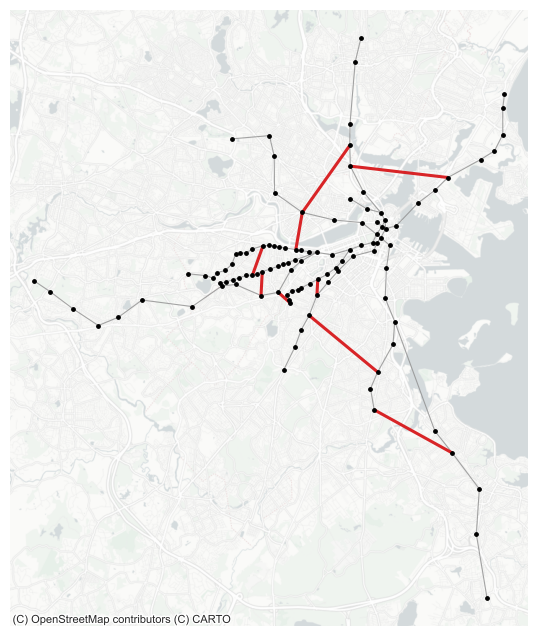

✅ Saved map with background to: visuals_for_paper/new_figures/retrofitting_figures/boston_retrofit_map_failure.svg


In [2]:
# ===== Static Boston map with basemap background and retrofitted edges =====
import os
import pickle
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import contextily as ctx
from shapely.geometry import LineString, Point
import matplotlib.patches as mpatches

# ---------- Load graphs ----------
with open("all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)

G_B = networks["Boston"]

# ---------- Node coordinates ----------
pos_dict = {
    n: (d["lon"], d["lat"])  # shapely uses (x=lon, y=lat)
    for n, d in G_B.nodes(data=True)
    if "lat" in d and "lon" in d
}

# ---------- Retrofit edges ----------
retrofit_edges = [(27,16), (76,42), (101,25), (26,54), (68,87), (56,45), (7,111), (113,100), (27,8)]

# ---------- Build GeoDataFrames ----------
edge_geoms = [
    LineString([pos_dict[u], pos_dict[v]])
    for u, v in G_B.edges()
    if u in pos_dict and v in pos_dict
]
gdf_edges = gpd.GeoDataFrame(geometry=edge_geoms, crs="EPSG:4326")

retrofit_geoms = [
    LineString([pos_dict[u], pos_dict[v]])
    for u, v in retrofit_edges
    if u in pos_dict and v in pos_dict
]
gdf_retro = gpd.GeoDataFrame(geometry=retrofit_geoms, crs="EPSG:4326")

node_points = [Point(lon, lat) for lon, lat in pos_dict.values()]
gdf_nodes = gpd.GeoDataFrame({"node_id": list(pos_dict.keys())}, geometry=node_points, crs="EPSG:4326")

# ---------- Project to Web Mercator ----------
gdf_edges_plt = gdf_edges.to_crs(epsg=3857)
gdf_retro_plt = gdf_retro.to_crs(epsg=3857)
gdf_nodes_plt = gdf_nodes.to_crs(epsg=3857)

# ---------- Plot ----------
fig, ax = plt.subplots(figsize=(8, 8))

# Plot basemap first
xmin, ymin, xmax, ymax = gdf_nodes_plt.total_bounds
dx, dy = xmax - xmin, ymax - ymin
buffer_x, buffer_y = 0.05 * dx, 0.05 * dy
ax.set_xlim(xmin - buffer_x, xmax + buffer_x)
ax.set_ylim(ymin - buffer_y, ymax + buffer_y)

# Add basemap (Carto light gray)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.PositronNoLabels)

# Plot original edges
gdf_edges_plt.plot(ax=ax, color="#8f8f8f", linewidth=0.8, alpha=0.8, zorder=2)

# Retrofit links
if len(gdf_retro_plt) > 0:
    gdf_retro_plt.plot(ax=ax, color="#d7191c", linewidth=2.2, alpha=0.95, zorder=3)

# Nodes
gdf_nodes_plt.plot(ax=ax, color="black", markersize=6, zorder=4)


# Remove axes
ax.set_axis_off()

# Save to requested path
save_path = "retrofitting_figures/boston_retrofit_map_failure.svg"
os.makedirs(os.path.dirname(save_path), exist_ok=True)
plt.savefig(save_path, format="svg", dpi=600, bbox_inches="tight", pad_inches=0.02)
plt.show()

print(f"✅ Saved map with background to: {save_path}")


In [31]:
import pickle
import networkx as nx
import numpy as np
from itertools import combinations
import random

# Load Boston graph
with open("all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)
G_boston = networks["Boston"]

# ---- Step 1: MRKC Edge Addition ----
def get_top_core_edges(G, k=100):
    core_nums = nx.core_number(G)
    candidates = []
    nodes = list(G.nodes())

    # Consider edges between high-core nodes that don't exist yet
    for u, v in combinations(nodes, 2):
        if not G.has_edge(u, v) and core_nums[u] >= 2 and core_nums[v] >= 2:
            candidates.append((u, v, core_nums[u] + core_nums[v]))

    # Sort by combined core number (descending)
    candidates.sort(key=lambda x: -x[2])
    top_edges = [(u, v) for u, v, _ in candidates[:k]]
    return top_edges

G_mrkc = G_boston.copy()
mrkc_edges = get_top_core_edges(G_mrkc, k=5)
G_mrkc.add_edges_from(mrkc_edges)

# ---- Step 2: Random Edge Addition ----
def get_random_new_edges(G, k=50, seed=42):
    np.random.seed(seed)
    edges = []
    attempts = 0
    while len(edges) < k and attempts < 5000:
        u, v = np.random.choice(list(G.nodes()), 2, replace=False)
        if not G.has_edge(u, v):
            edges.append((u, v))
            G.add_edge(u, v)
        attempts += 1
    return edges

G_rand = G_boston.copy()
rand_edges = get_random_new_edges(G_rand,k=5)

# ---- Step 3: Simulate Domirank Failure ----
def compute_auc_domirank(G):
    perf, _ = simulate_failure_domirank(G, sigma=1.0)
    auc = plot_area_failure(perf, "domirank")
    return auc

auc_mrkc = compute_auc_domirank(G_mrkc)
auc_rand = compute_auc_domirank(G_rand)
auc_original = compute_auc_domirank(G_boston)

# ---- Step 4: Print Comparison ----
print("\n=== Boston Network Edge Augmentation Comparison ===")
print(f"Original AUC:      {auc_original:.4f}")
print(f"MRKC Augmented AUC: {auc_mrkc:.4f}")
print(f"Random Augmented AUC: {auc_rand:.4f}")
print("\nMRKC Edges Added:", mrkc_edges)
print("Random Edges Added:", rand_edges)



=== Boston Network Edge Augmentation Comparison ===
Original AUC:      0.0732
MRKC Augmented AUC: 0.0747
Random Augmented AUC: 0.0675

MRKC Edges Added: [(53, 39), (53, 77), (97, 77), (39, 47)]
Random Edges Added: [(42, 100), (39, 86), (88, 39), (78, 59), (104, 59)]


In [33]:
import folium
from folium import FeatureGroup, LayerControl
from IPython.display import display
import matplotlib.pyplot as plt

def plot_network_folium(G, new_edges, title):
    # Get center of map
    lats = [G.nodes[n]['lat'] for n in G.nodes if 'lat' in G.nodes[n]]
    lons = [G.nodes[n]['lon'] for n in G.nodes if 'lon' in G.nodes[n]]
    center_lat, center_lon = np.mean(lats), np.mean(lons)

    fmap = folium.Map(location=[center_lat, center_lon], zoom_start=13, control_scale=True,tiles='CartoDB positron')
    nodes_group = FeatureGroup(name='Nodes', show=True)
    base_edges_group = FeatureGroup(name='Original Edges', show=True)
    new_edges_group = FeatureGroup(name='New Edges (Blue)', show=True)

    # Draw original edges in gray
    for u, v in G.edges():
        color = 'blue' if (u, v) in new_edges or (v, u) in new_edges else 'gray'
        layer = new_edges_group if color == 'blue' else base_edges_group

        latlng = [
            (G.nodes[u]['lat'], G.nodes[u]['lon']),
            (G.nodes[v]['lat'], G.nodes[v]['lon'])
        ]
        folium.PolyLine(latlng, color=color, weight=2, opacity=0.7).add_to(layer)

    # Draw nodes in black
    for n in G.nodes():
        lat, lon = G.nodes[n]['lat'], G.nodes[n]['lon']
        folium.CircleMarker(location=(lat, lon), radius=2, color="black", fill=True, fill_opacity=1).add_to(nodes_group)

    fmap.add_child(base_edges_group)
    fmap.add_child(new_edges_group)
    fmap.add_child(nodes_group)
    fmap.add_child(LayerControl())

    return fmap


In [34]:
# Save and open in browser (for Jupyter Notebooks or local runs)
folium_mrkc.save("boston_mrkc_map.html")
folium_rand.save("boston_random_map.html")

import webbrowser
webbrowser.open("boston_mrkc_map.html")
webbrowser.open("boston_random_map.html")


NameError: name 'folium_mrkc' is not defined

In [151]:
import pickle
import networkx as nx
import numpy as np
from itertools import combinations
import random

# Load Boston graph
with open("all_networks.gpickle", "rb") as f:
    networks = pickle.load(f)
G_boston = networks["Boston"]
top_n=10
# ---- Step 1: Top Betweenness Node Pair Edge Addition ----
def get_top_betweenness_edges(G, top_n=10):
    betweenness = nx.eigenvector_centrality(G)
    top_nodes = sorted(betweenness, key=betweenness.get, reverse=True)[:top_n]
    
    candidates = []
    for u, v in combinations(top_nodes, 2):
        if not G.has_edge(u, v):
            candidates.append((u, v))
    return candidates[:top_n]  # Add max 10 edges

G_btwn = G_boston.copy()
btwn_edges = get_top_betweenness_edges(G_btwn, top_n)
G_btwn.add_edges_from(btwn_edges)

# ---- Step 2: Random Edge Addition (10 edges) ----
def get_random_new_edges(G, k=10, seed=42):
    np.random.seed(seed)
    edges = []
    attempts = 0
    while len(edges) < k and attempts < 5000:
        u, v = np.random.choice(list(G.nodes()), 2, replace=False)
        if not G.has_edge(u, v):
            edges.append((u, v))
            G.add_edge(u, v)
        attempts += 1
    return edges

G_rand = G_boston.copy()
rand_edges = get_random_new_edges(G_rand, top_n)

# ---- Step 3: Simulate Domirank Failure ----
def compute_auc_domirank(G):
    perf, _ = simulate_failure_degree(G, sigma=1.0)
    auc = plot_area_failure(perf, "domirank")
    return auc

auc_btwn = compute_auc_domirank(G_btwn)
auc_rand = compute_auc_domirank(G_rand)
auc_original = compute_auc_domirank(G_boston)

# ---- Step 4: Print Comparison ----
print("\n=== Boston Network Edge Augmentation Comparison ===")
print(f"Original AUC:          {auc_original:.4f}")
print(f"Top-Betweenness AUC:   {auc_btwn:.4f}")
print(f"Random Augmented AUC:  {auc_rand:.4f}")
print("\nTop Betweenness Edges Added:", btwn_edges)
print("Random Edges Added:", rand_edges)


Initial perfr is :  114
Functionality after removing node 0: 1
Functionality after removing node 1: 0.9912280701754386
Functionality after removing node 2: 0.8070175438596491
Functionality after removing node 3: 0.8070175438596491
Functionality after removing node 4: 0.5964912280701754
Functionality after removing node 5: 0.5263157894736842
Functionality after removing node 6: 0.5263157894736842
Functionality after removing node 7: 0.5263157894736842
Functionality after removing node 8: 0.15789473684210525
Functionality after removing node 9: 0.15789473684210525
Functionality after removing node 10: 0.15789473684210525
Functionality after removing node 11: 0.15789473684210525
Functionality after removing node 12: 0.15789473684210525
Functionality after removing node 13: 0.15789473684210525
Functionality after removing node 14: 0.15789473684210525
Functionality after removing node 15: 0.15789473684210525
Functionality after removing node 16: 0.15789473684210525
Functionality after remov